In [1]:
from getdist import plots, MCSamples
%matplotlib inline
from matplotlib import pyplot as plt
import getdist
import numpy as np
import os
import sacc
import scipy.stats
import sys
sys.path.append('../../S8z/Cls_v2/')
from cl import Cl_fid
import yaml
from scipy.interpolate import interp1d
import pyccl as ccl
import latextable

MP_root = '/mnt/zfsusers/gravityls_3/codes/montepython_emilio'


################
# Functions to read the data and bestfit .npz files written by the lkl
################

def split_vector_array(ells, chi2):
    ells_ar = []
    chi2_ar = []

    chi2_ar_tmp = []
    ells_ar_tmp = []
    for i, l in enumerate(ells):
        if (i > 0) and (l <= ells_ar_tmp[-1]):
            ells_ar.append(np.array(ells_ar_tmp))
            chi2_ar.append(np.array(chi2_ar_tmp))
            
            ells_ar_tmp = []
            chi2_ar_tmp = []

        ells_ar_tmp.append(l)
        chi2_ar_tmp.append(chi2[i])
    ells_ar.append(np.array(ells_ar_tmp))
    chi2_ar.append(np.array(chi2_ar_tmp))
    
    return ells_ar, chi2_ar


def extract_info(InlineLatex, return_z=True):
    if '=' in InlineLatex:
        lhs, rhs = InlineLatex.split('=')
        if '\pm' in rhs:
            mean, errors = rhs.split('\pm')
            up = down = float(errors)
        else:
            mean, errors = rhs.split('^{')
            up, down = errors.split('}_{-')
            up = float(up)
            down = float(down[:-1])  
        mean = float(mean)
    elif '<' in InlineLatex:
        lhs, rhs = InlineLatex.split('<')
        mean = float(rhs) / 2.
        up = down = mean
    if not return_z:
        return mean, up, down
    
    if '{' in lhs:
        z = float(lhs.split('_{')[-1].split('}')[0])
    elif '(' in lhs:
        z = float(lhs.split('(')[-1].split(')')[0])
    elif '_' in lhs:
        z = float(lhs.split('_')[1])

    return z, mean, up, down
      
        
def get_ell_cl_bf_arr(info, bf, tracers, return_res=False):
    ix = np.where(np.all(info['tracers'] == tracers, axis=1))[0][0]
    ells, cls = split_vector_array(info['ells'], bf['cls'])
    if not return_res:
        return ells[ix], cls[ix]
    else:
        _, res = split_vector_array(info['ells'], bf['res'])
        return ells[ix], cls[ix], res[ix]

####
# Functions used when plotting
###
    
def get_ellcuts(yml, tr1, tr2):
    for trc in yml['tracer_combinations']:
        if [tr1, tr2] == trc['tracers']:
            return trc['ell_cuts']

        
def plot_interp1d_S8z(ax, sigma8z, label, cl, kind='quadratic'):
    z_fine = np.linspace(0, 2, 512)
    sigma8z_interp = interp1d(sigma8z[0], sigma8z[1], kind=kind)
    sigma8z_interp_p = interp1d(sigma8z[0], sigma8z[1] + sigma8z[2], kind=kind)
    sigma8z_interp_m = interp1d(sigma8z[0], sigma8z[1] - sigma8z[3], kind=kind)  

    ax.plot(z_fine, sigma8z_interp(z_fine), label=label, color=cl)
    ax.fill_between(z_fine, sigma8z_interp_p(z_fine), sigma8z_interp_m(z_fine),
                     alpha=.5, color=cl)
    
################
# Function to add fsigma8
# f = dlog(D)/dlog(a) = dlog(spline(dpk))/dlog(a)
################

def add_fsigma8(chain):
    z_arr = np.linspace(0, 2, 25)  # i.e. 1, 1.1, 1.2... 2.
    cosmo = ccl.Cosmology(h= 0.6736, Omega_c=0.2640, Omega_b=0.0493, n_s=0.9649, sigma8=0.8111)
    # Find the nodes
    dpk_z = []
    pnlist = chain.getParamNames().list()
    for pn in pnlist:
        if 'dpk' in pn:
            dpk_z.append(float(pn.split('_')[-1]))
    dpk_z.sort()
    dpk_z = np.array(dpk_z)
    z_arr = np.unique(np.concatenate([z_arr, dpk_z]))
    z_arr.sort()
    
    nsteps = chain.samples.shape[0]
    fsigma8 = np.zeros((nsteps, z_arr.size))
    z_nodes = np.zeros(dpk_z.size + 1)
    nodes = np.zeros_like(z_nodes)
    z_nodes[:-1] = dpk_z
    z_nodes[-1] = 5  # anchor for binning_softer
    nodes[-1] = ccl.growth_factor(cosmo, 1 / (5 + 1))
    for i in range(nsteps):
        pd = chain.getParamSampleDict(i)
        for j, zj in enumerate(dpk_z):
            nodes[j] = pd[f'dpk_{zj}']
        logDz = interp1d(np.log(z_nodes+1), np.log(nodes), kind='quadratic',
                      fill_value='extrapolate')
        f = -1 * logDz._spline.derivative()(np.log(z_arr+1)).flatten()
        fsigma8[i] = f * np.exp(logDz(np.log(z_arr + 1))) * 0.8111
        
    for j, zj in enumerate(z_arr):
        pn = 'fsigma8_' + str(zj)
        if (pn in pnlist):
            continue
        chain.addDerived(fsigma8[:, j], pn, r'f \sigma8_{' + str(zj) + '}') #, range=(0, None))
        
################
# Functions to add S8z parameters to the GetDist chains
################

def add_S8tz(chain):
    size = chain.loglikes.shape[0]

    d = chain.getParamSampleDict(0)
    j = 0
    z_arr = []
    for k, v in d.items():
        if 'S8z' in k:
            z = float(k.split('_')[-1])
            z_arr.append(z)
            j+=1

    z_arr = np.array(z_arr)
    St8 = np.zeros((size, j))

    for i in range(size): 
        d = chain.getParamSampleDict(i)
        j = 0
        for k, v in d.items():
            if not 'S8z' in k:
                continue
            z = float(k.split('_')[-1])
            Omegam_z_factor = np.sqrt((z + 1)**3 / (d['Omega_m'] * (z + 1)**3 + (1 - d['Omega_m'])))
            St8[i, j] = v * Omegam_z_factor
            j += 1

    for i in range(j):
        chain.addDerived(St8[:, i], f'S8tz_{z_arr[i]}', 'S8tz_{{{}}}'.format(z_arr[i]))

def add_S8z_at_nodes(chain):
    size = chain.samples.shape[0]
    paramNames = chain.getParamNames().list()
    dpk_z = []
    for pn in paramNames:
        if 'dpk' in pn:
            dpk_z.append(pn.split('_')[-1])
    dpk_z.sort()
    S8z = np.zeros((size, len(dpk_z)))
    for i in range(size):
        pd = chain.getParamSampleDict(i)
        for j, z in enumerate(dpk_z):
            S8z[i, j] = pd[f'dpk_{z}'] * 0.8111 * np.sqrt(pd['Omega_m'] / 0.3)
    
    for j, z in enumerate(dpk_z):
        chain.addDerived(S8z[:, j], f'S8z_{z}', 'S8z_{{{}}}'.format(z)) #, range=(0, None))
        
def add_interpd_S8z(chain):
#     z_arr = np.linspace(0, 2, 50)
    z_arr = np.linspace(1, 2, 11)  # i.e. 1, 1.1, 1.2... 2.
    cosmo = ccl.Cosmology(h= 0.6736, Omega_c=0.2640, Omega_b=0.0493, n_s=0.9649, sigma8=0.8111)
    # Find the nodes
    dpk_z = []
    pnlist = chain.getParamNames().list()
    for pn in pnlist:
        if 'dpk' in pn:
            dpk_z.append(float(pn.split('_')[-1]))
    dpk_z.sort()
    dpk_z = np.array(dpk_z)
    z_arr = np.unique(np.concatenate([z_arr, dpk_z]))
    z_arr.sort()
    
    nsteps = chain.samples.shape[0]
    S8z = np.zeros((nsteps, z_arr.size))
    z_nodes = np.zeros(dpk_z.size + 1)
    nodes = np.zeros_like(z_nodes)
    z_nodes[:-1] = dpk_z
    z_nodes[-1] = 5  # anchor for binning_softer
    nodes[-1] = ccl.growth_factor(cosmo, 1 / (5 + 1))
    for i in range(nsteps):
        pd = chain.getParamSampleDict(i)
        for j, zj in enumerate(dpk_z):
            nodes[j] = pd[f'dpk_{zj}']
        z_arr+1
        logDz = interp1d(np.log(z_nodes+1), np.log(nodes), kind='quadratic',
                      fill_value='extrapolate')(np.log(z_arr+1))
        S8z[i] = np.exp(logDz) * 0.8111 * np.sqrt(pd['Omega_m'] / 0.3)
        
    for j, zj in enumerate(z_arr):
        pn = 'S8z_' + str(zj)
        if (pn in pnlist):
            continue
        chain.addDerived(S8z[:, j], pn, 'S8z_{' + str(zj) + '}') #, range=(0, None))    

################


################

DCOLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']
# plt.rcParams['text.usetex'] = True
# plt.rcParams['ytick.labelsize'] = 14
# plt.rcParams['xtick.labelsize'] = 14
# plt.rcParams['axes.labelsize'] = 14
# plt.rcParams['legend.fontsize'] = 14
# plt.rcParams['font.size'] = 14
# plt.rcParams['mathtext.default'] = 'regular'
# plt.rcParams['axes.titlesize'] = 14

# Load chains

## DES related

In [2]:
cname = '/mnt/extraspace/gravityls_3/S8z/data/DES/DY1chains/d_l3.txt'
with open(cname) as f:
    sline = f.readline().split()
    for i, pi in enumerate(sline):
        print(i, pi)

0 #cosmological_parameters--omega_m
1 cosmological_parameters--h0
2 cosmological_parameters--omega_b
3 cosmological_parameters--n_s
4 cosmological_parameters--a_s
5 cosmological_parameters--omnuh2
6 bin_bias--b1
7 bin_bias--b2
8 bin_bias--b3
9 bin_bias--b4
10 bin_bias--b5
11 shear_calibration_parameters--m1
12 shear_calibration_parameters--m2
13 shear_calibration_parameters--m3
14 shear_calibration_parameters--m4
15 intrinsic_alignment_parameters--a
16 intrinsic_alignment_parameters--alpha
17 wl_photoz_errors--bias_1
18 wl_photoz_errors--bias_2
19 wl_photoz_errors--bias_3
20 wl_photoz_errors--bias_4
21 lens_photoz_errors--bias_1
22 lens_photoz_errors--bias_2
23 lens_photoz_errors--bias_3
24 lens_photoz_errors--bias_4
25 lens_photoz_errors--bias_5
26 COSMOLOGICAL_PARAMETERS--SIGMA_8
27 post
28 weight


In [8]:
# # For v3
# pnames = ['Omega_m', 'h', 'Omega_b', 'n_s', 'A_s', 'sigma_8',
#           'DESgc__0_gc_b', 'DESgc__1_gc_b', 'DESgc__2_gc_b', 'DESgc__3_gc_b', 'DESgc__4_gc_b',
#           'DESwl__0_wl_m', 'DESwl__1_wl_m', 'DESwl__2_wl_m', 'DESwl__3_wl_m',
#           'DESgc__0_gc_dz', 'DESgc__1_gc_dz', 'DESgc__2_gc_dz', 'DESwl__3_gc_dz', 'DESgc__4_gc_dz',
#           'DESwl__0_wl_dz', 'DESwl__1_wl_dz', 'DESwl__2_wl_dz', 'DESgc__3_wl_dz'
#           ]
# For v2
pnames = ['Omega_m', 'h', 'Omega_b', 'n_s', 'A_s', 'sigma_8',
          'gc_b_0', 'gc_b_1', 'gc_b_2', 'gc_b_3', 'gc_b_4',
          'wl_m_0', 'wl_m_1', 'wl_m_2', 'wl_m_3',
          'gc_dz_0', 'gc_dz_1', 'gc_dz_2', 'gc_dz_3', 'gc_dz_4',
          'wl_dz_0', 'wl_dz_1', 'wl_dz_2', 'wl_dz_3',
          'wl_ia_A', 'wl_ia_eta'
          ]

labels = ['\Omega_m', 'h', '\Omega_b', 'n_s', 'A_s', '\sigma_8', 
          'DESgc_{ 0 b}', 'DESgc_{ 1 b }', 'DESgc_{ 2 b}', 'DESgc_{ 3 b }', 'DESgc_{ 4 b }',
          'DESwl_{0 m}', 'DESwl_{1 m}', 'DESwl_{2 m}', 'DESwl_{3 m}',
           'DESgc_{ 0 dz }', 'DESgc_{ 1 dz }', 'DESgc_{ 2 dz }', 'DESgc_{ 3 dz }', 'DESgc_{ 4 dz }',
          'DESwl_{0 dz}', 'DESwl_{1 dz}', 'DESwl_{2 dz}', 'DESwl_{3 dz}',
          'A_{IA}', '\eta_{IA}']

ix = [0, 1, 2, 3, 4, 26,
      6, 7, 8, 9, 10,
      11, 12, 13, 14,
      21, 22, 23, 24, 25,
      17, 18, 19, 20,
     15, 16]

cname = '/mnt/extraspace/gravityls_3/S8z/data/DES/DY1chains/d_l3.txt'
lchains = np.loadtxt(cname, usecols=ix + [27, 28], unpack=True)
steps, lkl, w = lchains[:len(ix)], lchains[len(ix)], lchains[len(ix)+1]
# Convention
# steps[15:24] *= -1
d_oficial = getdist.mcsamples.MCSamples(samples=steps.T, loglikes=lkl, weights=w,
                                            names=pnames, labels=labels, sampler='nested')
p = d_oficial.getParams()
d_oficial.addDerived(p.sigma_8 * np.sqrt(p.Omega_m / 0.3), 'S_8', 'S_8')

Removed no burn in


In [14]:
try:
    sG
except:
    sG = sacc.Sacc.load_fits('/mnt/extraspace/gravityls_3/S8z/Cls_new_pipeline/4096_DES_eBOSS_CMB/cls_covG_new.fits')

with open('./cl_cross_corr_v3_DES_eBOSS_CMB/cl_cross_corr_v3_DES_eBOSS_CMB.yml') as f:
    dec_yml = yaml.safe_load(f)

load_all_des = False

if load_all_des:
    ###
    # Note that v2 were sampled with the Gaussian only and slightly wrong matrix
    # chi2BF/2 = 337.935 vs 339.216 (sligtly wrong vs right)
    ###

    #######
    ec_di = np.load('./cl_cross_corr_v3_eBOSS_CMB/cl_cross_corr_data_info.npz')
    ec_bfi = np.load('./cl_cross_corr_v3_eBOSS_CMB/cl_cross_corr_bestfit_info.npz')

    ec = getdist.loadMCSamples('./cl_cross_corr_v3_eBOSS_CMB/2021-03-24_1000000_',
                                settings={'ignore_rows':0.1})

    print('ec', ec.getGelmanRubin(7))


    ####
    
    de = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS/2021-03-26_1000000_',
                                             settings={'ignore_rows':0.3})
    de_di = np.load('./cl_cross_corr_v3_DES_eBOSS/cl_cross_corr_data_info.npz')
    de_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS/cl_cross_corr_bestfit_info.npz')

    print('de', de.getGelmanRubin(26))

    ###
    dec_tlr_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_taylor/cl_cross_corr_data_info.npz')
    dec_tlr_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_taylor/cl_cross_corr_bestfit_info.npz')

    dec_tlr = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_taylor/2021-03-21_1000000_',
                                settings={'ignore_rows':0.2})

    print('dec_tlr', dec_tlr.getGelmanRubin(25))
    

    ###
    dec_bin_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning/cl_cross_corr_data_info.npz')
    dec_bin_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning/cl_cross_corr_bestfit_info.npz')

    dec_bin = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning/2021-03-21_1000000_',
                                settings={'ignore_rows':0.5})

    print('dec_bin', dec_bin.getGelmanRubin(30))
    ###
    dec_bin2_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning2/cl_cross_corr_data_info.npz')
    dec_bin2_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning2/cl_cross_corr_bestfit_info.npz')

    dec_bin2 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning2/2021-03-29_1000000_',
                                settings={'ignore_rows':0.5})

    print('dec_bin2', dec_bin2.getGelmanRubin(30))
    

    ###
    dec_bin_s_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer/cl_cross_corr_data_info.npz')
    dec_bin_s_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer/cl_cross_corr_bestfit_info.npz')

    dec_bin_s = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer/2021-03-29_1000000_',
                                settings={'ignore_rows':0.5})

    print('dec_bin_s', dec_bin_s.getGelmanRubin(33))
    
    ###
    dec_bin_s2_nm_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2/cl_cross_corr_data_info.npz')
    dec_bin_s2_nm_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2/cl_cross_corr_bestfit_info.npz')

    dec_bin_s2_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2/2021-03-29_1000000_',
                                settings={'ignore_rows':0.5})
    # add_S8tz(dec_bin_s2)
    print('dec_bin_s2_nm', dec_bin_s2_nm.getGelmanRubin(30))
    add_S8z_at_nodes(dec_bin_s2_nm)
    
#     ###
#     dgcc_bin_s2_di = np.load('./cl_cross_corr_v3_DESgc_CMB_binning_softer_2_backup_noprior/cl_cross_corr_data_info.npz')
#     dgcc_bin_s2_bfi = np.load('./cl_cross_corr_v3_DESgc_CMB_binning_softer_2_backup_noprior/cl_cross_corr_bestfit_info.npz')

#     dgcc_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DESgc_CMB_binning_softer_2_backup_noprior/2021-04-06_1000000_',
#                                 settings={'ignore_rows':0.5})

#     print('dgcc_bin_s2', dgcc_bin_s2.getGelmanRubin(20))
#     ###
#     dec_nm_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB/cl_cross_corr_data_info.npz')
#     dec_nm_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB/cl_cross_corr_bestfit_info.npz')

#     dec_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB/2021-03-13_1000000_',
#                                 settings={'ignore_rows':0.5})

#     print('dec_nm', dec_nm.getGelmanRubin(27))
    
#########################################    
##### Chains that go into the paper #####
#########################################    

##############
#### LCDM ####
##############

##########################

dc = getdist.loadMCSamples('./cl_cross_corr_v3_DES_CMB/2021-03-25_1000000_',
                                         settings={'ignore_rows':0.3})
dc_di = np.load('./cl_cross_corr_v3_DES_CMB/cl_cross_corr_data_info.npz')
dc_bfi = np.load('./cl_cross_corr_v3_DES_CMB/cl_cross_corr_bestfit_info.npz')

print('dc', dc.getGelmanRubin(24))

####
# v2 has slightly wrong covG (and also + covNG)
####
dc2 = getdist.loadMCSamples('./cl_cross_corr_v2_gcgc_gcwl_wlwl_cv/2021-02-24_1000000_',
                                         settings={'ignore_rows':0.3})
dc2_di = np.load('./cl_cross_corr_v2_gcgc_gcwl_wlwl_cv/cl_cross_corr_data_info.npz')
dc2_bfi = np.load('./cl_cross_corr_v2_gcgc_gcwl_wlwl_cv/cl_cross_corr_bestfit_info.npz')

print('dc2', dc2.getGelmanRubin(24))

####
dc_covGNG = getdist.loadMCSamples('./cl_cross_corr_v3_DES_CMB_covGNG/2021-05-23_10000000_',
                                         settings={'ignore_rows':0.3})
dc_covGNG_di = np.load('./cl_cross_corr_v3_DES_CMB_covGNG/cl_cross_corr_data_info.npz')
dc_covGNG_bfi = np.load('./cl_cross_corr_v3_DES_CMB_covGNG/cl_cross_corr_bestfit_info.npz')

print('dc_covGNG', dc_covGNG.getGelmanRubin(24))

################

donly2 = getdist.loadMCSamples('./cl_cross_corr_v2_gcgc_gcwl_wlwl/2021-01-27_1000000_',
                                         settings={'ignore_rows':0.3})
donly2_di = np.load('./cl_cross_corr_v2_gcgc_gcwl_wlwl/cl_cross_corr_data_info.npz')
donly2_bfi = np.load('./cl_cross_corr_v2_gcgc_gcwl_wlwl/cl_cross_corr_bestfit_info.npz')

print('donly2', donly2.getGelmanRubin(25))

################

donly = getdist.loadMCSamples('./cl_cross_corr_v3_DES_2/2021-05-28_10000000_',
                                         settings={'ignore_rows':0.1})
donly_di = np.load('./cl_cross_corr_v3_DES_2/cl_cross_corr_data_info.npz')
donly_bfi = np.load('./cl_cross_corr_v3_DES_2/cl_cross_corr_bestfit_info.npz')

print('donly', donly.getGelmanRubin(25))

################

donly_covGNG = getdist.loadMCSamples('./cl_cross_corr_v3_DES_covGNG/2021-05-29_10000000_',
                                         settings={'ignore_rows':0.3})
donly_covGNG_di = np.load('./cl_cross_corr_v3_DES_covGNG/cl_cross_corr_data_info.npz')
donly_covGNG_bfi = np.load('./cl_cross_corr_v3_DES_covGNG/cl_cross_corr_bestfit_info.npz')

print('donly_covGNG', donly_covGNG.getGelmanRubin(25))

###
dgcec_di = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_mag_correctMag/cl_cross_corr_data_info.npz')
dgcec_bfi = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_mag_correctMag/cl_cross_corr_bestfit_info.npz')

dgcec = getdist.loadMCSamples('./cl_cross_corr_v3_DESgc_eBOSS_CMB_mag_correctMag/2021-06-04_10000000_',
                            settings={'ignore_rows':0.5})

print('dgcec', dgcec.getGelmanRubin(17))


###
dwlc_di = np.load('./cl_cross_corr_v3_DESwl_CMB/cl_cross_corr_data_info.npz')
dwlc_bfi = np.load('./cl_cross_corr_v3_DESwl_CMB/cl_cross_corr_bestfit_info.npz')

dwlc = getdist.loadMCSamples('./cl_cross_corr_v3_DESwl_CMB/2021-05-11_1000000_',
                            settings={'ignore_rows':0.5})

print('dwlc', dwlc.getGelmanRubin(15))

#######
###
dec_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_mag_correctMag/cl_cross_corr_data_info.npz')
dec_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_mag_correctMag/cl_cross_corr_bestfit_info.npz')

dec = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_mag_correctMag/2021-06-02_10000000_',
                            settings={'ignore_rows':0.2})

print('dec', dec.getGelmanRubin(27))



#################
#### Binning ####
#################

###
d_bin_s2_di = np.load('./cl_cross_corr_v3_DES_binning_softer_2_prior/cl_cross_corr_data_info.npz')
d_bin_s2_bfi = np.load('./cl_cross_corr_v3_DES_binning_softer_2_prior/cl_cross_corr_bestfit_info.npz')

d_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_binning_softer_2_prior/2021-04-12_10000000_',
                            settings={'ignore_rows':0.5})

print('d_bin_s2', d_bin_s2.getGelmanRubin(28))
add_S8z_at_nodes(d_bin_s2)

###
dcovGNG_bin_s2_di = np.load('./cl_cross_corr_v3_DES_binning_softer_2_covGNG_prior/cl_cross_corr_data_info.npz')
dcovGNG_bin_s2_bfi = np.load('./cl_cross_corr_v3_DES_binning_softer_2_covGNG_prior/cl_cross_corr_bestfit_info.npz')

dcovGNG_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_binning_softer_2_covGNG_prior/2021-04-12_10000000_',
                                       settings={'ignore_rows':0.5})

print('dcovGNG_bin_s2', dcovGNG_bin_s2.getGelmanRubin(28))
add_S8z_at_nodes(dcovGNG_bin_s2)
###
dgcec_bin_s2_di = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_data_info.npz')
dgcec_bin_s2_bfi = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info.npz')

dgcec_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-05_10000000_',
#                                      chain_exclude=[8],
                                     settings={'ignore_rows':0.5})

print('dgcec_bin_s2', dgcec_bin_s2.getGelmanRubin(20))
add_S8z_at_nodes(dgcec_bin_s2)

###
dwlc_bin_s2_di = np.load('./cl_cross_corr_v3_DESwl_CMB_binning_softer_2/cl_cross_corr_data_info.npz')
dwlc_bin_s2_bfi = np.load('./cl_cross_corr_v3_DESwl_CMB_binning_softer_2/cl_cross_corr_bestfit_info.npz')

dwlc_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DESwl_CMB_binning_softer_2/2021-04-06_1000000_',
                            settings={'ignore_rows':0.5})

print('dwlc_bin_s2', dwlc_bin_s2.getGelmanRubin(18))
add_S8z_at_nodes(dwlc_bin_s2)

###
dec_bin_s2_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_data_info.npz')
dec_bin_s2_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info.npz')

dec_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000_',
                            settings={'ignore_rows':0.25})
# add_S8tz(dec_bin_s2)
print('dec_bin_s2', dec_bin_s2.getGelmanRubin(30))
add_S8z_at_nodes(dec_bin_s2)
# add_fsigma8(dec_bin_s2)

###
# dec_bin_s2l_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_linear_mag_correctMag/cl_cross_corr_data_info.npz')
# dec_bin_s2l_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_linear_mag_correctMag/cl_cross_corr_bestfit_info.npz')

dec_bin_s2l = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_linear_mag_correctMag/2021-06-18_10000000_',
                            settings={'ignore_rows':0.5})

print('dec_bin_s2l', dec_bin_s2l.getGelmanRubin(30))
add_S8z_at_nodes(dec_bin_s2l)


# ###
# dec_bin_s2l_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_linear/cl_cross_corr_data_info.npz')
# dec_bin_s2l_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_linear/cl_cross_corr_bestfit_info.npz')

# dec_bin_s2l = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_linear/2021-04-07_1000000_',
#                             settings={'ignore_rows':0.5})

# print('dec_bin_s2l', dec_bin_s2l.getGelmanRubin(30))
# add_S8z_at_nodes(dec_bin_s2l)

dc 0.015296021155506387
dc2 0.015964386486613524
dc_covGNG 0.032525181706194534
donly2 0.02116330728799936
donly 0.02012669328345325
donly_covGNG 0.041480078085882915
dgcec 0.014852786377136629
dwlc 0.041741935244330106
dec 0.021969601023274485
d_bin_s2 0.022099160098737785
dcovGNG_bin_s2 0.051945854577239076
dgcec_bin_s2 0.039718938975679616
dwlc_bin_s2 0.026090267241414094
./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000__2.txt
./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000__5.txt
./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000__4.txt
./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000__3.txt
./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000__7.txt
./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000__8.txt
./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-

In [5]:
color = {'dec_tlr': DCOLORS[0],
         'dec_bin': DCOLORS[1],
         'dec': 'black', # DCOLORS[2],
         'dc': DCOLORS[3],
         'ec': DCOLORS[4],
         'de': DCOLORS[5],
         'donly': DCOLORS[6],
         'dec_bin_s2': DCOLORS[7], 
         'dec_bin2': DCOLORS[8],
         'dec_bin_s': DCOLORS[9],
         # Repeating. Watch out!
         'dec_bin_s2l': DCOLORS[0],         
         'd_bin_s2': DCOLORS[1],         
         'dgcec_bin_s2': DCOLORS[2],         
         'dgcc_bin_s2': DCOLORS[3],         
         'dwlc_bin_s2': DCOLORS[4],
         'dcovGNG_bin_s2': DCOLORS[5],
         'dgcec': DCOLORS[2],
         'dwlc': DCOLORS[4]
        }

## KiDS related

In [10]:
cname = '/mnt/extraspace/gravityls_3/S8z/data/K1000/KiDS1000_cosmis_shear_data_release/chains_and_config_files/main_chains_iterative_covariance/bp/chain/output_multinest_C.txt'
with open(cname) as f:
    sline = f.readline().split()
    for i, pi in enumerate(sline):
        print(i, pi)

0 #cosmological_parameters--omch2
1 cosmological_parameters--ombh2
2 cosmological_parameters--h0
3 cosmological_parameters--n_s
4 cosmological_parameters--s_8_input
5 halo_model_parameters--a
6 intrinsic_alignment_parameters--a
7 nofz_shifts--uncorr_bias_1
8 nofz_shifts--uncorr_bias_2
9 nofz_shifts--uncorr_bias_3
10 nofz_shifts--uncorr_bias_4
11 nofz_shifts--uncorr_bias_5
12 COSMOLOGICAL_PARAMETERS--S_8
13 COSMOLOGICAL_PARAMETERS--SIGMA_8
14 COSMOLOGICAL_PARAMETERS--A_S
15 COSMOLOGICAL_PARAMETERS--OMEGA_M
16 COSMOLOGICAL_PARAMETERS--OMEGA_NU
17 COSMOLOGICAL_PARAMETERS--OMEGA_LAMBDA
18 COSMOLOGICAL_PARAMETERS--COSMOMC_THETA
19 NOFZ_SHIFTS--BIAS_1
20 NOFZ_SHIFTS--BIAS_2
21 NOFZ_SHIFTS--BIAS_3
22 NOFZ_SHIFTS--BIAS_4
23 NOFZ_SHIFTS--BIAS_5
24 DELTA_Z_OUT--BIN_1
25 DELTA_Z_OUT--BIN_2
26 DELTA_Z_OUT--BIN_3
27 DELTA_Z_OUT--BIN_4
28 DELTA_Z_OUT--BIN_5
29 prior
30 like
31 post
32 weight


In [11]:
pnames = ['Omega_m', 'sigma_8', 'S_8', 'h', 'A_s',
          'KiDS1000__0_dz', 'KiDS1000__1_dz', 'KiDS1000__2_dz', 'KiDS1000__3_dz', 'KiDS1000__4_dz',
          ]
labels = ['\Omega_m', '\sigma_8', 'S_8', 'h', 'A_s',
          'KiDS1000_{ 0 dz }', 'KiDS1000_{ 1 dz }', 'KiDS1000_{ 2 dz }', 'KiDS1000_{ 3 dz }',
         'KiDS1000_{ 4 dz }']
ix = [15, 13, 12, 2, 14,
     24, 25, 26, 27, 28,
     ]

cname = '/mnt/extraspace/gravityls_3/S8z/data/K1000/KiDS1000_cosmis_shear_data_release/chains_and_config_files/main_chains_iterative_covariance/bp/chain/output_multinest_C.txt'
lchains = np.loadtxt(cname, usecols=ix + [31, 32], unpack=True)
k1000_steps, lkl, w = lchains[:len(ix)], lchains[len(ix)], lchains[len(ix)+1]
# Size for A_s
k1000_steps[pnames.index('A_s')] *= 1e9
# Convention of shift
k1000_steps[5:10] *= -1
k1000_oficial = getdist.mcsamples.MCSamples(samples=k1000_steps.T, loglikes=lkl, weights=w,
                                            names=pnames, labels=labels, sampler='nested')

Removed no burn in


In [12]:
cname = '/mnt/extraspace/gravityls_3/S8z/data/KiDS1000_3x2pt_fiducial_chains/cosmology/samples_multinest_blindC_EE_nE_w.txt'
with open(cname) as f:
    sline = f.readline().split()
    for i, pi in enumerate(sline):
        print(i, pi)

0 #cosmological_parameters--omch2
1 cosmological_parameters--ombh2
2 cosmological_parameters--h0
3 cosmological_parameters--n_s
4 cosmological_parameters--s_8_input
5 halo_model_parameters--a
6 intrinsic_alignment_parameters--a
7 nofz_shifts--p_1
8 nofz_shifts--p_2
9 nofz_shifts--p_3
10 nofz_shifts--p_4
11 nofz_shifts--p_5
12 bias_parameters--b1_bin_1
13 bias_parameters--b2_bin_1
14 bias_parameters--gamma3_bin_1
15 bias_parameters--a_vir_bin_1
16 bias_parameters--b1_bin_2
17 bias_parameters--b2_bin_2
18 bias_parameters--gamma3_bin_2
19 bias_parameters--a_vir_bin_2
20 COSMOLOGICAL_PARAMETERS--S_8
21 COSMOLOGICAL_PARAMETERS--SIGMA_8
22 COSMOLOGICAL_PARAMETERS--SIGMA_12
23 COSMOLOGICAL_PARAMETERS--A_S
24 COSMOLOGICAL_PARAMETERS--OMEGA_M
25 COSMOLOGICAL_PARAMETERS--OMEGA_NU
26 COSMOLOGICAL_PARAMETERS--OMEGA_LAMBDA
27 COSMOLOGICAL_PARAMETERS--COSMOMC_THETA
28 NOFZ_SHIFTS--BIAS_1
29 NOFZ_SHIFTS--BIAS_2
30 NOFZ_SHIFTS--BIAS_3
31 NOFZ_SHIFTS--BIAS_4
32 NOFZ_SHIFTS--BIAS_5
33 DELTA_Z_OUT--BIN_1

In [13]:
pnames = ['Omega_m', 'sigma_8', 'S_8', 'h', 'A_s',
          'KiDS1000__0_dz', 'KiDS1000__1_dz', 'KiDS1000__2_dz', 'KiDS1000__3_dz', 'KiDS1000__4_dz',
          ]
labels = ['\Omega_m', '\sigma_8', 'S_8', 'h', 'A_s',
          'KiDS1000_{ 0 dz }', 'KiDS1000_{ 1 dz }', 'KiDS1000_{ 2 dz }', 'KiDS1000_{ 3 dz }',
         'KiDS1000_{ 4 dz }']
ix = [24, 21, 20, 2, 23,
     33, 34, 35, 36, 37,
     ]

cname = '/mnt/extraspace/gravityls_3/S8z/data/KiDS1000_3x2pt_fiducial_chains/cosmology/samples_multinest_blindC_EE_nE_w.txt'
lchains = np.loadtxt(cname, usecols=ix + [40, 41], unpack=True)
k3x2_steps, lkl, w = lchains[:len(ix)], lchains[len(ix)], lchains[len(ix)+1]
# Size for A_s
k3x2_steps[pnames.index('A_s')] *= 1e9
# Convention of shift
k3x2_steps[5:10] *= -1
k3x2_oficial = getdist.mcsamples.MCSamples(samples=k3x2_steps.T, loglikes=lkl, weights=w,
                                            names=pnames, labels=labels, sampler='nested')

Removed no burn in


In [10]:
try:
    sK 
except:
#     sK = sacc.Sacc.load_fits('/mnt/extraspace/damonge/S8z_data/outputs/DECALS_KiDS/K1000_4096/cls_covG_v2.fits')
    sK = sacc.Sacc.load_fits('../cls_K1000_4096_zeroed_covG_v2.fits')
    
with open('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB.yml') as f:
    Dkec_yml = yaml.safe_load(f)
    
load_all_kids = False

if load_all_kids:
  
    ###
    Dc_di = np.load('./cl_cross_corr_v3_DECaLS_CMB/cl_cross_corr_data_info.npz')
    # Dc_bfi = np.load('./cl_cross_corr_v3_DECaLS_CMB/cl_cross_corr_bestfit_info.npz')

    Dc = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_CMB/2021-04-19_10000000_',
                                settings={'ignore_rows':0.5})

    print('Dc', Dc.getGelmanRubin(13))    
    
    ###
    Dkec_nm_di = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/cl_cross_corr_data_info.npz')
    Dkec_nm_bfi = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/cl_cross_corr_bestfit_info.npz')

    Dkec_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/2021-04-30_10000000_',
                                chain_exclude=[1],
                                 settings={'ignore_rows':0.5})
    # 
    print('Dkec_nm', Dkec_nm.getGelmanRubin(27))

    ### New bin
    Dkec_bin_s2_ndpk_di = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_newdpks/cl_cross_corr_data_info.npz')
    Dkec_bin_s2_ndpk_bfi = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_newdpks/cl_cross_corr_bestfit_info.npz')

    Dkec_bin_s2_ndpk = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_newdpks/2021-05-06_10000000_',
                                settings={'ignore_rows':0.55})

    print('Dkec_bin_s2_ndpk', Dkec_bin_s2_ndpk.getGelmanRubin(30))
    add_S8z_at_nodes(Dkec_bin_s2_ndpk)

#########################################    
##### Chains that go into the paper #####
#########################################    

##############
#### LCDM ####
##############    
###
###
kc_di = np.load('./cl_cross_corr_v3_K1000_CMB/cl_cross_corr_data_info.npz')
kc_bfi = np.load('./cl_cross_corr_v3_K1000_CMB/cl_cross_corr_bestfit_info.npz')

kc = getdist.loadMCSamples('./cl_cross_corr_v3_K1000_CMB/2021-04-30_10000000_',
                            settings={'ignore_rows':0.5})

print('kc', kc.getGelmanRubin(17))

###
Dk_di = np.load('./cl_cross_corr_v3_DECaLS_K1000/cl_cross_corr_data_info.npz')
Dk_bfi = np.load('./cl_cross_corr_v3_DECaLS_K1000/cl_cross_corr_bestfit_info2.npz')

Dk = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000/2021-05-12_20100000_',
                            settings={'ignore_rows':0.5})

print('Dk', Dk.getGelmanRubin(25))

###
Dec_di = np.load('./cl_cross_corr_v3_DECaLS_eBOSS_CMB_mag_correctMag/cl_cross_corr_data_info.npz')
Dec_bfi = np.load('./cl_cross_corr_v3_DECaLS_eBOSS_CMB_mag_correctMag/cl_cross_corr_bestfit_info.npz')

Dec = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_eBOSS_CMB_mag_correctMag/2021-06-16_20000000_',
                            settings={'ignore_rows':0.1})

print('Dec', Dec.getGelmanRubin(15))

###
Dkec_di = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_mag_correctMag/cl_cross_corr_data_info.npz')
Dkec_bfi = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_mag_correctMag/cl_cross_corr_bestfit_info.npz')

Dkec = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_mag_correctMag/2021-06-06_10000000_',
                             settings={'ignore_rows':0.2})

print('Dkec', Dkec.getGelmanRubin(27))


#################
#### Binning ####
#################
###
kc_bin_s2_di = np.load('./cl_cross_corr_v3_K1000_CMB_binning_softer_2/cl_cross_corr_data_info.npz')
kc_bin_s2_bfi = np.load('./cl_cross_corr_v3_K1000_CMB_binning_softer_2/cl_cross_corr_bestfit_info.npz')

kc_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_K1000_CMB_binning_softer_2/2021-04-30_10000000_',
                            settings={'ignore_rows':0.5})

print('kc_bin_s2', kc_bin_s2.getGelmanRubin(21))
add_S8z_at_nodes(kc_bin_s2)
    

###
Dk_bin_s2_di = np.load('./cl_cross_corr_v3_DECaLS_K1000_binning_softer_2/cl_cross_corr_data_info.npz')
Dk_bin_s2_bfi = np.load('./cl_cross_corr_v3_DECaLS_K1000_binning_softer_2/cl_cross_corr_bestfit_info.npz')

Dk_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000_binning_softer_2/2021-05-18_20000000_',
                            settings={'ignore_rows':0.5})

print('Dk_bin_s2', Dk_bin_s2.getGelmanRubin(28))
add_S8z_at_nodes(Dk_bin_s2)

###
Dec_bin_s2_di = np.load('./cl_cross_corr_v3_DECaLS_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_data_info.npz')
Dec_bin_s2_bfi = np.load('./cl_cross_corr_v3_DECaLS_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info.npz')

Dec_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-07_10000000_',
                            settings={'ignore_rows':0.1})

print('Dec_bin_s2', Dec_bin_s2.getGelmanRubin(19))
add_S8z_at_nodes(Dec_bin_s2)

###
Dkec_bin_s2_di = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_data_info.npz')
Dkec_bin_s2_bfi = np.load('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info.npz')

Dkec_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_',
                            settings={'ignore_rows':0.1})

# add_S8tz(Dkec_bin_s2)
print('Dkec_bin_s2', Dkec_bin_s2.getGelmanRubin(30))
add_S8z_at_nodes(Dkec_bin_s2)
add_fsigma8(Dkec_bin_s2)

kc 0.11296520820724673
Dk 0.018434948283330914
Dec 0.016087284977395068
Dkec 0.025936593636528907
kc_bin_s2 0.01481920686802723
Dk_bin_s2 0.026205111831957444
Dec_bin_s2 0.01818268310736294
Dkec_bin_s2 0.01619544006486843


In [11]:
kcolor = {'kc': DCOLORS[0],
          'Dc': DCOLORS[1],
          'Dec': DCOLORS[2],
          'Dkec': DCOLORS[3],
          'kc_bin_s2': DCOLORS[4],
          'Dec_bin_s2': DCOLORS[5],
          'Dkec_bin_s2': DCOLORS[6],
          'Dkec_bin_s2_ndpk': DCOLORS[7],
          'Dk': DCOLORS[8],
          'Dk_bin_s2': DCOLORS[8],
          'k1000_oficial': 'black',
        }

## All related

In [2]:
load_all_alld = False

if load_all_alld:
    ###
    alld_bin_s2_extra_di1 = np.load('./v3_mag_ignored/cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_extrabin/cl_cross_corr_data_info.npz')
    alld_bin_s2_extra_di2 = np.load('./v3_mag_ignored/cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_extrabin/cl_cross_corr_data_info_copy.npz')
    alld_bin_s2_extra_bfi1 = np.load('./v3_mag_ignored/cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_extrabin/cl_cross_corr_bestfit_info.npz')
    alld_bin_s2_extra_bfi2 = np.load('./v3_mag_ignored/cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_extrabin/cl_cross_corr_bestfit_info_copy.npz')

    alld_bin_s2_extra = getdist.loadMCSamples('./v3_mag_ignored/cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_extrabin/2021-05-21_10000000_',
                                 settings={'ignore_rows':0.5})

    print('alld_bin_s2_extra', alld_bin_s2_extra.getGelmanRubin(49))
    add_S8z_at_nodes(alld_bin_s2_extra)
    
#######################
###### LCDM #######
#######################

###
alld_di1 = np.load('./cl_cross_corr_v3_DES_K1000_all_mag_correctMag/cl_cross_corr_data_info.npz')
alld_di2 = np.load('./cl_cross_corr_v3_DES_K1000_all_mag_correctMag/cl_cross_corr_data_info_copy.npz')
alld_bfi1 = np.load('./cl_cross_corr_v3_DES_K1000_all_mag_correctMag/cl_cross_corr_bestfit_info.npz')
alld_bfi2 = np.load('./cl_cross_corr_v3_DES_K1000_all_mag_correctMag/cl_cross_corr_bestfit_info_copy.npz')

alld = getdist.loadMCSamples('./cl_cross_corr_v3_DES_K1000_all_mag_correctMag/2021-06-11_10000000_',
                             settings={'ignore_rows':0.5})

print('alld', alld.getGelmanRubin(45))


###
alld_noCl_di1 = np.load('./cl_cross_corr_v3_FD_noClustering/cl_cross_corr_data_info.npz')
alld_noCl_di2 = np.load('./cl_cross_corr_v3_FD_noClustering/cl_cross_corr_data_info_copy.npz')
alld_noCl_bfi1 = np.load('./cl_cross_corr_v3_FD_noClustering/cl_cross_corr_bestfit_info2.npz')
alld_noCl_bfi2 = np.load('./cl_cross_corr_v3_FD_noClustering/cl_cross_corr_bestfit_info_copy2.npz')

alld_noCl = getdist.loadMCSamples('./cl_cross_corr_v3_FD_noClustering/2021-05-12_10000000_',
                             settings={'ignore_rows':0.1})

print('alld_noCl', alld_noCl.getGelmanRubin(25))


###
alld_noSh_di1 = np.load('./cl_cross_corr_v3_FD_noShear_mag_correctMag/cl_cross_corr_data_info.npz')
alld_noSh_di2 = np.load('./cl_cross_corr_v3_FD_noShear_mag_correctMag/cl_cross_corr_data_info_copy.npz')
alld_noSh_bfi1 = np.load('./cl_cross_corr_v3_FD_noShear_mag_correctMag/cl_cross_corr_bestfit_info.npz')
alld_noSh_bfi2 = np.load('./cl_cross_corr_v3_FD_noShear_mag_correctMag/cl_cross_corr_bestfit_info_copy.npz')

alld_noSh = getdist.loadMCSamples('./cl_cross_corr_v3_FD_noShear_mag_correctMag/2021-06-09_10000000_',
                             settings={'ignore_rows':0.25})

print('alld_noSh', alld_noSh.getGelmanRubin(27))


#######################
###### Binnning #######
#######################

###
alld_bin_s2_di1 = np.load('./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/cl_cross_corr_data_info.npz')
alld_bin_s2_di2 = np.load('./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/cl_cross_corr_data_info_copy.npz')
alld_bin_s2_bfi1 = np.load('./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info.npz')
alld_bin_s2_bfi2 = np.load('./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info_copy.npz')

alld_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000_',
                             settings={'ignore_rows':0.25})

print('alld_bin_s2', alld_bin_s2.getGelmanRubin(48))
add_S8z_at_nodes(alld_bin_s2)
# add_fsigma8(alld_bin_s2)

###
alld_noCl_bin_s2_di1 = np.load('./cl_cross_corr_v3_FD_noClustering_binning_softer_2/cl_cross_corr_data_info.npz')
alld_noCl_bin_s2_di2 = np.load('./cl_cross_corr_v3_FD_noClustering_binning_softer_2/cl_cross_corr_data_info_copy.npz')
alld_noCl_bin_s2_bfi1 = np.load('./cl_cross_corr_v3_FD_noClustering_binning_softer_2/cl_cross_corr_bestfit_info.npz')
alld_noCl_bin_s2_bfi2 = np.load('./cl_cross_corr_v3_FD_noClustering_binning_softer_2/cl_cross_corr_bestfit_info_copy.npz')

alld_noCl_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_FD_noClustering_binning_softer_2/2021-05-13_10000000_',
                             settings={'ignore_rows':0.5})

print('alld_noCl_bin_s2', alld_noCl_bin_s2.getGelmanRubin(28))
add_S8z_at_nodes(alld_noCl_bin_s2)
add_fsigma8(alld_noCl_bin_s2)

###
alld_noSh_bin_s2_di1 = np.load('./cl_cross_corr_v3_FD_noShear_binning_softer_2_mag_correctMag/cl_cross_corr_data_info.npz')
alld_noSh_bin_s2_di2 = np.load('./cl_cross_corr_v3_FD_noShear_binning_softer_2_mag_correctMag/cl_cross_corr_data_info_copy.npz')
alld_noSh_bin_s2_bfi1 = np.load('./cl_cross_corr_v3_FD_noShear_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info.npz')
alld_noSh_bin_s2_bfi2 = np.load('./cl_cross_corr_v3_FD_noShear_binning_softer_2_mag_correctMag/cl_cross_corr_bestfit_info_copy.npz')

alld_noSh_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_FD_noShear_binning_softer_2_mag_correctMag/2021-06-09_10000000_',
                             settings={'ignore_rows':0.5})

print('alld_noSh_bin_s2', alld_noSh_bin_s2.getGelmanRubin(30))
add_S8z_at_nodes(alld_noSh_bin_s2)
add_fsigma8(alld_noSh_bin_s2)


alld 0.026606954788303015
alld_noCl 0.12120653794819833
alld_noSh 0.01246187310156014
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__8.txt
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__6.txt
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__1.txt
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__7.txt
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__4.txt
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__3.txt
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__2.txt
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000__5.txt
Removed 0.25 as burn in
alld_bin_s2 0.02827923902388814
alld_noCl_bin_s2 0.02569513171726813
alld_noSh_bin_s2 0.04775507359616047


## Planck 18 (TTTEEE + lowlTT + lowlEE + lensing) and WMAP+ACT+SPT

In [45]:
###

p18 = getdist.loadMCSamples('/mnt/extraspace/gravityls_3/S8z/data/COM_CosmoParams_base-plikHM-TTTEEE-lowl-lowE_R3.00/base/plikHM_TTTEEE_lowl_lowE_lensing/base_plikHM_TTTEEE_lowl_lowE_lensing_DzNu',
                            settings={'ignore_rows':0.}, no_cache=True)

p = p18.getParams()
p18.addDerived(p.S8, 'S_8', 'S_8')
p18.addDerived(p.sigma8, 'sigma_8', 'sigma_8')
p18.addDerived(p.H0/100, 'h', 'h')
p18.addDerived(p.omegabh2 / p.H0 * 100, 'Omega_b', '\Omega_b')
p18.addDerived(p.omegach2 / p.H0 * 100, 'Omega_c', '\Omega_c')
p18.addDerived(p.ns, 'n_s', 'n_s')
p18.addDerived(p.omegam, 'Omega_m', '\Omega_m')


p18_zarr = np.loadtxt('/mnt/extraspace/gravityls_3/S8z/data/COM_CosmoParams_base-plikHM-TTTEEE-lowl-lowE_R3.00/base/plikHM_TTTEEE_lowl_lowE_lensing/base_plikHM_TTTEEE_lowl_lowE_lensing_DzNu_z.txt')
# sqrt((1+z)^3/(Omega_m*(1+z)^3+(1-Omega_m)))
for i in range(1, p18_zarr.size + 1):
    z = p18_zarr[i-1]
    if i == 1:
        Dz = 1
    else:
        Dz = eval(f'p.Dz_{i}')
    p18.addDerived(p.S8 * Dz, f'S8z_{i}', 'S8z_{{{}}}'.format(i))
#     Omegam_z_factor = np.sqrt((z + 1)**3 / (p.omegam * (z + 1)**3 + (1 - p.omegam)))
#     p18.addDerived(p.S8 * Dz * Omegam_z_factor, f'S8tz_{i}', 'S8tz_{{{}}}'.format(i))    
    p18.addDerived(p.sigma8 * Dz , f'sigma8z_{i}', 'sigma8z_{{{}}}'.format(i))
    
##############################################################
######## Planck lensing with Omega_nu and DES priors #########
##############################################################

p18_mnu_des = getdist.loadMCSamples('/mnt/extraspace/gravityls_3/S8z/data/base_mnu/lensing_DESpriors/base_mnu_lensing_DESpriors',
                            settings={'ignore_rows':0.}, no_cache=True)

p = p18_mnu_des.getParams()
p18_mnu_des.addDerived(p.S8, 'S_8', 'S_8')
p18_mnu_des.addDerived(p.sigma8, 'sigma_8', 'sigma_8')
p18_mnu_des.addDerived(p.H0/100, 'h', 'h')
p18_mnu_des.addDerived(p.omegabh2 / p.H0 * 100, 'Omega_b', '\Omega_b')
p18_mnu_des.addDerived(p.omegach2 / p.H0 * 100, 'Omega_c', '\Omega_c')
p18_mnu_des.addDerived(p.ns, 'n_s', 'n_s')
p18_mnu_des.addDerived(p.omegam, 'Omega_m', '\Omega_m')

##############################################################
######## Planck with Omega_nu #########
##############################################################

p18_mnu = getdist.loadMCSamples('/mnt/extraspace/gravityls_3/S8z/data/base_mnu/plikHM_TTTEEE_lowl_lowE_lensing/base_mnu_plikHM_TTTEEE_lowl_lowE_lensing',
                            settings={'ignore_rows':0.}, no_cache=True)

p = p18_mnu.getParams()
p18_mnu.addDerived(p.S8, 'S_8', 'S_8')
p18_mnu.addDerived(p.sigma8, 'sigma_8', 'sigma_8')
p18_mnu.addDerived(p.H0/100, 'h', 'h')
p18_mnu.addDerived(p.omegabh2 / p.H0 * 100, 'Omega_b', '\Omega_b')
p18_mnu.addDerived(p.omegach2 / p.H0 * 100, 'Omega_c', '\Omega_c')
p18_mnu.addDerived(p.ns, 'n_s', 'n_s')
p18_mnu.addDerived(p.omegam, 'Omega_m', '\Omega_m')
p18_mnu.addDerived(p.mnu, 'm_nu', 'm_\nu')

##############################################################
######## WMAP + ACT + SPT #########
##############################################################

act = getdist.loadMCSamples('/mnt/extraspace/gravityls_3/S8z/data/WMAP_ACT_SPT_chains/base_WMAP9_ACT_SPT_taup',
                            settings={'ignore_rows':0.})

p = act.getParams()
act.addDerived(p.sigma8, 'sigma_8', 'sigma_8')
act.addDerived(p.sigma8 * np.sqrt(p.omegam / 0.3), 'S_8', 'S_8')
act.addDerived(p.H0/100, 'h', 'h')
act.addDerived(p.omegabh2 / p.H0 * 100, 'Omega_b', '\Omega_b')
act.addDerived(p.omegach2 / p.H0 * 100, 'Omega_c', '\Omega_c')
act.addDerived(p.ns, 'n_s', 'n_s')
act.addDerived(p.omegam, 'Omega_m', '\Omega_m')

/mnt/extraspace/gravityls_3/S8z/data/COM_CosmoParams_base-plikHM-TTTEEE-lowl-lowE_R3.00/base/plikHM_TTTEEE_lowl_lowE_lensing/base_plikHM_TTTEEE_lowl_lowE_lensing_DzNu_3.txt
/mnt/extraspace/gravityls_3/S8z/data/COM_CosmoParams_base-plikHM-TTTEEE-lowl-lowE_R3.00/base/plikHM_TTTEEE_lowl_lowE_lensing/base_plikHM_TTTEEE_lowl_lowE_lensing_DzNu_4.txt
/mnt/extraspace/gravityls_3/S8z/data/COM_CosmoParams_base-plikHM-TTTEEE-lowl-lowE_R3.00/base/plikHM_TTTEEE_lowl_lowE_lensing/base_plikHM_TTTEEE_lowl_lowE_lensing_DzNu_2.txt
/mnt/extraspace/gravityls_3/S8z/data/COM_CosmoParams_base-plikHM-TTTEEE-lowl-lowE_R3.00/base/plikHM_TTTEEE_lowl_lowE_lensing/base_plikHM_TTTEEE_lowl_lowE_lensing_DzNu_1.txt
Removed no burn in
/mnt/extraspace/gravityls_3/S8z/data/base_mnu/lensing_DESpriors/base_mnu_lensing_DESpriors_3.txt
/mnt/extraspace/gravityls_3/S8z/data/base_mnu/lensing_DESpriors/base_mnu_lensing_DESpriors_2.txt
/mnt/extraspace/gravityls_3/S8z/data/base_mnu/lensing_DESpriors/base_mnu_lensing_DESpriors_4.tx

## Fiducial related

In [ ]:
#######
###
dec_fid_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_Fiducial/cl_cross_corr_data_info.npz')
# dec_fid_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_Fiducial/cl_cross_corr_bestfit_info.npz')

dec_fid = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_Fiducial/2021-05-15_10000000_',
                            settings={'ignore_rows':0.5})

print('dec_fid', dec_fid.getGelmanRubin(27))

###
dec_bin_s2_fid_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_Fiducial/cl_cross_corr_data_info.npz')
# dec_bin_s2_fid_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_Fiducial/cl_cross_corr_bestfit_info.npz')

dec_bin_s2_fid = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_Fiducial/2021-05-14_10000000_',
                            settings={'ignore_rows':0.5})
print('dec_bin_s2_fid', dec_bin_s2_fid.getGelmanRubin(30))

# N(z)

DESgc__0 0.23969977632108203
DESgc__1 0.38303888807614916
DESgc__2 0.526321381602276
DESgc__3 0.6785144696139217
DESgc__4 0.8260752559640311
eBOSS__0 1.1873826865943768
eBOSS__1 1.8241529349717789


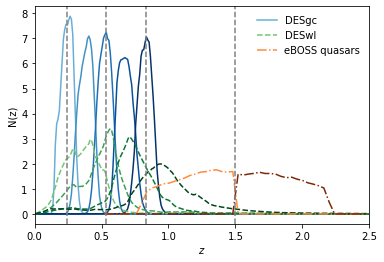

In [13]:
cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 5)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 4)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

for trname, tr in sG.tracers.items():
    if 'cv' in trname:
        continue
    z = tr.z
    c = np.sum(tr.nz[:-1] * np.diff(z))
    nz = tr.nz / c
    if 'DESgc' in trname:
        cmap = cmap_gc
        ls = '-'
        label = 'DESgc'
    elif 'DESwl' in trname:
        cmap = cmap_wl
        ls = '--'
        label = 'DESwl'
    elif 'eBOSS' in trname:
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS quasars'
    plt.plot(z, nz, c=next(cmap), ls=ls, label=label if '0' in trname else '')
    if 'wl' not in trname:
        mean = np.sum(nz[:-1] * z[:-1] * np.diff(z))
        print(trname, mean)
for zi in [0.24, 0.53, 0.83, 1.5]: 
        plt.axvline(zi, ls='--', color='gray')
plt.legend(frameon=False)
plt.xlim([0, 2.5])
plt.xlabel('$z$')
plt.ylabel('N(z)')
plt.show()
plt.close()

DECALS__0 0.2102562891067
DECALS__1 0.3840080597823229
DECALS__2 0.5180360234230431
DECALS__3 0.6596401176692459
eBOSS__0 1.1873826865943768
eBOSS__1 1.8241529349717789
KiDS1000__0 0.2321255792656378
KiDS1000__1 0.37771564208426717
KiDS1000__2 0.5385978716543565
KiDS1000__3 0.7668296973595782
KiDS1000__4 0.9587701993652671


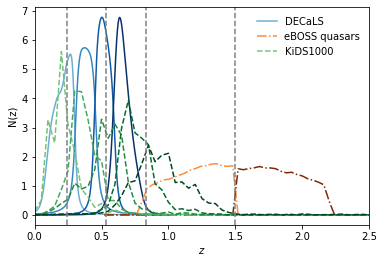

In [14]:
cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 4)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 5)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

for trname, tr in sK.tracers.items():
    if 'cv' in trname:
        continue
    z = tr.z
    c = np.sum(tr.nz[:-1] * np.diff(z))
    nz = tr.nz / c
    if 'DECALS' in trname:
        cmap = cmap_gc
        ls = '-'
        label = 'DECaLS'
    elif 'KiDS' in trname:
        cmap = cmap_wl
        ls = '--'
        label = 'KiDS1000'
    elif 'eBOSS' in trname:
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS quasars'
    plt.plot(z, nz, c=next(cmap), ls=ls, label=label if '__0' in trname else '')
    if 'wl' not in trname:
        mean = np.sum(nz[:-1] * z[:-1] * np.diff(z))
        print(trname, mean)
for zi in [0.24, 0.53, 0.83, 1.5]: 
        plt.axvline(zi, ls='--', color='gray')
plt.legend(frameon=False)
plt.xlim([0, 2.5])
plt.xlabel('$z$')
plt.ylabel('N(z)')
plt.show()
plt.close()

# LCDM

## Check v2 vs v3

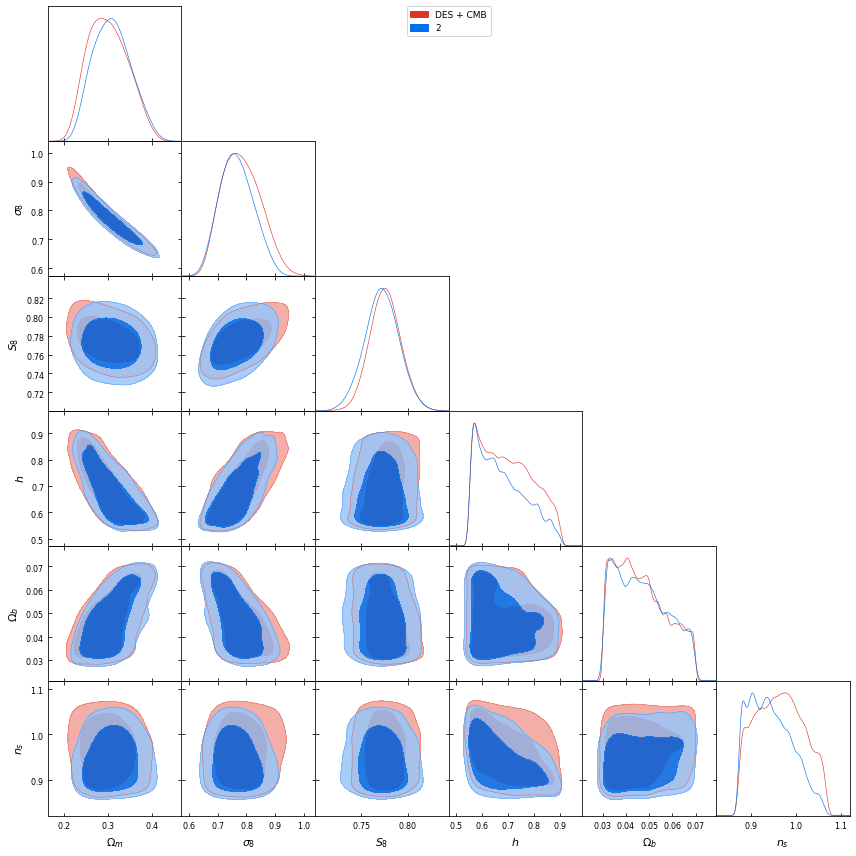

In [15]:
g = plots.get_subplot_plotter()
g.triangle_plot([dc,dc2], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True,
                legend_labels=['DES + CMB', '2'])
g.finish_plot()

## DES only (v2) vs DES oficial

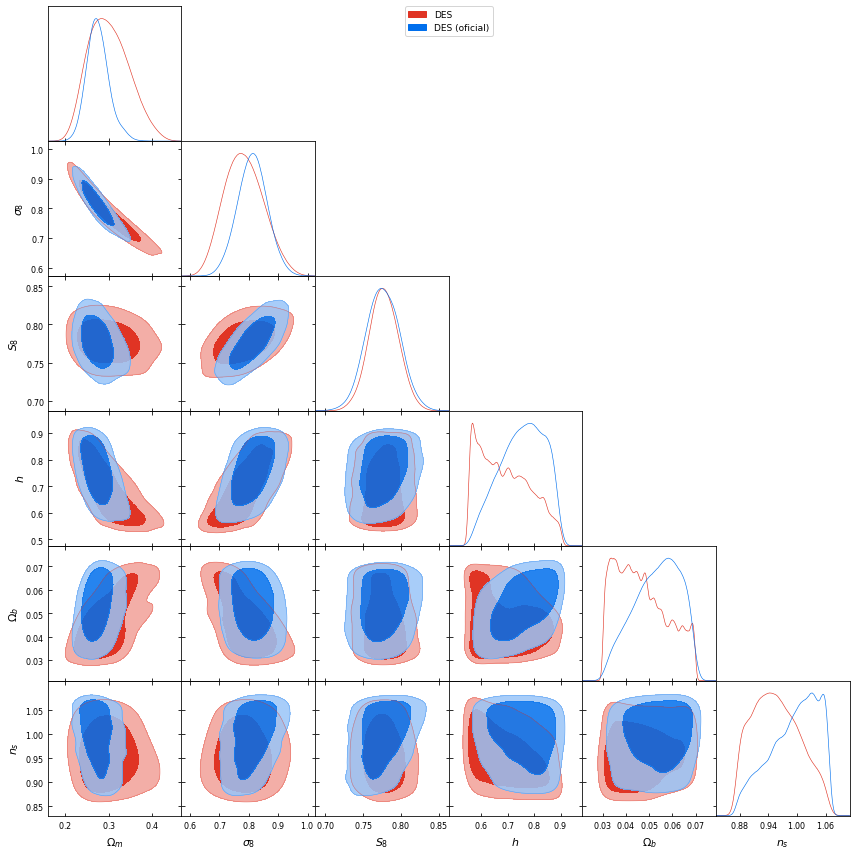

In [96]:
g = plots.get_subplot_plotter()
g.triangle_plot([donly, d_oficial], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True,
                legend_labels=[ 'DES', 'DES (oficial)'])
g.finish_plot()

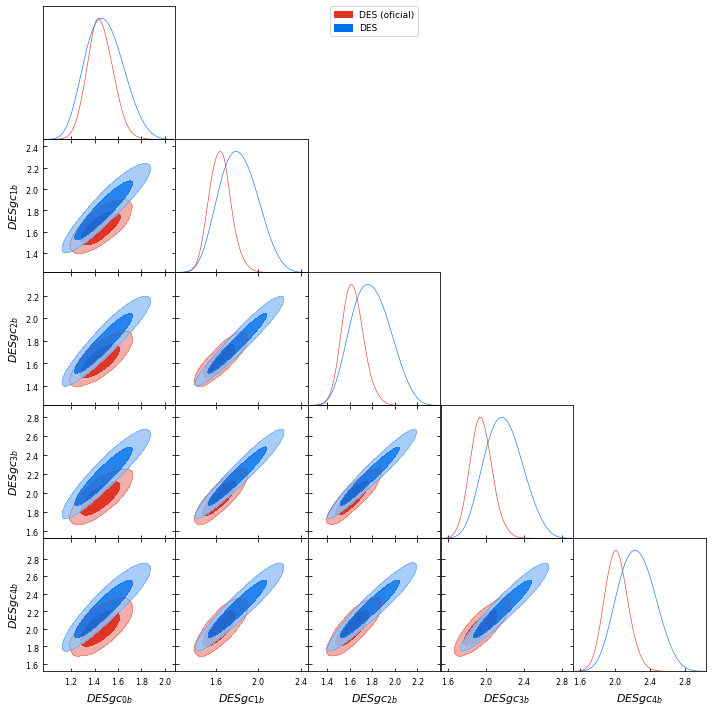

In [17]:
g = plots.get_subplot_plotter()
g.triangle_plot([d_oficial, donly], ['gc_b_0', 'gc_b_1', 'gc_b_2', 'gc_b_3', 'gc_b_4'],
                filled=True,
                legend_labels=['DES (oficial)', 'DES'])
g.finish_plot()

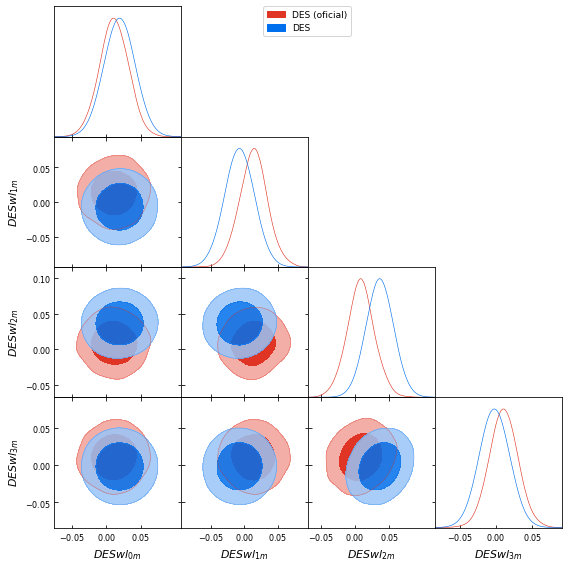

In [116]:
g = plots.get_subplot_plotter()
g.triangle_plot([d_oficial, donly], [ 'wl_m_0', 'wl_m_1', 'wl_m_2', 'wl_m_3'],
                filled=True,
                legend_labels=['DES (oficial)', 'DES'])
g.finish_plot()

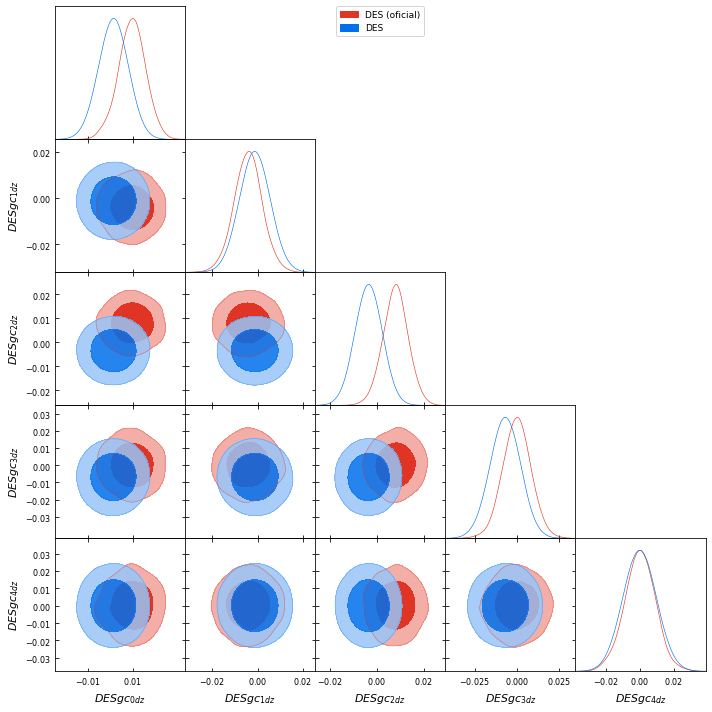

In [117]:
g = plots.get_subplot_plotter()
g.triangle_plot([d_oficial, donly], ['gc_dz_0', 'gc_dz_1', 'gc_dz_2', 'gc_dz_3', 'gc_dz_4'],
                filled=True,
                legend_labels=['DES (oficial)', 'DES'])
g.finish_plot()

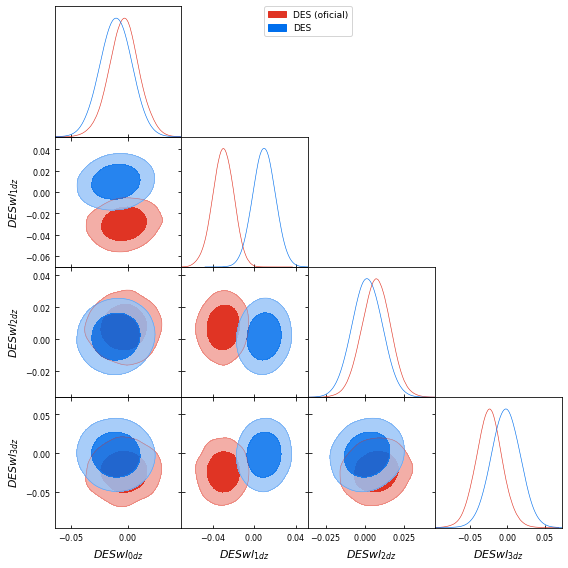

In [118]:
g = plots.get_subplot_plotter()
g.triangle_plot([d_oficial, donly], ['wl_dz_0', 'wl_dz_1', 'wl_dz_2', 'wl_dz_3'],
                filled=True,
                legend_labels=['DES (oficial)', 'DES'])
g.finish_plot()

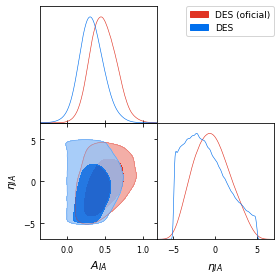

In [21]:
g = plots.get_subplot_plotter()
g.triangle_plot([d_oficial, donly], ['wl_ia_A', 'wl_ia_eta'],
                filled=True,
                legend_labels=['DES (oficial)', 'DES'])
g.finish_plot()

## DES (Results with v3)

In [22]:
for chain, label in zip([de, ec, dc, dec], ['DES + eBOSS', 'eBOSS+CMB', 'DES+CMB', 'DES+eBOSS+CMB']):
    print(label, chain.getInlineLatex('Omega_m', 2), chain.getInlineLatex('sigma_8', 2), chain.getInlineLatex('S_8', 2))

DES + eBOSS \Omega_{m } = 0.302^{+0.097}_{-0.089} \sigma_{8 } = 0.78^{+0.15}_{-0.13} S_{8 } = 0.775^{+0.034}_{-0.033}
eBOSS+CMB \Omega_{m } = 0.27^{+0.12}_{-0.11} \sigma_{8 } = 0.87^{+0.18}_{-0.16} S_{8 } = 0.82^{+0.19}_{-0.17}
DES+CMB \Omega_{m } = 0.300^{+0.086}_{-0.079} \sigma_{8 } = 0.78^{+0.13}_{-0.12} S_{8 } = 0.776^{+0.033}_{-0.032}
DES+eBOSS+CMB \Omega_{m } = 0.277^{+0.081}_{-0.068} \sigma_{8 } = 0.82^{+0.12}_{-0.12} S_{8 } = 0.783^{+0.031}_{-0.029}


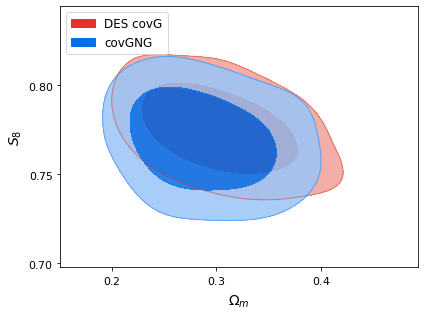

In [7]:
chains = [donly, donly_covGNG]
legend_labels = ['DES covG', 'covGNG']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

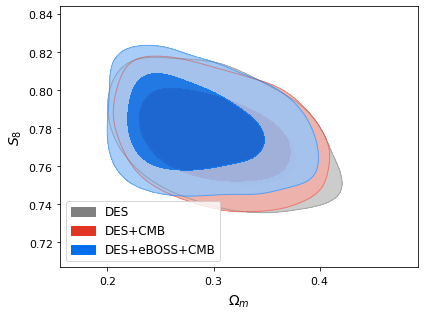

In [24]:
chains = [donly, dc, dec]
# contour_colors = [color[c] for c in ckeys]
legend_labels = ['DES', 'DES+CMB', 'DES+eBOSS+CMB']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='lower left')
g.finish_plot()

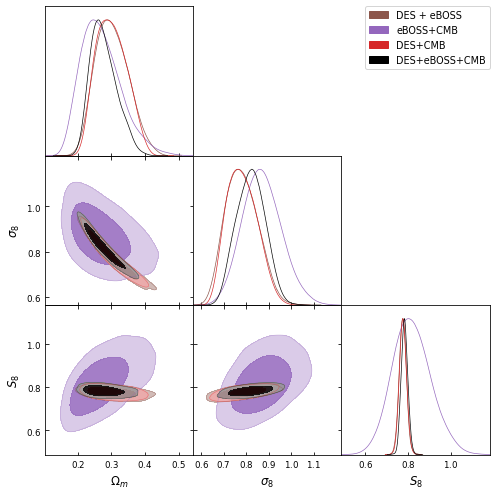

In [23]:
g = plots.get_subplot_plotter(width_inch=7)
g.triangle_plot([de, ec, dc, dec], ['Omega_m','sigma_8', 'S_8'],
                filled=True, contour_colors=[color['de'], color['ec'], color['dc'], color['dec']],
                legend_labels=['DES + eBOSS', 'eBOSS+CMB', 'DES+CMB', 'DES+eBOSS+CMB'])
g.finish_plot()

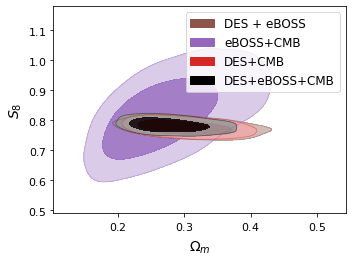

In [24]:
g = plots.get_single_plotter(width_inch=5)
g.plot_2d([de, ec, dc, dec], 'Omega_m','S_8',
                filled=True, colors=[color['de'], color['ec'], color['dc'], color['dec']])
g.add_legend(['DES + eBOSS', 'eBOSS+CMB', 'DES+CMB', 'DES+eBOSS+CMB'])
g.finish_plot()

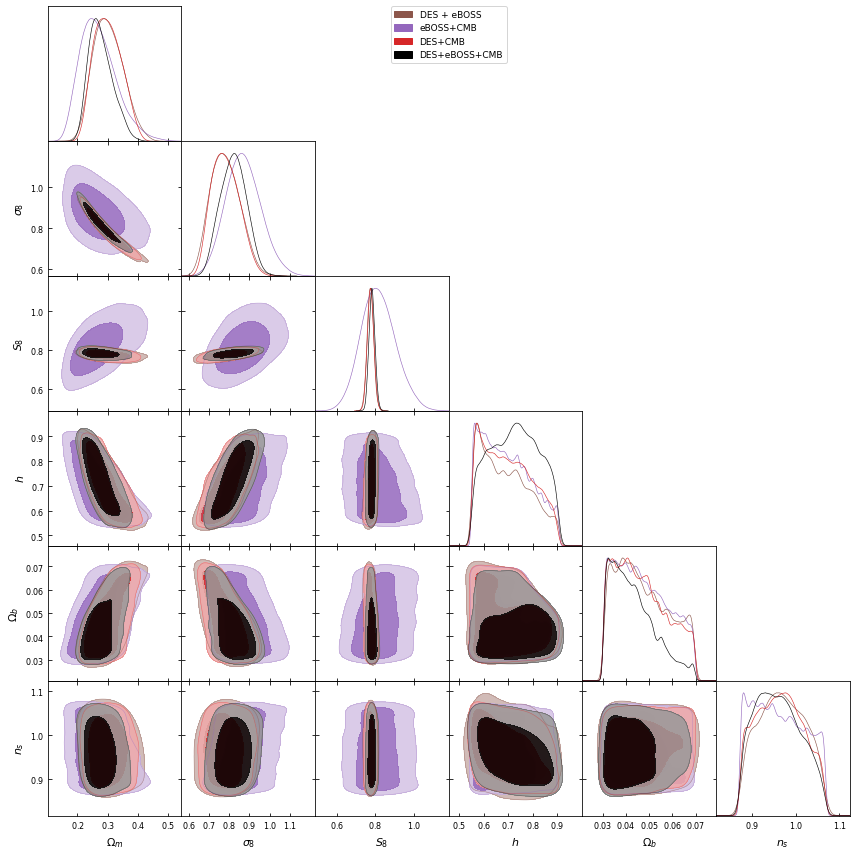

In [25]:
g = plots.get_subplot_plotter()
g.triangle_plot([de, ec, dc, dec], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['de'], color['ec'], color['dc'], color['dec']],
                legend_labels=['DES + eBOSS', 'eBOSS+CMB', 'DES+CMB', 'DES+eBOSS+CMB'])
g.finish_plot()

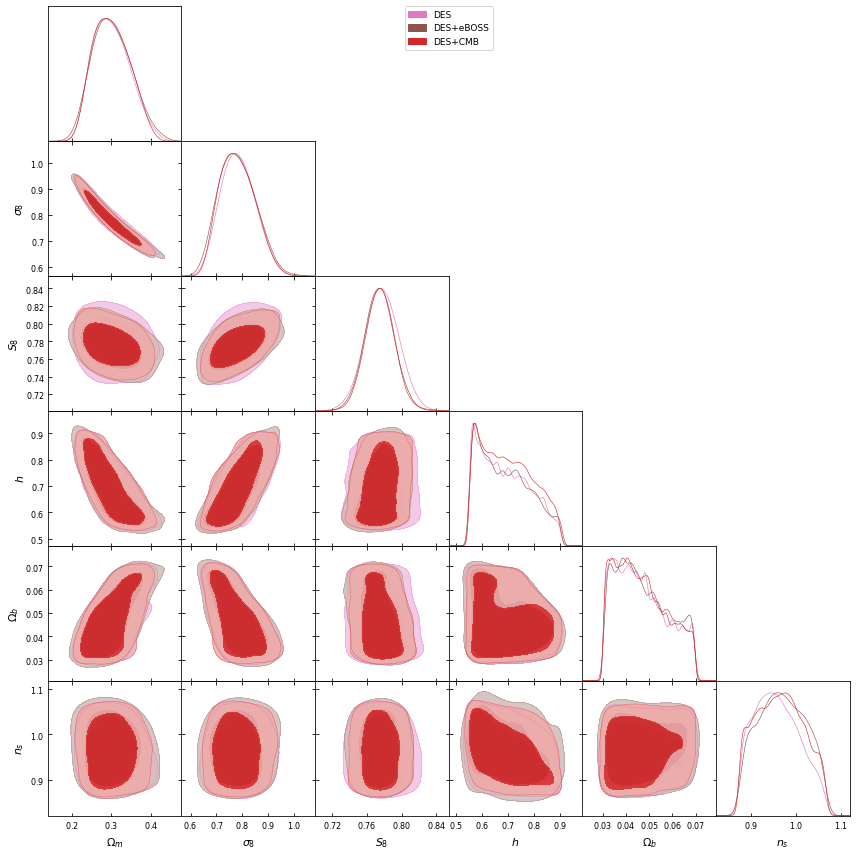

In [26]:
g = plots.get_subplot_plotter()
g.triangle_plot([donly, de, dc], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['donly'], color['de'], color['dc']],
                legend_labels=['DES', 'DES+eBOSS', 'DES+CMB'])
g.finish_plot()

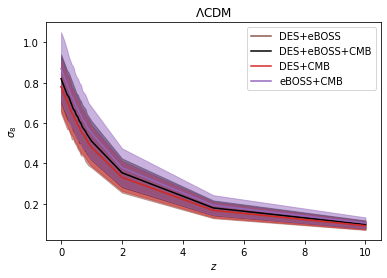

In [27]:
for cl, label, chain in zip(['de', 'dec', 'dc', 'ec'], ['DES+eBOSS', 'DES+eBOSS+CMB', 'DES+CMB', 'eBOSS+CMB'], [de, dec, dc, ec]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

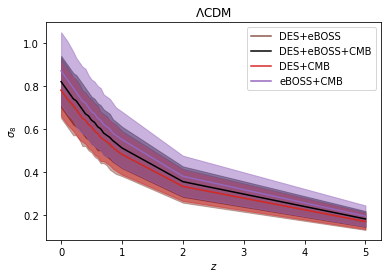

In [28]:
for cl, label, chain in zip(['de', 'dec', 'dc', 'ec'], ['DES+eBOSS', 'DES+eBOSS+CMB', 'DES+CMB', 'eBOSS+CMB'], [de, dec, dc, ec]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

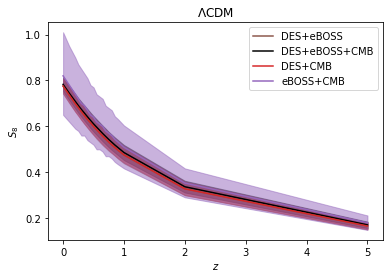

In [29]:
for cl, label, chain in zip(['de', 'dec', 'dc', 'ec'], ['DES+eBOSS', 'DES+eBOSS+CMB', 'DES+CMB', 'eBOSS+CMB'], [de, dec, dc, ec]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

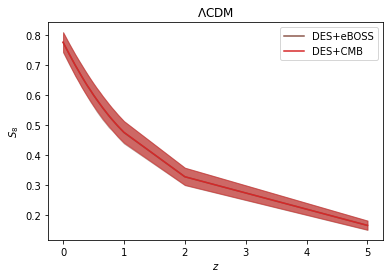

In [30]:
for cl, label, chain in zip(['de', 'dc'], ['DES+eBOSS', 'DES+CMB'], [de, dc]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

### Check biases

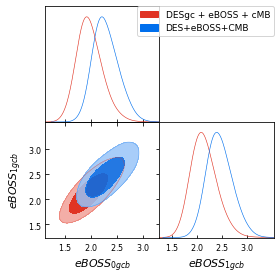

In [9]:
g = plots.get_subplot_plotter()
g.triangle_plot([dgcec, dec], ['eBOSS__0_gc_b', 'eBOSS__1_gc_b'],
                filled=True,
                legend_labels=['DESgc + eBOSS + cMB', 'DES+eBOSS+CMB'])
g.finish_plot()

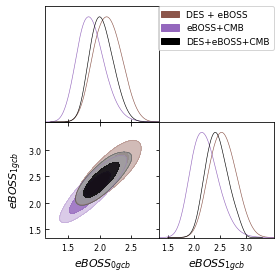

In [31]:
g = plots.get_subplot_plotter()
g.triangle_plot([de, ec, dec], ['eBOSS__0_gc_b', 'eBOSS__1_gc_b'],
                filled=True, contour_colors=[color['de'], color['ec'], color['dec']],
                legend_labels=['DES + eBOSS', 'eBOSS+CMB', 'DES+eBOSS+CMB'])
g.finish_plot()

## Magnifications vs no Magnification

### DES + eBOSS + CMB

In [25]:
###
dec_nm_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB/cl_cross_corr_data_info.npz')
dec_nm_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB/cl_cross_corr_bestfit_info.npz')

dec_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB/2021-03-13_1000000_',
                            settings={'ignore_rows':0.5})

print('dec_nm', dec_nm.getGelmanRubin(27))

dec_nm 0.01899398080751604


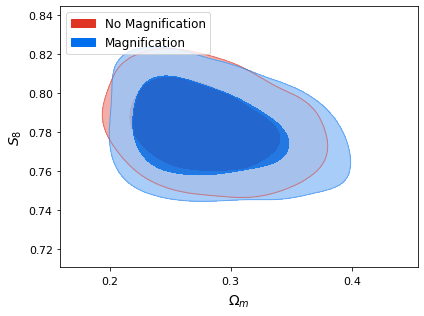

In [27]:
chains = [dec_nm, dec]
legend_labels = ['No Magnification', 'Magnification']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

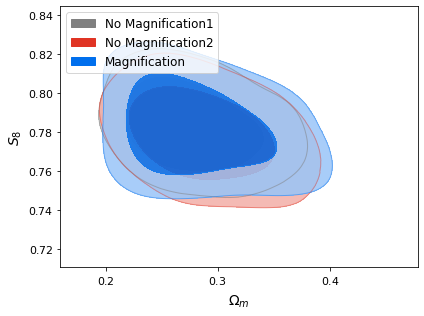

In [33]:
chains = [dec_nm, dec, dec_cMG]
legend_labels = ['No Magnification1', 'No Magnification2', 'Magnification']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

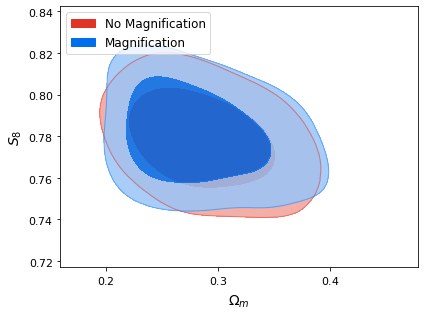

In [38]:
chains = [dec, dec_cMG]
legend_labels = ['No Magnification', 'Magnification']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

In [19]:
dec_nm_di = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB/cl_cross_corr_data_info.npz')
dec_nm_bfi = np.load('./cl_cross_corr_v3_DES_eBOSS_CMB/cl_cross_corr_bestfit_info.npz')

dec_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB/2021-03-13_1000000_',
                            settings={'ignore_rows':0.5})

print('dec_nm', dec_nm.getGelmanRubin(27))
print('dec', dec.getGelmanRubin(27))

dec_nm 0.01899398080751462
dec 0.026442757428911612


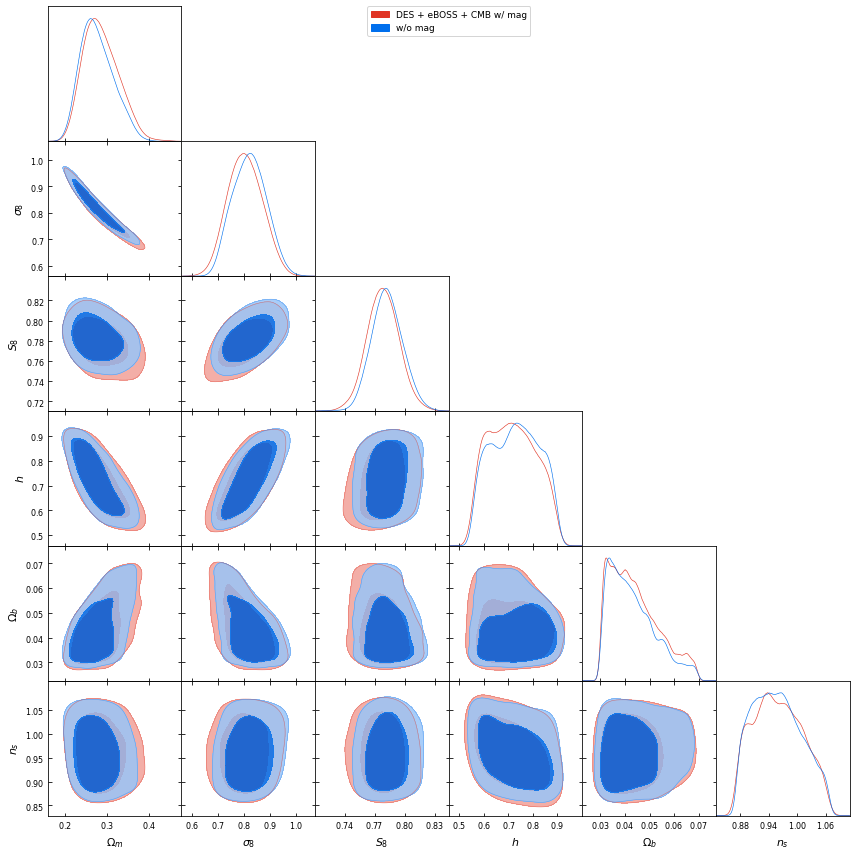

In [422]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec, dec_nm], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True,
                legend_labels=['DES + eBOSS + CMB w/ mag', 'w/o mag'])
g.finish_plot()

### DESgc + eBOSS + CMB

In [5]:
###
dgcec_nm_di = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB/cl_cross_corr_data_info.npz')
dgcec_nm_bfi = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB/cl_cross_corr_bestfit_info.npz')

dgcec_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DESgc_eBOSS_CMB/2021-05-11_10000000_',
                            settings={'ignore_rows':0.5})

print('dgcec_nm', dgcec_nm.getGelmanRubin(17))

dgcec_nm 0.027088809534618213


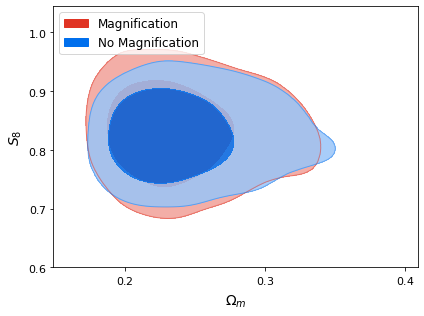

In [6]:
chains = [dgcec, dgcec_nm]
legend_labels = ['Magnification', 'No Magnification']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

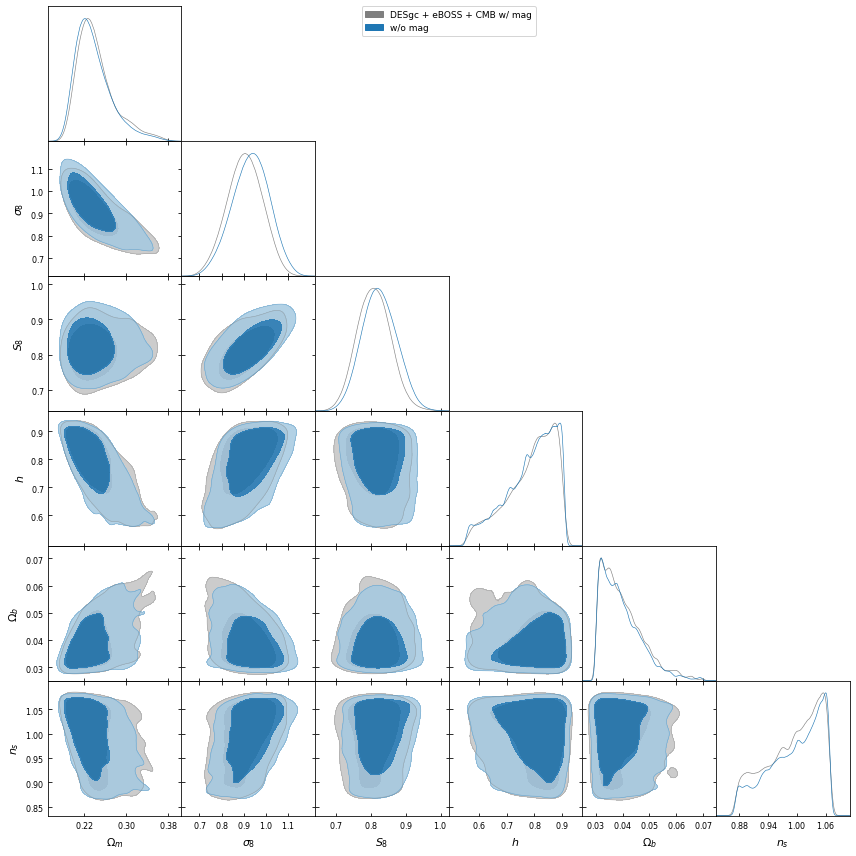

In [309]:
# dpk_{0.24 } = 0.92^{+0.16}_{-0.17}
# dpk_{0.53 } = 0.76^{+0.15}_{-0.14}
# dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
# dpk_{1.5 } = 0.57^{+0.15}_{-0.13}

g = plots.get_subplot_plotter()
g.triangle_plot([dgcec, dgcec_nm], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['DESgc + eBOSS + CMB w/ mag', 'w/o mag'])
g.finish_plot()

### DECaLS + K1000 + eBOSS + CMB

In [30]:
Dkec_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/2021-04-30_10000000_',
                             settings={'ignore_rows':0.4})

print('Dkec_nm', Dkec_nm.getGelmanRubin(27))

./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/2021-04-30_10000000__2.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/2021-04-30_10000000__5.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/2021-04-30_10000000__4.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB/2021-04-30_10000000__3.txt
Removed 0.4 as burn in
Dkec_nm 0.013585154196479439


In [32]:
print('Dkec', Dkec.getGelmanRubin(27))

Dkec 0.025936593636528907


Magnification S_{8 } = 0.780\pm 0.012 \sigma_{8 } = 0.772\pm 0.036 \Omega_{m } = 0.308^{+0.023}_{-0.027}
No Magnification S_{8 } = 0.779\pm 0.012 \sigma_{8 } = 0.765\pm 0.034 \Omega_{m } = 0.312^{+0.023}_{-0.026}


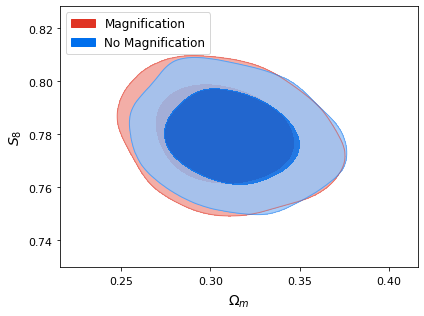

In [31]:
chains = [Dkec, Dkec_nm]
legend_labels = ['Magnification', 'No Magnification']

for l, c in zip(legend_labels, chains):
    print(l, c.getInlineLatex('S_8'), c.getInlineLatex('sigma_8'), c.getInlineLatex('Omega_m'))
######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

## KiDS 

In [267]:
chains = [kc, Dk, Dec, Dkec]
ckeys = ['kc', 'Dk', 'Dec', 'Dkec']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['KiDS + CMB', 'DECaLS + KiDS', 'DECaLS + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB']

for chain, label in zip(chains, legend_labels):
    print(label, chain.getInlineLatex('Omega_m', 2), chain.getInlineLatex('sigma_8', 2), chain.getInlineLatex('S_8', 2))

KiDS + CMB \Omega_{m } = 0.28^{+0.14}_{-0.12} \sigma_{8 } = 0.79^{+0.16}_{-0.18} S_{8 } = 0.754^{+0.054}_{-0.096}
DECaLS + KiDS \Omega_{m } = 0.318^{+0.055}_{-0.050} \sigma_{8 } = 0.757^{+0.070}_{-0.071} S_{8 } = 0.776^{+0.025}_{-0.024}
DECaLS + eBOSS + CMB \Omega_{m } = 0.309^{+0.055}_{-0.049} \sigma_{8 } = 0.810^{+0.087}_{-0.085} S_{8 } = 0.820^{+0.049}_{-0.048}
DECaLS + KiDS + eBOSS + CMB \Omega_{m } = 0.313^{+0.049}_{-0.045} \sigma_{8 } = 0.765^{+0.065}_{-0.065} S_{8 } = 0.779^{+0.025}_{-0.025}


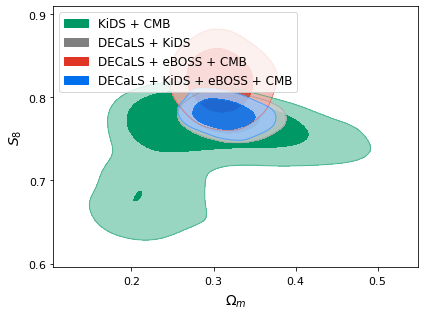

In [266]:
chains = [kc, Dk, Dec, Dkec]
ckeys = ['kc', 'Dk', 'Dec', 'Dkec']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['KiDS + CMB', 'DECaLS + KiDS', 'DECaLS + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                contour_colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

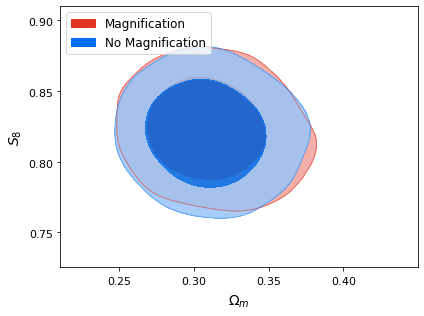

In [158]:
chains = [Dec, Dec_nm]
legend_labels = ['Magnification', 'No Magnification']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

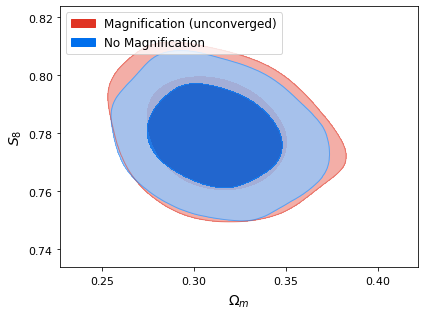

In [161]:
chains = [Dkec, Dkec_nm]
legend_labels = ['Magnification (unconverged)', 'No Magnification']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

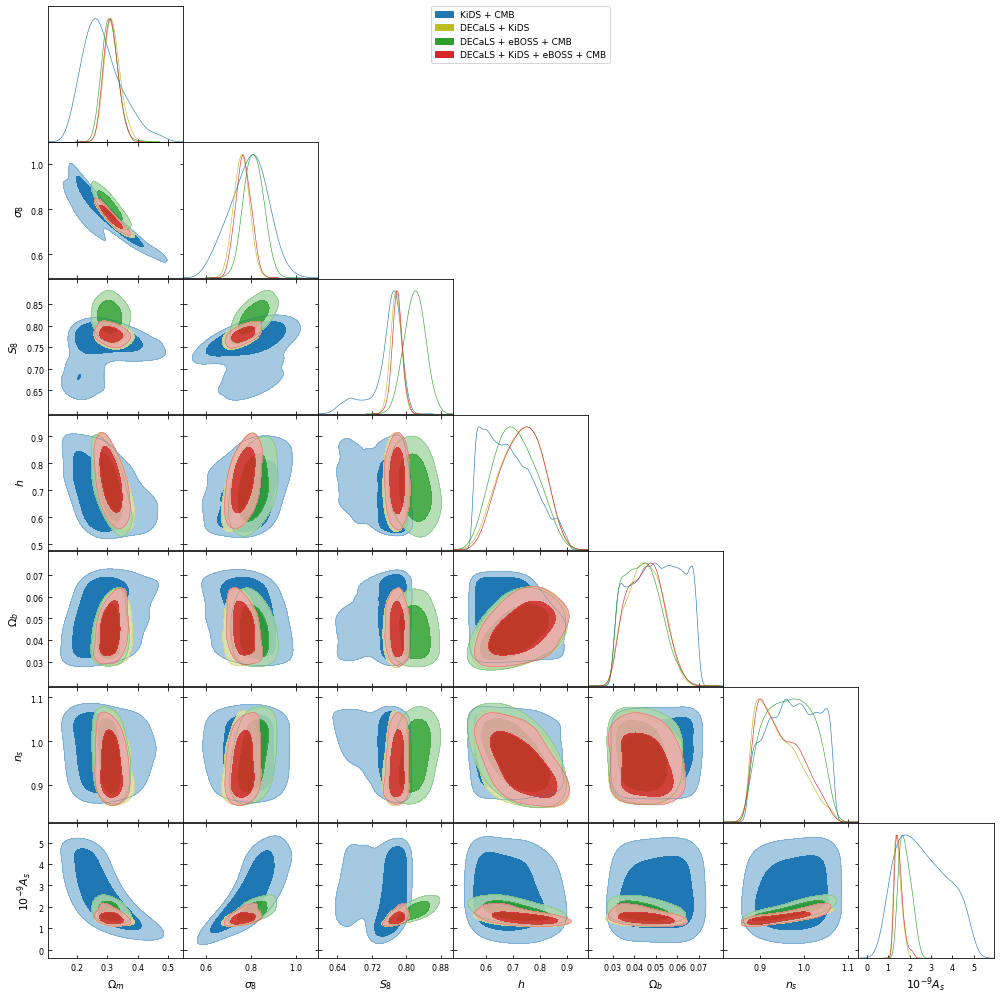

In [265]:
chains = [kc, Dk, Dec, Dkec]
ckeys = ['kc', 'Dk', 'Dec', 'Dkec']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['KiDS + CMB', 'DECaLS + KiDS', 'DECaLS + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s', 'A_s'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

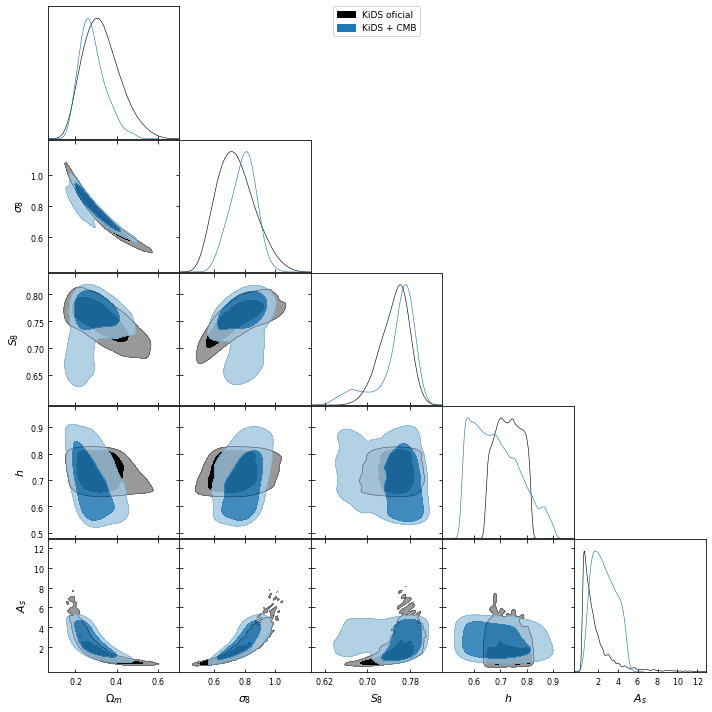

In [107]:
chains = [k1000_oficial, kc]
ckeys = ['k1000_oficial', 'kc']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['KiDS oficial', 'KiDS + CMB']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'A_s'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

### Biases

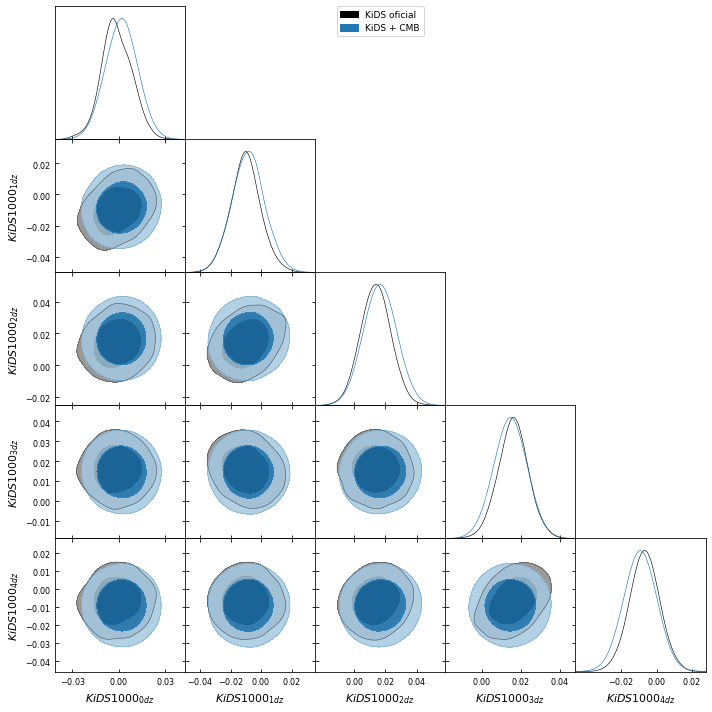

In [109]:
chains = [k1000_oficial, kc]
ckeys = ['k1000_oficial', 'kc']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['KiDS oficial', 'KiDS + CMB']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['KiDS1000__0_dz', 'KiDS1000__1_dz', 'KiDS1000__2_dz', 'KiDS1000__3_dz', 'KiDS1000__4_dz'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

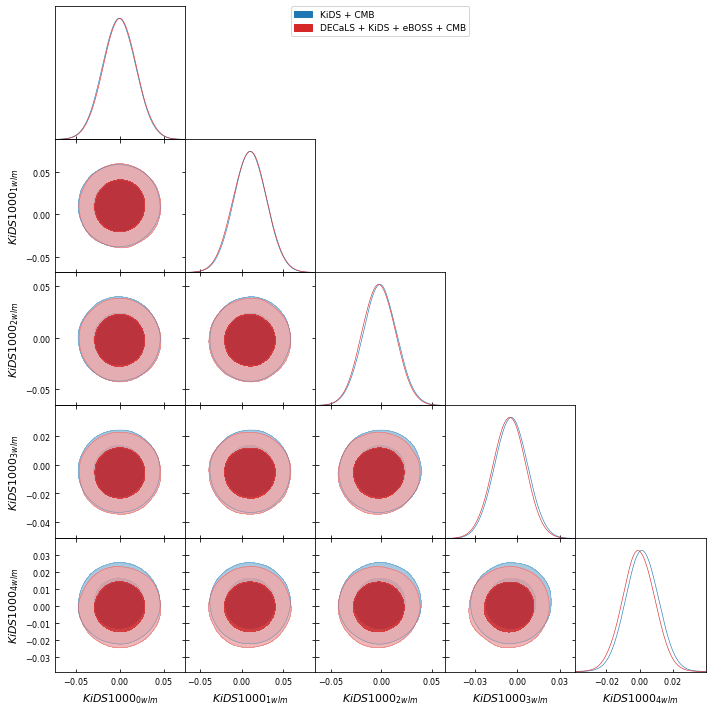

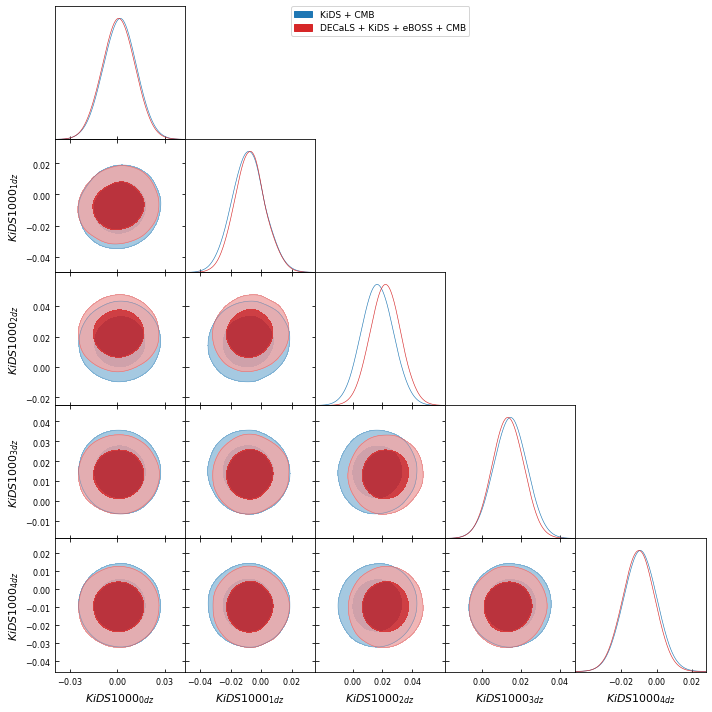

In [110]:
chains = [kc, Dkec]
ckeys = ['kc', 'Dkec']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['KiDS + CMB', 'DECaLS + KiDS + eBOSS + CMB']

#####
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['KiDS1000__0_wl_m', 'KiDS1000__1_wl_m', 'KiDS1000__2_wl_m', 'KiDS1000__3_wl_m', 'KiDS1000__4_wl_m'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['KiDS1000__0_dz', 'KiDS1000__1_dz', 'KiDS1000__2_dz', 'KiDS1000__3_dz', 'KiDS1000__4_dz'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

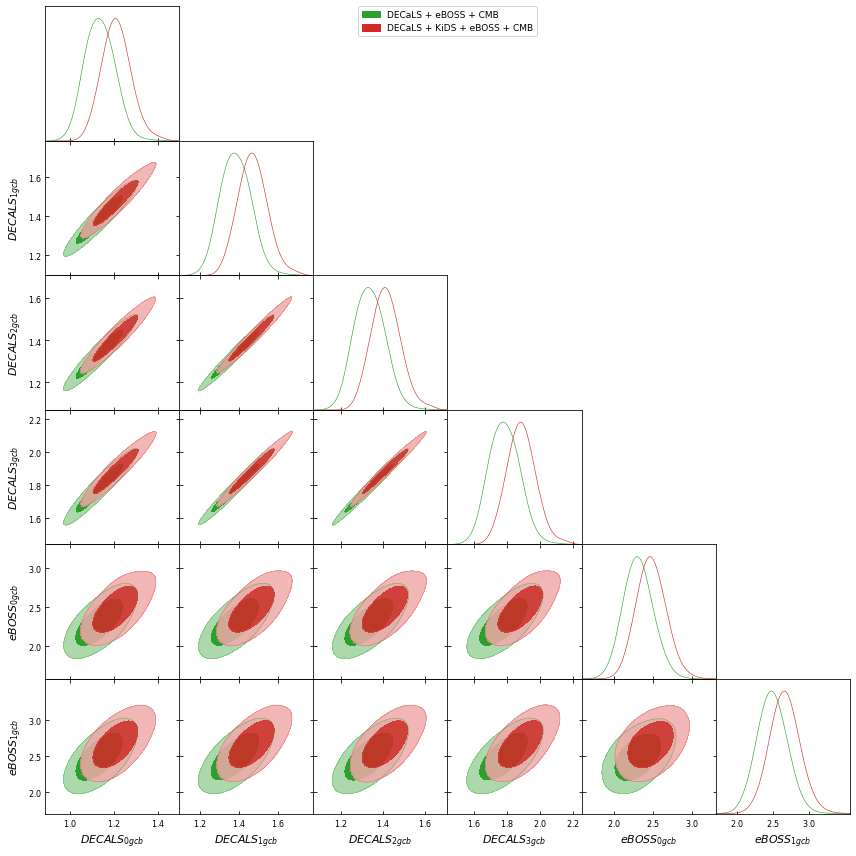

In [111]:
chains = [Dec, Dkec]
ckeys = ['Dec', 'Dkec']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['DECaLS + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB']

#####
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['DECALS__0_gc_b', 'DECALS__1_gc_b', 'DECALS__2_gc_b', 'DECALS__3_gc_b',
                         'eBOSS__0_gc_b', 'eBOSS__1_gc_b'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()


## KiDS vs DES vs Planck

In [392]:
act.getInlineLatex('S_8', limit=1)

'S_8 = 0.750\\pm 0.042'

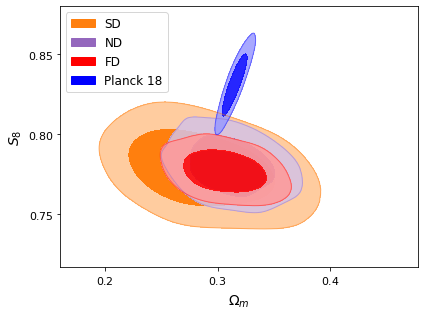

In [433]:
#  DES + eBOSS + CMBk
#  DECaLS + K1000 + eBOSS + CMBk
#  All together
#  Planck 18


chains = [dec, Dkec, alld, p18, p18_mnu] #, act]
ckeys = ['dec', 'Dkec', 'alld',  'p18', 'p18']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

# contour_colors += ['gray']
# legend_labels += ['WMAP+ACT+SPT']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()
plt.show()
plt.close()

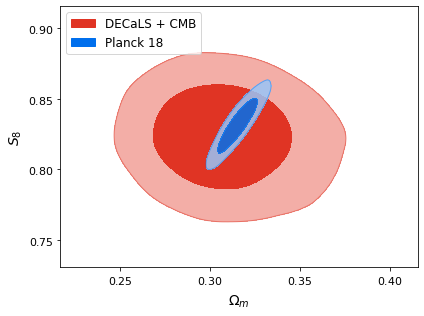

In [77]:
chains = [Dc, p18]
ckeys = ['Dc', 'p18']
contour_colors = [kcolor['Dc'], 'blue']
legend_labels = ['DECaLS + CMB', 'Planck 18']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                contour_colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

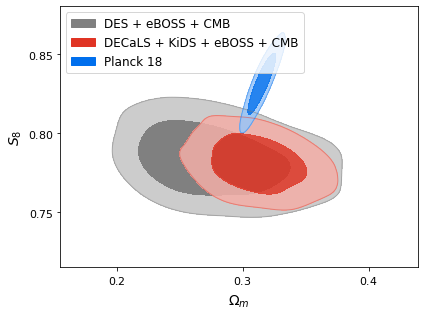

In [98]:
chains = [dec, Dkec, p18]
ckeys = ['dec', 'Dkec', 'p18']
contour_colors = [color['dec'], kcolor['Dkec'], 'blue']
legend_labels = ['DES + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB', 'Planck 18']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                contour_colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

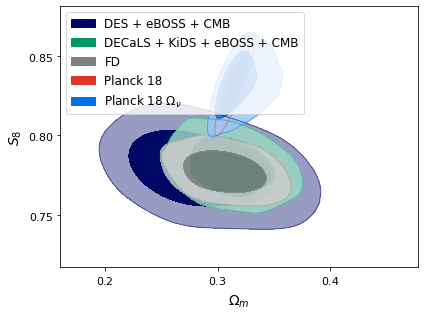

In [434]:
chains = [dec, Dkec, alld, p18, p18_mnu]
# ckeys = ['dec', 'Dkec', 'p18']
# contour_colors = [color['dec'], kcolor['Dkec'], 'black', 'blue', 'darkblue']
legend_labels = ['DES + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB', 'FD',
                 'Planck 18', r'Planck 18 $\Omega_\nu$']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
#                 colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

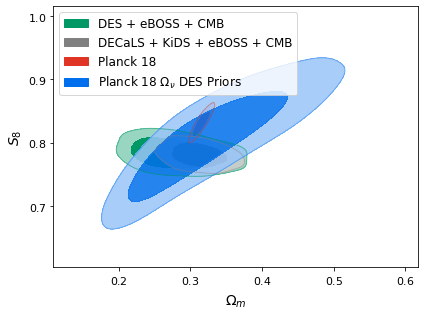

In [99]:
chains = [dec, Dkec, p18, p18_mnu_des]
# ckeys = ['dec', 'Dkec', 'p18']
contour_colors = [color['dec'], kcolor['Dkec'], 'blue', 'darkblue']
legend_labels = ['DES + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB',
                 'Planck 18', r'Planck 18 $\Omega_\nu$ DES Priors lensing only']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                contour_colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()

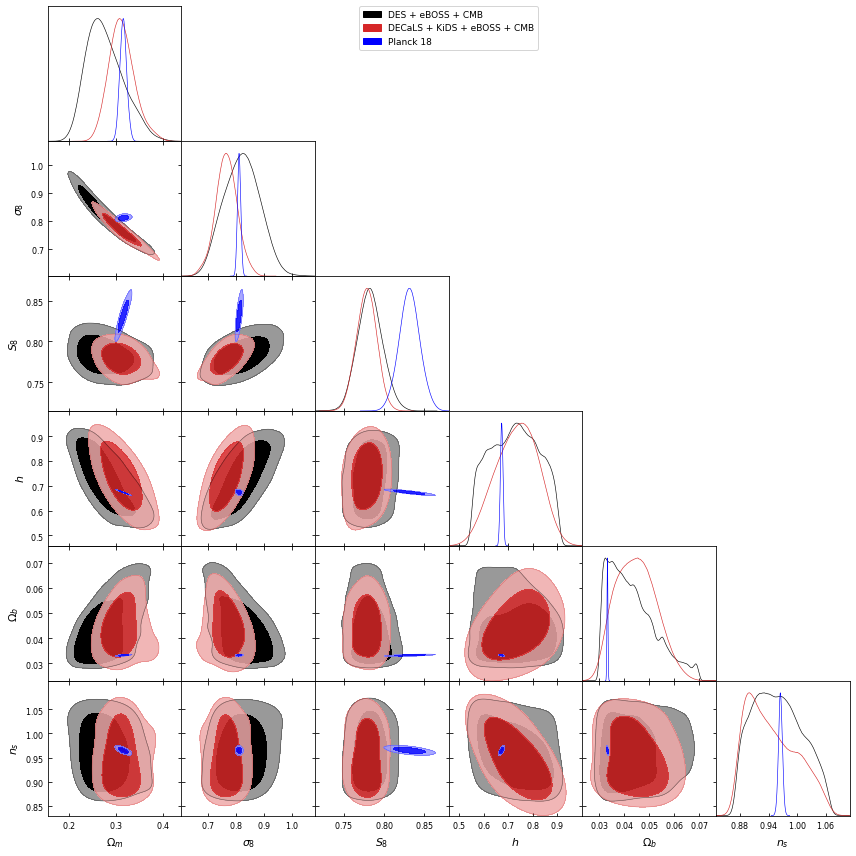

In [39]:
chains = [dec, Dkec, p18]
ckeys = ['dec', 'Dkec', 'p18']
contour_colors = [color['dec'], kcolor['Dkec'], 'blue']
legend_labels = ['DES + eBOSS + CMB', 'DECaLS + KiDS + eBOSS + CMB', 'Planck 18']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

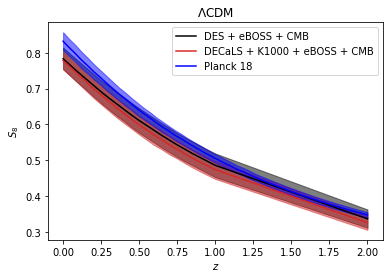

In [40]:
chains = [dec, Dkec]
ckeys = ['dec', 'Dkec']
clist = [color['dec'], kcolor['Dkec']]
labels = ['DES + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB']


for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=cl)

# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = 'Planck 18'
sigma8z = []
for p in chain.paramNames.list():
    if 'S8z' in p:
        InlineLatex = chain.getInlineLatex(p, limit=2)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
plt.plot(p18_zarr, sigma8z[1], label=label, color=cl)
plt.fill_between(p18_zarr, sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                 alpha=.5, color=cl)
    
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

## All

In [12]:
alld = getdist.loadMCSamples('./cl_cross_corr_v3_DES_K1000_all_mag_correctMag/2021-06-11_10000000_',
                             settings={'ignore_rows':0.5})
print(alld.getGelmanRubin(45))
alld_old = getdist.loadMCSamples('./v3_mag_ignored/cl_cross_corr_v3_DES_K1000_all_mag/2021-05-16_1000000_',
                             settings={'ignore_rows':0.5})
print(alld_old.getGelmanRubin(45))
alld_mnu = getdist.loadMCSamples('./cl_cross_corr_v3_DES_K1000_all_mag_mnu/2021-05-26_10000000_',
                             settings={'ignore_rows':0.5})
print(alld_mnu.getGelmanRubin(45))

0.026606954787542884
0.10313645270473548
0.11644196388397632


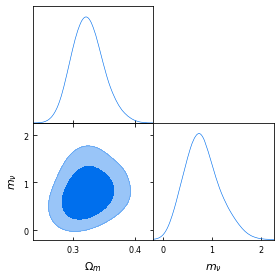

In [7]:
g = plots.get_subplot_plotter()
g.triangle_plot([alld_mnu], ['Omega_m', 'm_nu'], filled=True)
g.finish_plot()

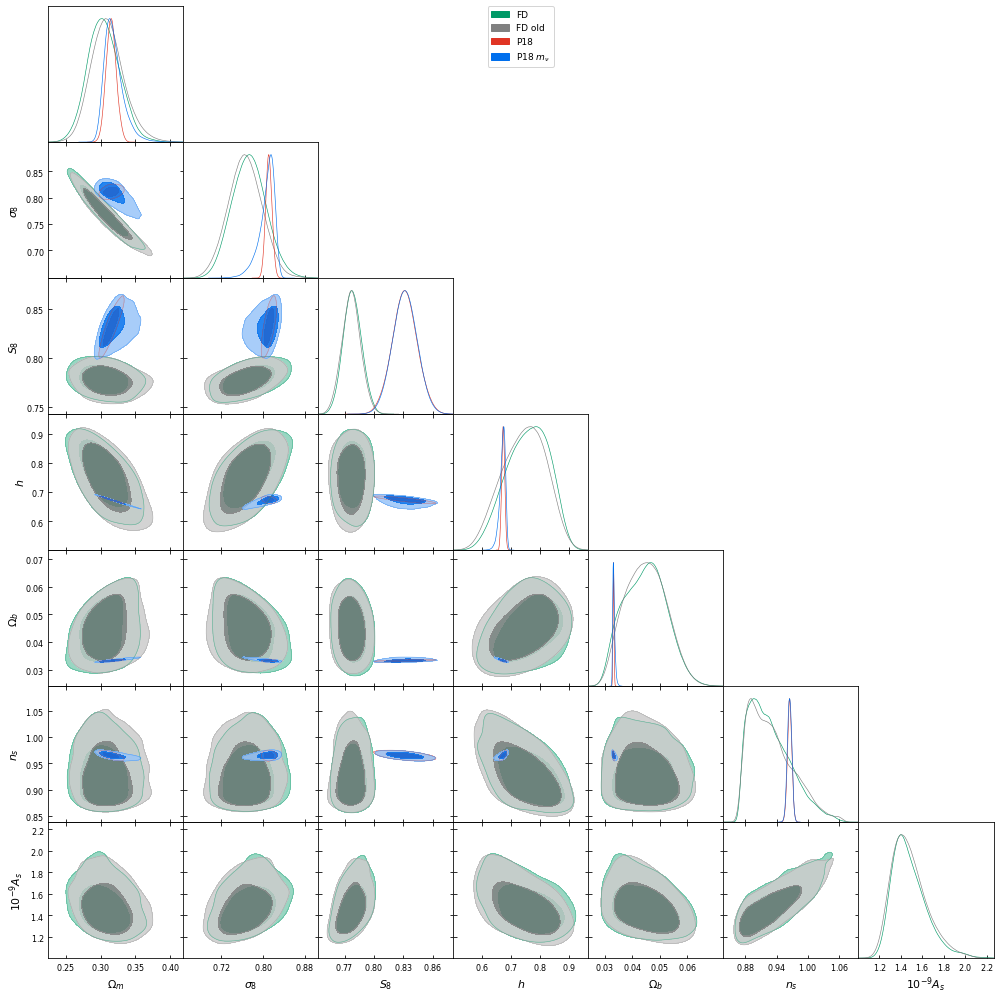

In [21]:
chains = [alld, alld_old, p18, p18_mnu]
legend_labels = [r'FD', r'FD old', 'P18', r'P18 $m_\nu$']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s', 'A_s'],
                filled=True, legend_labels=legend_labels)
g.finish_plot()

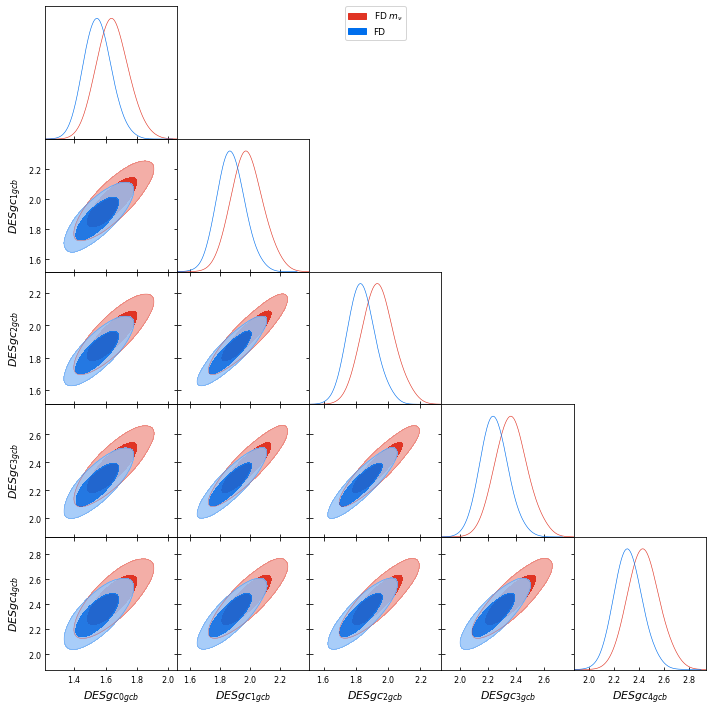

In [28]:
chains = [alld_mnu, alld_old]
legend_labels = [r'FD $m_\nu$', r'FD']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, [f'DESgc__{i}_gc_b' for i in range(5)],
                filled=True, legend_labels=legend_labels)
g.finish_plot()

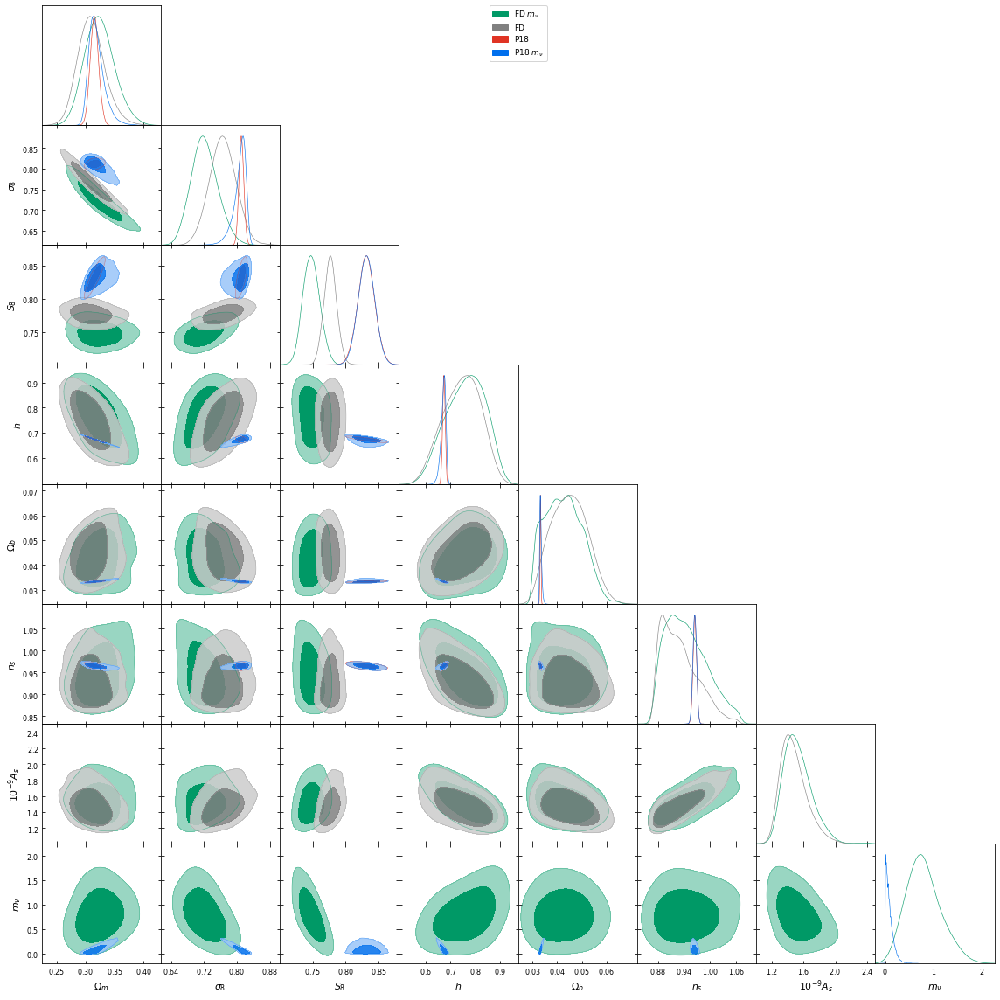

In [22]:
chains = [alld_mnu, alld_old, p18, p18_mnu]
legend_labels = [r'FD $m_\nu$', r'FD', 'P18', r'P18 $m_\nu$']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s', 'A_s', 'm_nu'],
                filled=True, legend_labels=legend_labels)
g.finish_plot()

## Fiducial vs Planck

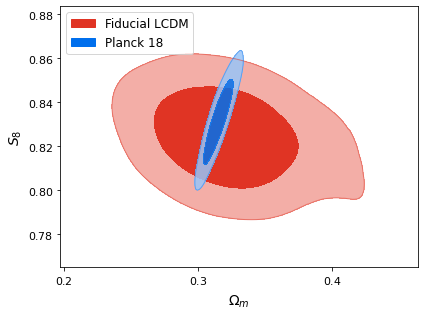

In [141]:
#  DES + eBOSS + CMBk
#  DECaLS + K1000 + eBOSS + CMBk
#  All together
#  Planck 18


chains = [dec_fid, p18]
ckeys = ['dec', 'p18']
legend_labels = ['Fiducial LCDM', 'Planck 18']

######
g = plots.get_single_plotter()
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()
plt.savefig('./S8z_figures/FD_lcdm_s8.pdf')
plt.show()
plt.close()

# Taylor

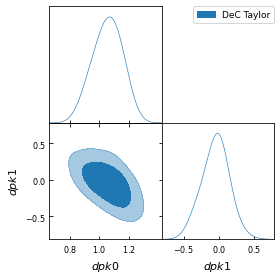

In [41]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_tlr], ['dpk0', 'dpk1'],
                filled=True, contour_colors=[color['dec_tlr']],
                legend_labels=['DeC Taylor'], label_order=-1)
g.finish_plot()

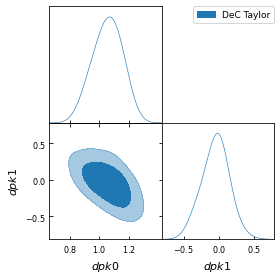

In [42]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_tlr], ['dpk0', 'dpk1'],
                filled=True, contour_colors=[color['dec_tlr']],
                legend_labels=['DeC Taylor'], label_order=-1)
g.finish_plot()

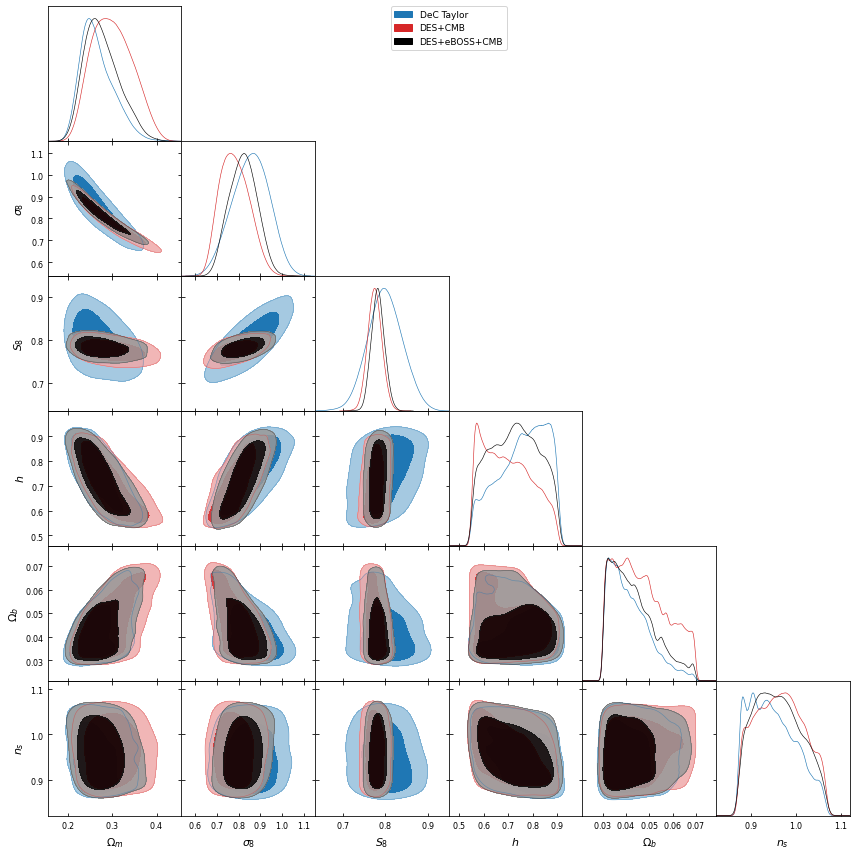

In [43]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_tlr, dc, dec], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['dec_tlr'], color['dc'], color['dec']],
                legend_labels=['DeC Taylor', 'DES+CMB', 'DES+eBOSS+CMB'])
g.finish_plot()

In [44]:
# pnames = dec_tlr.getParamNames()
# sigma8, Om, S8 = dec_tlr.samples[:, np.in1d(pnames.list(), ['sigma_8', 'Omega_m', 'S_8'])].T
# print(np.max(np.abs(sigma8 * np.sqrt(Om / 0.3) / S8 - 1)))

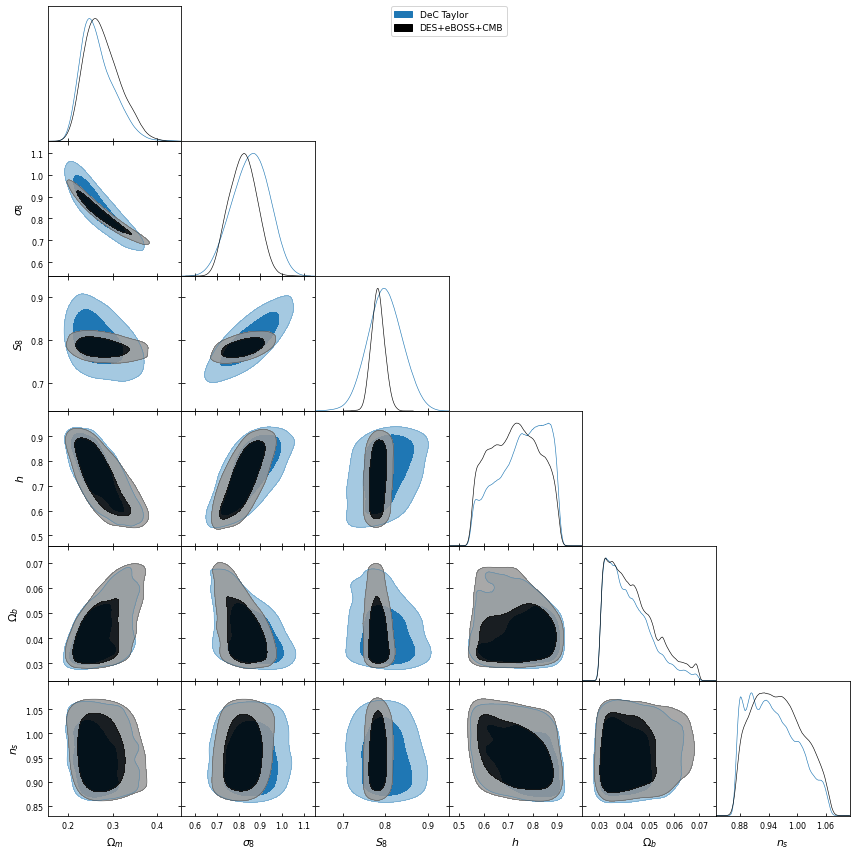

In [45]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_tlr, dec], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['dec_tlr'], color['dec']],
                legend_labels=['DeC Taylor', 'DES+eBOSS+CMB'])
g.finish_plot()

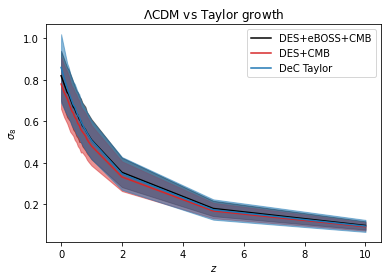

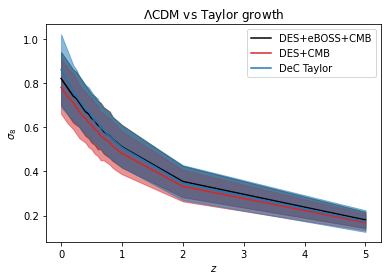

In [46]:
for cl, label, chain in zip(['dec', 'dc', 'dec_tlr'], ['DES+eBOSS+CMB', 'DES+CMB', 'DeC Taylor'], [dec, dc, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Taylor growth')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

for cl, label, chain in zip(['dec', 'dc', 'dec_tlr'], ['DES+eBOSS+CMB', 'DES+CMB', 'DeC Taylor'], [dec, dc, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Taylor growth')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

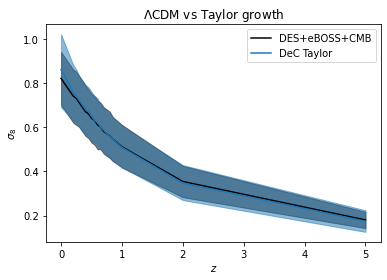

In [47]:
for cl, label, chain in zip(['dec', 'dec_tlr'], ['DES+eBOSS+CMB', 'DeC Taylor'], [dec, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Taylor growth')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

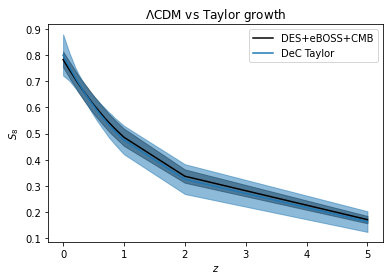

In [48]:
for cl, label, chain in zip(['dec', 'dec_tlr'], ['DES+eBOSS+CMB', 'DeC Taylor'], [dec, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Taylor growth')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

# Binning

## DES + eBOSS + CMB

### Bin2 vs Soft_2

In [49]:
chain = dec_bin_s2
for p in chain.paramNames.list():
    if 'dpk' not in p:
        continue
    print(chain.getInlineLatex(p, 2))
    
print('--------------')

chain = dec_bin2
for p in chain.paramNames.list():
    if 'dpk' not in p:
        continue
    print(chain.getInlineLatex(p, 2))
    
print('--------------')
    
chain = dec_bin_s2l
for p in chain.paramNames.list():
    if 'dpk' not in p:
        continue
    print(chain.getInlineLatex(p, 2))

dpk_{0.24 } = 0.92^{+0.16}_{-0.17}
dpk_{0.53 } = 0.76^{+0.15}_{-0.14}
dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
dpk_{1.5 } = 0.57^{+0.15}_{-0.13}
--------------
dpk_{0.24 } = 0.91^{+0.16}_{-0.16}
dpk_{0.53 } = 0.76^{+0.14}_{-0.14}
dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
dpk_{1.5 } = 0.57^{+0.13}_{-0.12}
--------------
dpk_{0.24 } = 0.92^{+0.14}_{-0.16}
dpk_{0.53 } = 0.73^{+0.14}_{-0.15}
dpk_{0.83 } = 0.71^{+0.20}_{-0.20}
dpk_{1.5 } = 0.59^{+0.17}_{-0.16}


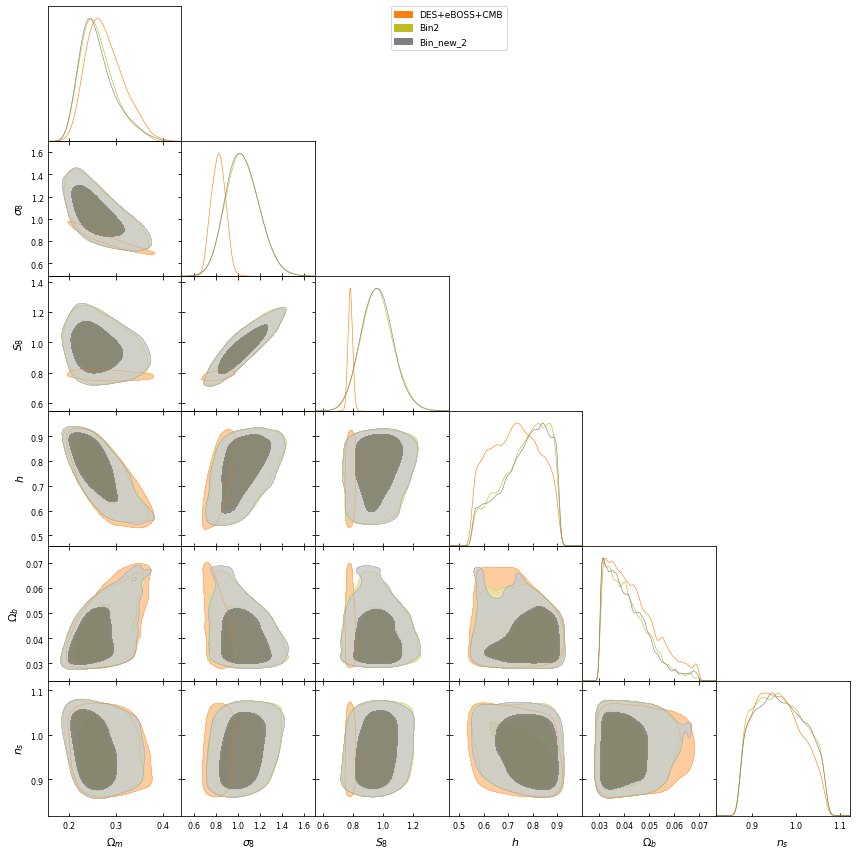

In [50]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec, dec_bin2, dec_bin_s2], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['dec_bin'], color['dec_bin2'], color['dec_bin_s2']],
                legend_labels=['DES+eBOSS+CMB', 'Bin2', 'Bin_new_2'])
g.finish_plot()

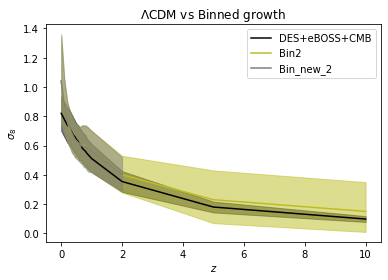

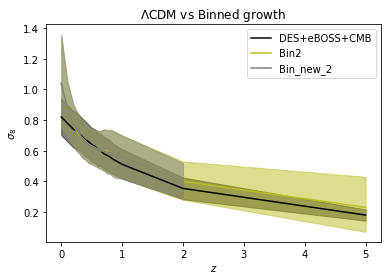

In [51]:
for cl, label, chain in zip(['dec', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.legend()
plt.show()

for cl, label, chain in zip(['dec', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

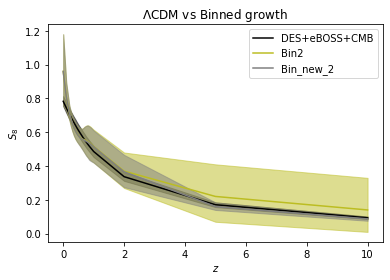

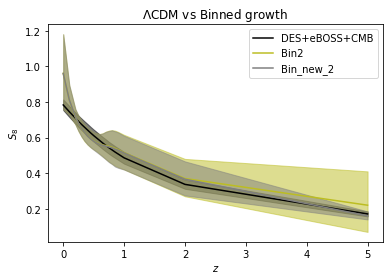

In [52]:
for cl, label, chain in zip(['dec', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.legend()
plt.show()

for cl, label, chain in zip(['dec', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

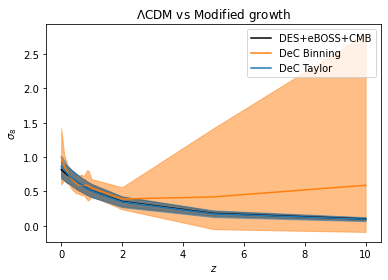

In [53]:
for cl, label, chain in zip(['dec', 'dec_bin', 'dec_tlr'], ['DES+eBOSS+CMB', 'DeC Binning', 'DeC Taylor'], [dec, dec_bin, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 10:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Modified growth')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

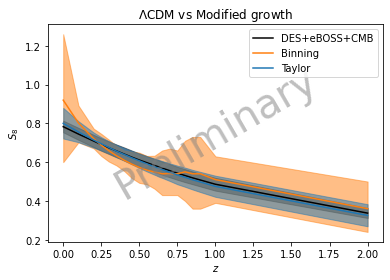

In [54]:
fig, ax = plt.subplots()
for cl, label, chain in zip(['dec', 'dec_bin', 'dec_tlr'], ['DES+eBOSS+CMB', 'Binning', 'Taylor'], [dec, dec_bin, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])


ax.text(0.5, 0.5, 'Preliminary', transform=ax.transAxes,
        fontsize=40, color='gray', alpha=0.5,
        ha='center', va='center', rotation='30')
    
plt.title(r'$\Lambda$CDM vs Modified growth')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

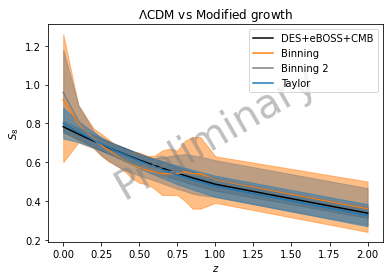

In [55]:
fig, ax = plt.subplots()
for cl, label, chain in zip(['dec', 'dec_bin', 'dec_bin_s2', 'dec_tlr'],
                            ['DES+eBOSS+CMB', 'Binning', 'Binning 2', 'Taylor'],
                            [dec, dec_bin, dec_bin_s2, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])


ax.text(0.5, 0.5, 'Preliminary', transform=ax.transAxes,
        fontsize=40, color='gray', alpha=0.5,
        ha='center', va='center', rotation='30')
    
plt.title(r'$\Lambda$CDM vs Modified growth')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

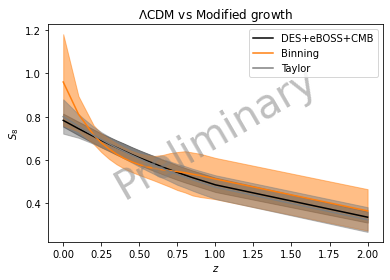

In [56]:
fig, ax = plt.subplots()
for cl, label, chain in zip(['dec', 'dec_bin', 'dec_bin_s2', 'dec_tlr'],
                            ['DES+eBOSS+CMB', 'Binning', 'Taylor'],
                            [dec, dec_bin_s2, dec_tlr]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])


ax.text(0.5, 0.5, 'Preliminary', transform=ax.transAxes,
        fontsize=40, color='gray', alpha=0.5,
        ha='center', va='center', rotation='30')
    
plt.title(r'$\Lambda$CDM vs Modified growth')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

### Linear vs Quadratic spline in Soft_2

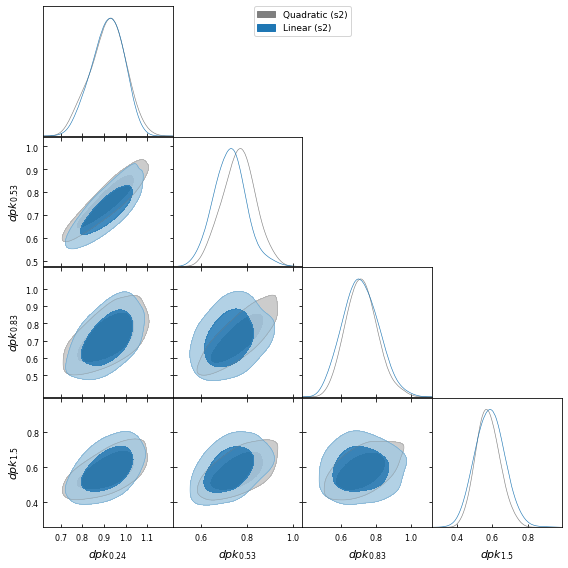

In [57]:
# dpk_{0.24 } = 0.92^{+0.16}_{-0.17}
# dpk_{0.53 } = 0.76^{+0.15}_{-0.14}
# dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
# dpk_{1.5 } = 0.57^{+0.15}_{-0.13}

g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, dec_bin_s2l], ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['Quadratic (s2)', 'Linear (s2)'])
g.finish_plot()

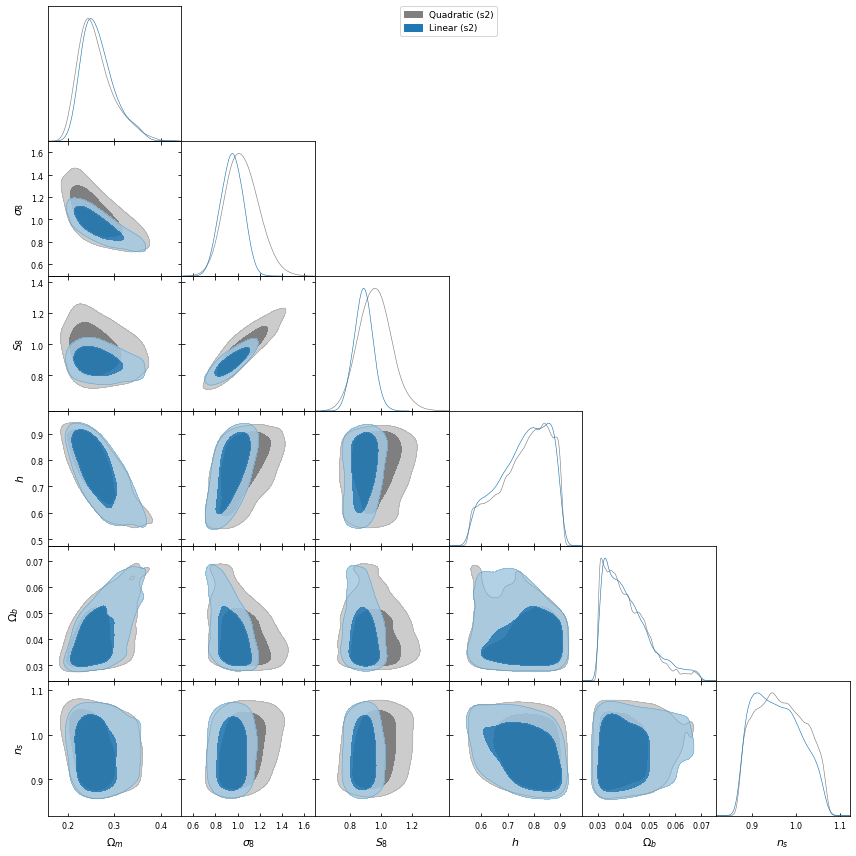

In [58]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, dec_bin_s2l], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['Quadratic (s2)', 'Linear (s2)'])
g.finish_plot()

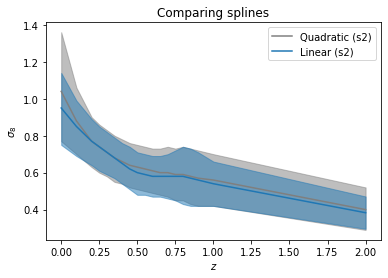

In [59]:
for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['Quadratic (s2)', 'Linear (s2)'],
                            [dec_bin_s2, dec_bin_s2l]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()

# No z>5 because sigma8(z=5) = Planck's

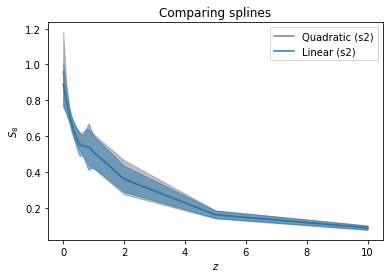

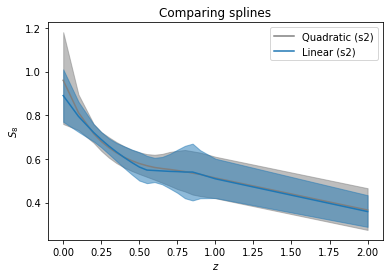

In [60]:
for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['Quadratic (s2)', 'Linear (s2)'],
                            [dec_bin_s2, dec_bin_s2l]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()


for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['Quadratic (s2)', 'Linear (s2)'],
                            [dec_bin_s2, dec_bin_s2l]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()


### Bin vs Bin2

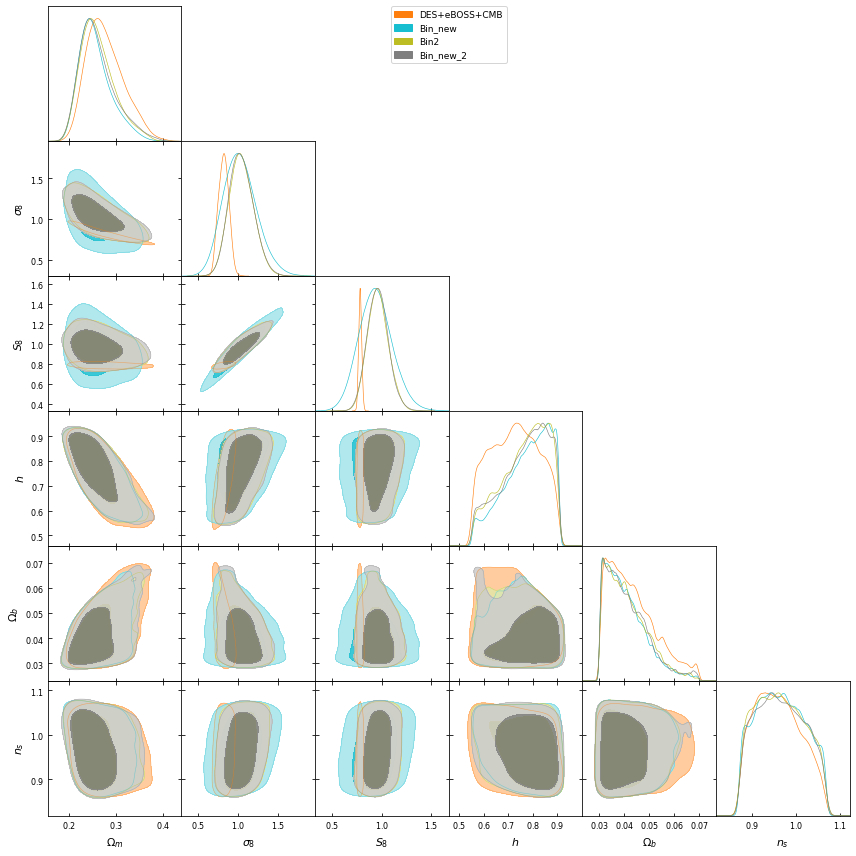

In [61]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec, dec_bin_s, dec_bin2, dec_bin_s2], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['dec_bin'], color['dec_bin_s'], color['dec_bin2'], color['dec_bin_s2']],
                legend_labels=['DES+eBOSS+CMB', 'Bin_new', 'Bin2', 'Bin_new_2'])
g.finish_plot()

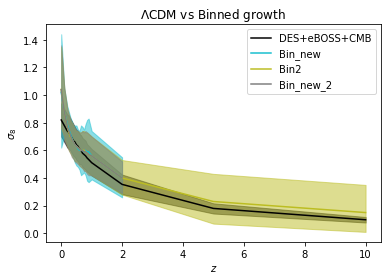

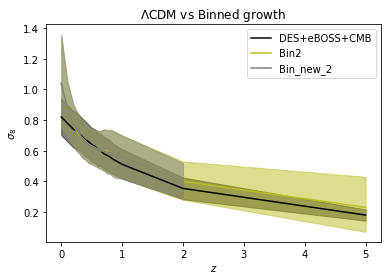

In [62]:
for cl, label, chain in zip(['dec', 'dec_bin_s', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin_new', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin_s, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.legend()
plt.show()

for cl, label, chain in zip(['dec', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

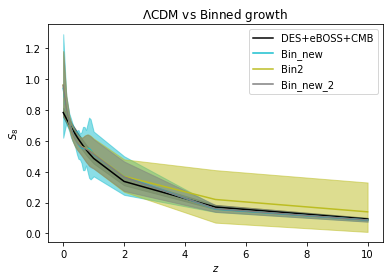

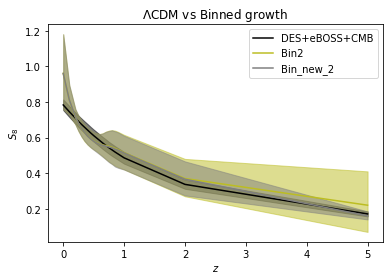

In [63]:
for cl, label, chain in zip(['dec', 'dec_bin_s', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin_new', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin_s, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.legend()
plt.show()

for cl, label, chain in zip(['dec', 'dec_bin2', 'dec_bin_s2'],
                            ['DES+eBOSS+CMB', 'Bin2', 'Bin_new_2'],
                            [dec, dec_bin2, dec_bin_s2]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 5:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
    #         print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM vs Binned growth')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

### Results

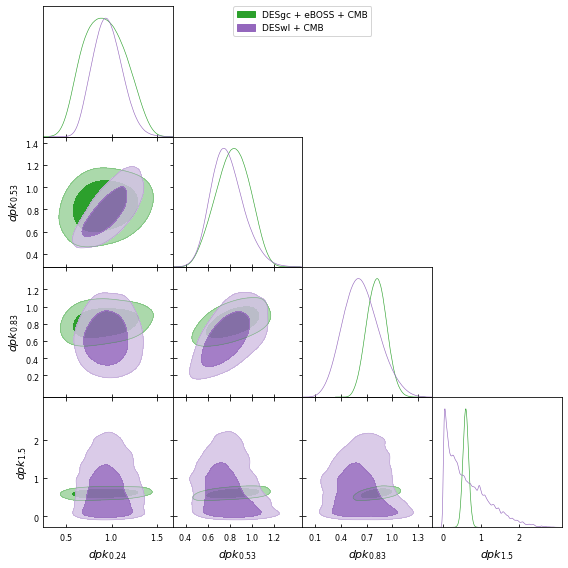

In [64]:
g = plots.get_subplot_plotter()
g.triangle_plot([dgcec_bin_s2, dwlc_bin_s2], ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=[color['dgcec_bin_s2'], color['dwlc_bin_s2']],
                legend_labels=['DESgc + eBOSS + CMB', 'DESwl + CMB'])
g.finish_plot()

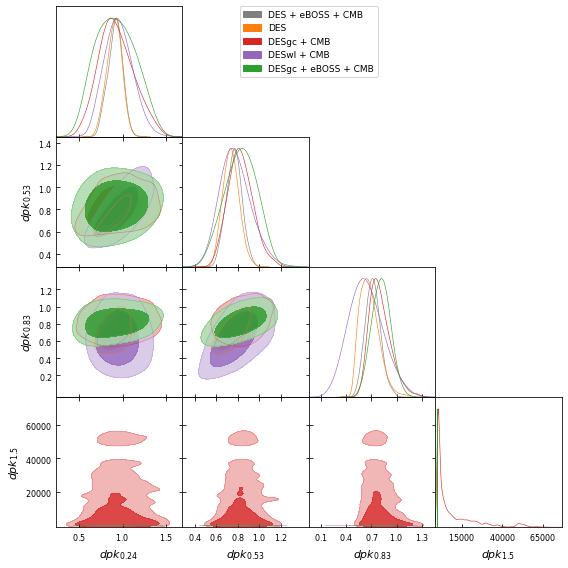

In [65]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, d_bin_s2, dgcc_bin_s2, dwlc_bin_s2, dgcec_bin_s2], ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=[color['dec_bin_s2'], color['d_bin_s2'], color['dgcc_bin_s2'],
                               color['dwlc_bin_s2'], color['dgcec_bin_s2']],
                legend_labels=['DES + eBOSS + CMB', 'DES', 'DESgc + CMB', 'DESwl + CMB',
                               'DESgc + eBOSS + CMB'])
g.finish_plot()

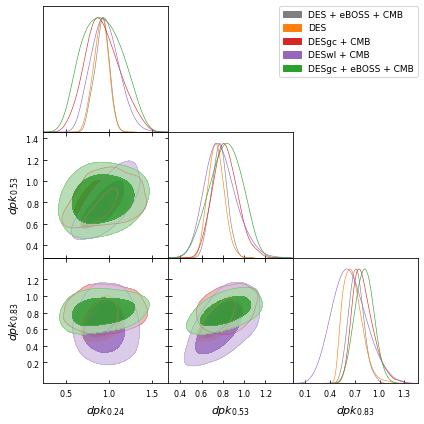

In [66]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, d_bin_s2, dgcc_bin_s2, dwlc_bin_s2, dgcec_bin_s2], ['dpk_0.24', 'dpk_0.53', 'dpk_0.83'],
                filled=True, 
                contour_colors=[color['dec_bin_s2'], color['d_bin_s2'], color['dgcc_bin_s2'],
                               color['dwlc_bin_s2'], color['dgcec_bin_s2']],
                legend_labels=['DES + eBOSS + CMB', 'DES', 'DESgc + CMB', 'DESwl + CMB',
                               'DESgc + eBOSS + CMB'])
g.finish_plot()

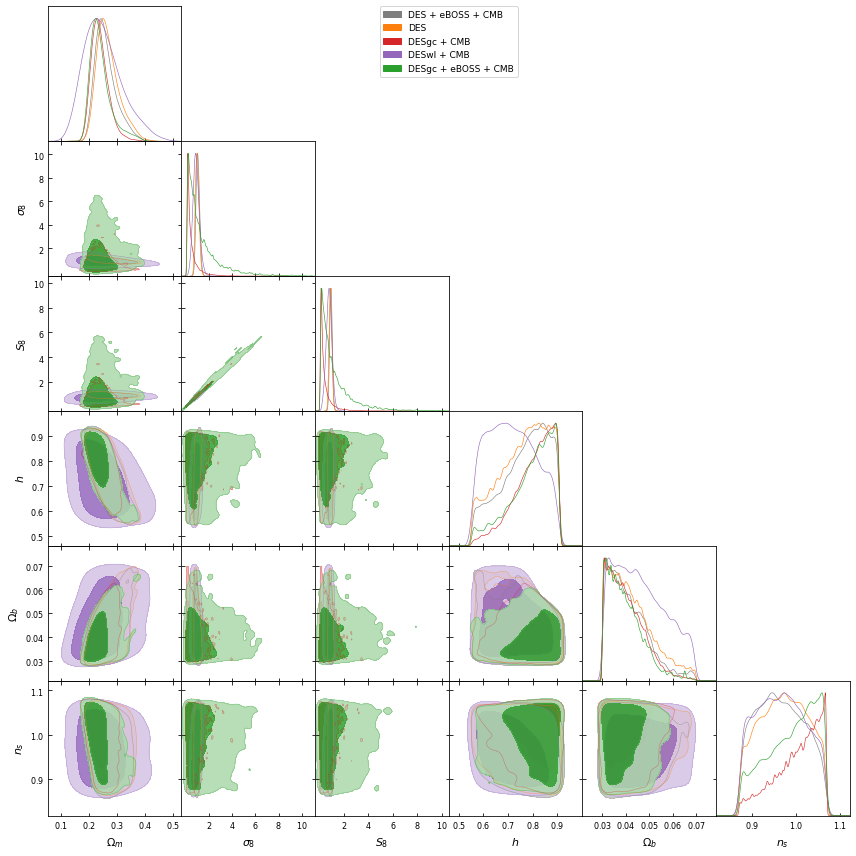

In [67]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, d_bin_s2, dgcc_bin_s2, dwlc_bin_s2, dgcec_bin_s2],
                ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=[color['dec_bin_s2'], color['d_bin_s2'], color['dgcc_bin_s2'],
                               color['dwlc_bin_s2'], color['dgcec_bin_s2']],
                legend_labels=['DES + eBOSS + CMB', 'DES', 'DESgc + CMB', 'DESwl + CMB',
                               'DESgc + eBOSS + CMB'])
g.finish_plot()

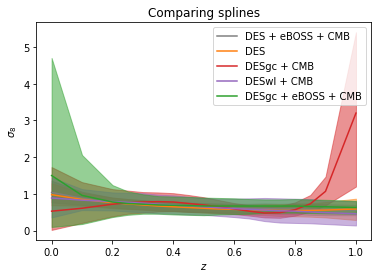

In [68]:
ckeys = ['dec_bin_s2', 'd_bin_s2', 'dgcc_bin_s2', 'dwlc_bin_s2', 'dgcec_bin_s2']
labels = ['DES + eBOSS + CMB', 'DES', 'DESgc + CMB', 'DESwl + CMB', 'DESgc + eBOSS + CMB']
chains = [dec_bin_s2, d_bin_s2, dgcc_bin_s2, dwlc_bin_s2, dgcec_bin_s2]

for cl, label, chain in zip(ckeys, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 1:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()

# No z>5 because sigma8(z=5) = Planck's

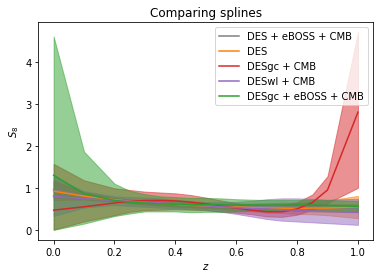

In [69]:
ckeys = ['dec_bin_s2', 'd_bin_s2', 'dgcc_bin_s2', 'dwlc_bin_s2', 'dgcec_bin_s2']
labels = ['DES + eBOSS + CMB', 'DES', 'DESgc + CMB', 'DESwl + CMB', 'DESgc + eBOSS + CMB']
chains = [dec_bin_s2, d_bin_s2, dgcc_bin_s2, dwlc_bin_s2, dgcec_bin_s2]

# for cl, label, chain in zip(ckeys, labels, chains):
#     sigma8z = []
#     for p in chain.paramNames.list():
#         if 'S8z' in p:
#             z = float(p.split('_')[-1])
# #             if z > 1:
# #                 break
#             InlineLatex = chain.getInlineLatex(p, limit=2)
# #             print(InlineLatex)
#             sigma8z.append(extract_info(InlineLatex))
#     sigma8z = np.array(sigma8z).T
#     plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
#     plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
# plt.title(r'$\Lambda$CDM')
# plt.xlabel('$z$')
# plt.ylabel('$S_8$')
# plt.title(r'Comparing splines')
# plt.legend()
# plt.show()


for cl, label, chain in zip(ckeys, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 1:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()


### Results (converged only)

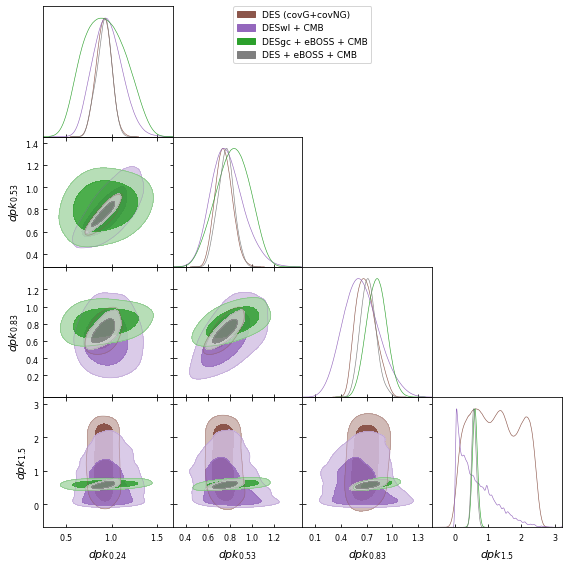

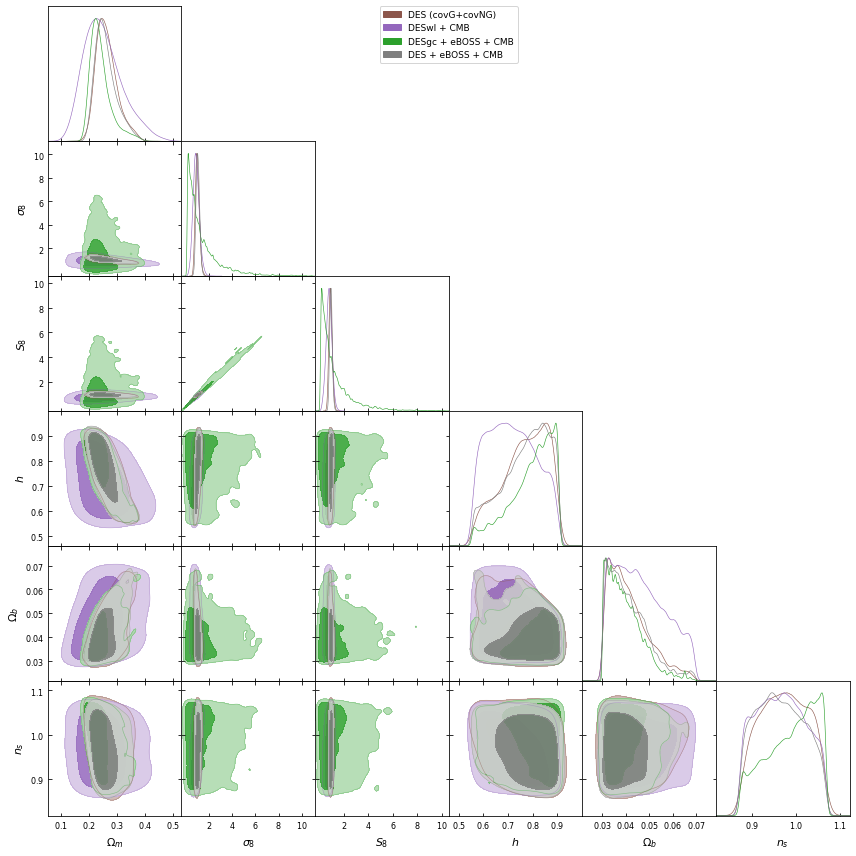

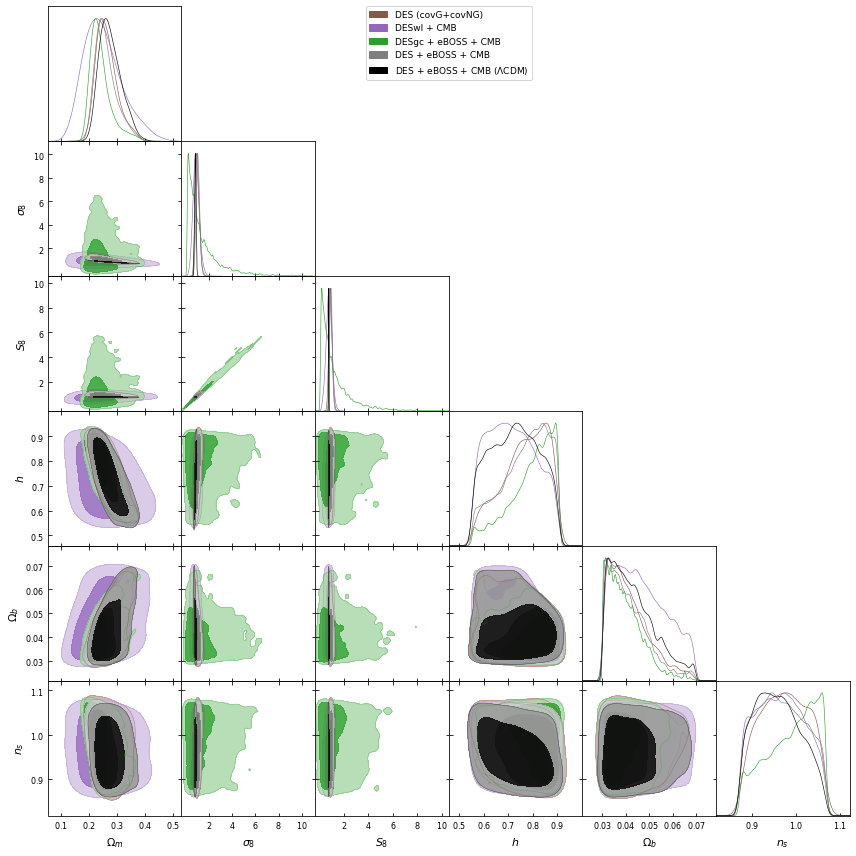

In [70]:
chains = [dcovGNG_bin_s2, dwlc_bin_s2, dgcec_bin_s2, dec_bin_s2]
contour_colors = [color['dcovGNG_bin_s2'], color['dwlc_bin_s2'], color['dgcec_bin_s2'], color['dec_bin_s2']]
ckeys = ['dcovGNG_bin_s2', 'dwlc_bin_s2', 'dgcec_bin_s2', 'dec_bin_s2']
legend_labels = ['DES (covG+covNG)', 'DESwl + CMB', 'DESgc + eBOSS + CMB', 'DES + eBOSS + CMB']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

#######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

#######
g = plots.get_subplot_plotter()
g.triangle_plot(chains + [dec], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=contour_colors + [color['dec']],
                legend_labels=legend_labels + [r'DES + eBOSS + CMB ($\Lambda$CDM)'])
g.finish_plot()

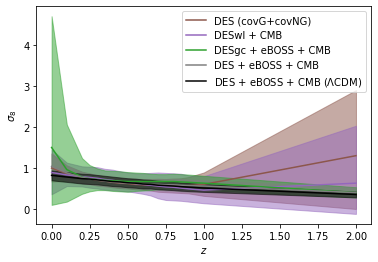

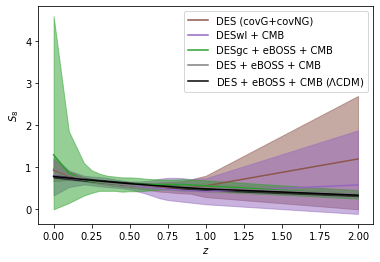

In [71]:
chains = [dcovGNG_bin_s2, dwlc_bin_s2, dgcec_bin_s2, dec_bin_s2]
contour_colors = [color['dcovGNG_bin_s2'], color['dwlc_bin_s2'], color['dgcec_bin_s2'], color['dec_bin_s2']]
ckeys = ['dcovGNG_bin_s2', 'dwlc_bin_s2', 'dgcec_bin_s2', 'dec_bin_s2']
legend_labels = ['DES (covG+covNG)', 'DESwl + CMB', 'DESgc + eBOSS + CMB', 'DES + eBOSS + CMB']

chains += [dec]
contour_colors += [color['dec']]
ckeys += ['dec']
legend_labels += [r'DES + eBOSS + CMB ($\Lambda$CDM)']

########### sigma8(z) ###########
for cl, label, chain in zip(ckeys, legend_labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

# No z>5 because sigma8(z=5) = Planck's



########### S8(z) #############
for cl, label, chain in zip(ckeys, legend_labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

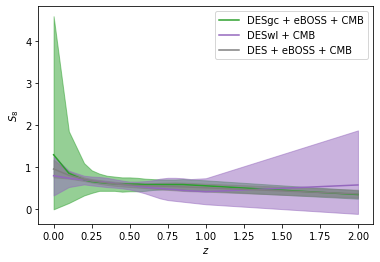

In [102]:
chains = [dgcec_bin_s2, dwlc_bin_s2, dec_bin_s2]
contour_colors = [color['dgcec_bin_s2'], color['dwlc_bin_s2'], color['dec_bin_s2']]
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
legend_labels = ['DESgc + eBOSS + CMB', 'DESwl + CMB', 'DES + eBOSS + CMB']

########### S8(z) #############
for cl, label, chain in zip(ckeys, legend_labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

In [209]:
###
kc_bin_s2_di = np.load('./cl_cross_corr_v3_K1000_CMB_binning_softer_2/cl_cross_corr_data_info.npz')
kc_bin_s2_bfi = np.load('./cl_cross_corr_v3_K1000_CMB_binning_softer_2/cl_cross_corr_bestfit_info.npz')

kc_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_K1000_CMB_binning_softer_2/2021-04-30_10000000_',
                            settings={'ignore_rows':0.5})

print('kc_bin_s2', kc_bin_s2.getGelmanRubin(21))
add_S8z_at_nodes(kc_bin_s2)

###
dwlc_bin_s2_di = np.load('./cl_cross_corr_v3_DESwl_CMB_binning_softer_2/cl_cross_corr_data_info.npz')
dwlc_bin_s2_bfi = np.load('./cl_cross_corr_v3_DESwl_CMB_binning_softer_2/cl_cross_corr_bestfit_info.npz')

dwlc_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DESwl_CMB_binning_softer_2/2021-04-06_1000000_',
                            settings={'ignore_rows':0.5})

print('dwlc_bin_s2', dwlc_bin_s2.getGelmanRubin(18))
add_S8z_at_nodes(dwlc_bin_s2)

# ###
# dgcec_bin_s2_di = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2_mag/cl_cross_corr_data_info.npz')
# dgcec_bin_s2_bfi = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2_mag/cl_cross_corr_bestfit_info.npz')

# dgcec_bin_s2 = getdist.loadMCSamples('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2_mag/2021-05-13_10000000_',
#                                    chain_exclude=[5],                            
#                                      settings={'ignore_rows':0.5})

# print('dgcec_bin_s2', dgcec_bin_s2.getGelmanRubin(20))
# add_S8z_at_nodes(dgcec_bin_s2)

kc_bin_s2 0.014819206868018981
dwlc_bin_s2 0.026090267241457042


In [212]:
dwlc_bin_s2_interp = dwlc_bin_s2.copy()
add_interpd_S8z(dwlc_bin_s2_interp)
#
# kc_bin_s2_interp = kc_bin_s2.copy()
# add_interpd_S8z(kc_bin_s2_interp)
#
# dgcec_bin_s2_interp = dgcec_bin_s2.copy()
# add_interpd_S8z(dgcec_bin_s2_interp)

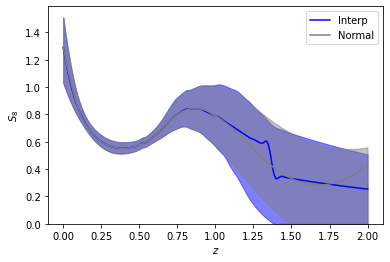

In [211]:
chains = [kc_bin_s2_interp, kc_bin_s2]
contour_colors = ['blue', 'gray']
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
legend_labels = ['Interp', 'Normal']

########### S8(z) #############
for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if (('S8z' in p) and (label == 'Normal')) or (('S8zInt' in p) and (label == 'Interp')):
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
            sigma8z.append(extract_info(InlineLatex))
#     if label == 'Interp':
#         sigma8z = sigma8z[1:]
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(plt, sigma8z, label, cl)

plt.ylim([0, None])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

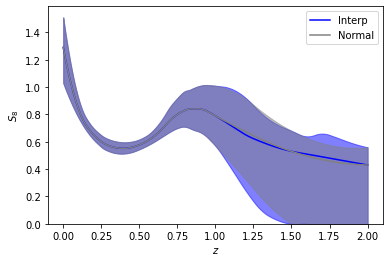

In [15]:
chains = [kc_bin_s2_interp, kc_bin_s2]
contour_colors = ['blue', 'gray']
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
legend_labels = ['Interp', 'Normal']

########### S8(z) #############
for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
            sigma8z.append(extract_info(InlineLatex))
#     if label == 'Interp':
#         sigma8z = sigma8z[1:]
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(plt, sigma8z, label, cl)

plt.ylim([0, None])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

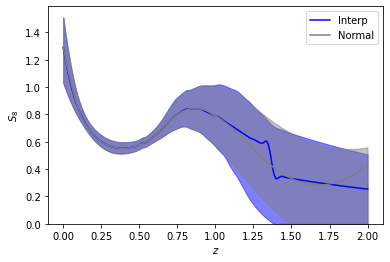

In [211]:
chains = [kc_bin_s2_interp, kc_bin_s2]
contour_colors = ['blue', 'gray']
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
legend_labels = ['Interp', 'Normal']

########### S8(z) #############
for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if (('S8z' in p) and (label == 'Normal')) or (('S8zInt' in p) and (label == 'Interp')):
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
            sigma8z.append(extract_info(InlineLatex))
#     if label == 'Interp':
#         sigma8z = sigma8z[1:]
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(plt, sigma8z, label, cl)

plt.ylim([0, None])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

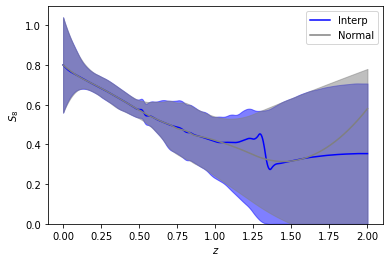

In [213]:
chains = [dwlc_bin_s2_interp, dwlc_bin_s2]
contour_colors = ['blue', 'gray']
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
legend_labels = ['Interp', 'Normal']

########### S8(z) #############
for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if (('S8z' in p) and (label == 'Normal')) or (('S8zInt' in p) and (label == 'Interp')):
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             if label == 'Interp':
#                 print(InlineLatex)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(plt, sigma8z, label, cl)

plt.ylim([0, None])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

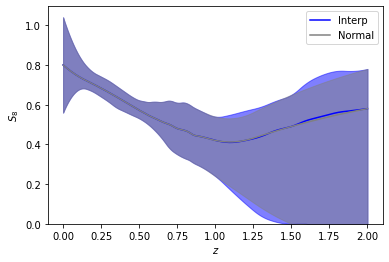

In [11]:
chains = [dwlc_bin_s2_interp, dwlc_bin_s2]
contour_colors = ['blue', 'gray']
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
legend_labels = ['Interp', 'Normal']

########### S8(z) #############
for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             if label == 'Interp':
#                 print(InlineLatex)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(plt, sigma8z, label, cl)

plt.ylim([0, None])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

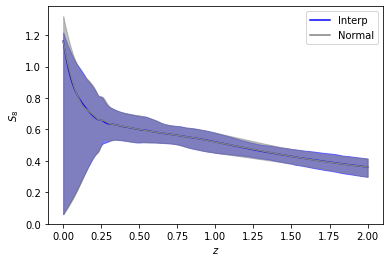

In [204]:
chains = [dgcec_bin_s2_interp, dgcec_bin_s2]
contour_colors = ['blue', 'gray']
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
legend_labels = ['Interp', 'Normal']

########### S8(z) #############
for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if (('S8z' in p) and (label == 'Normal')) or (('S8zInt' in p) and (label == 'Interp')):
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             if label == 'Interp':
#                 print(InlineLatex)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(plt, sigma8z, label, cl)

plt.ylim([0, None])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

In [206]:
dgcec_bin_s2_interp.getInlineLatex('S8z_0'), dgcec_bin_s2_interp.getInlineLatex('S8zInt_0.0')

('S8z_{0 } = 1.16^{+0.16}_{-1.1}', 'S8z_{0.0} = 1.162^{+0.054}_{-1.1}')

## Magnification vs No Magnification

### DES + eBOSS + CMB

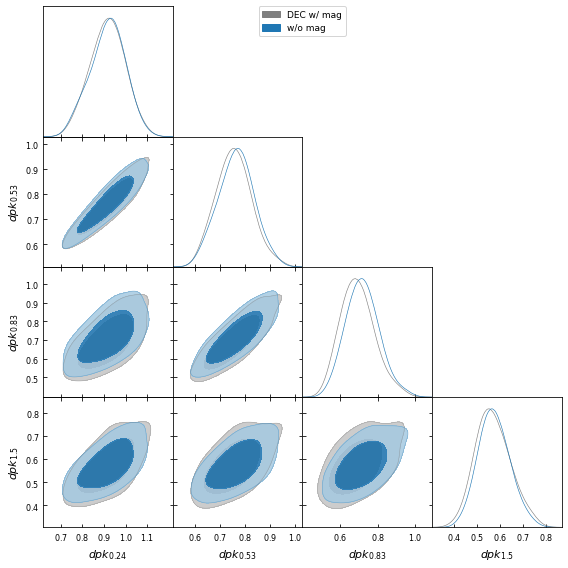

In [324]:
# dpk_{0.24 } = 0.92^{+0.16}_{-0.17}
# dpk_{0.53 } = 0.76^{+0.15}_{-0.14}
# dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
# dpk_{1.5 } = 0.57^{+0.15}_{-0.13}

g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, dec_bin_s2_nm], ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['DEC w/ mag', 'w/o mag'])
g.finish_plot()

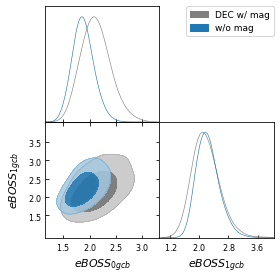

In [152]:
# dpk_{0.24 } = 0.92^{+0.16}_{-0.17}
# dpk_{0.53 } = 0.76^{+0.15}_{-0.14}
# dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
# dpk_{1.5 } = 0.57^{+0.15}_{-0.13}

g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, dec_bin_s2_nm], ['eBOSS__0_gc_b', 'eBOSS__1_gc_b'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['DEC w/ mag', 'w/o mag'])
g.finish_plot()

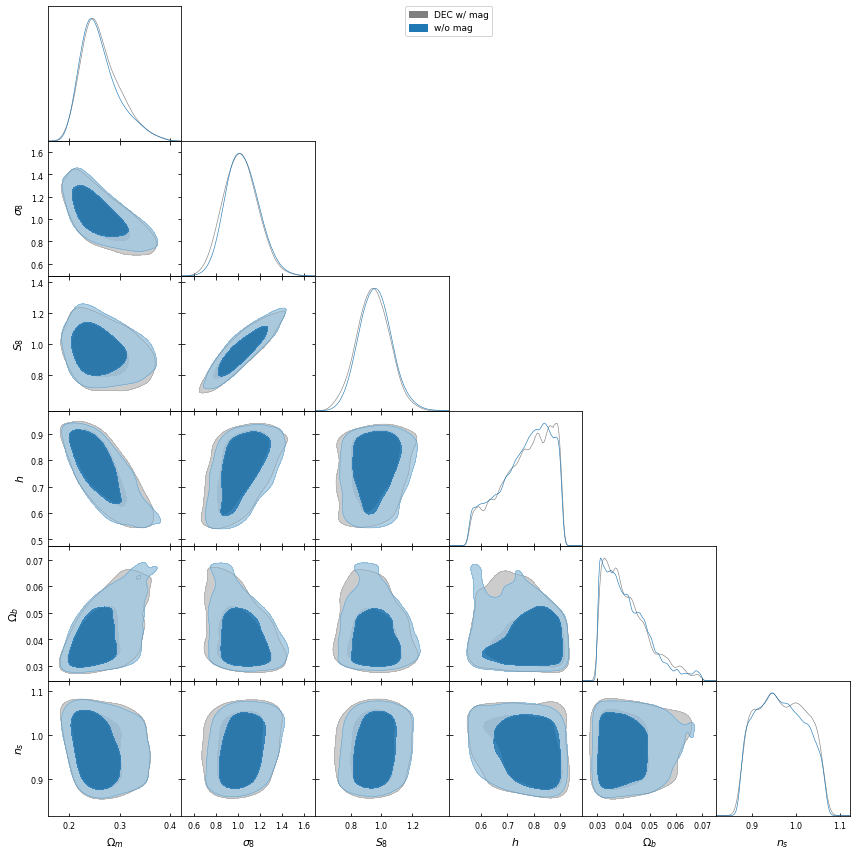

In [325]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, dec_bin_s2_nm], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['DEC w/ mag', 'w/o mag'])
g.finish_plot()

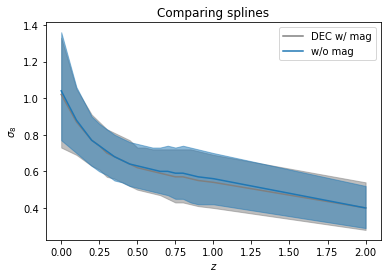

In [327]:
for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['DEC w/ mag', 'w/o mag'],
                            [dec_bin_s2, dec_bin_s2_nm]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()

# No z>5 because sigma8(z=5) = Planck's

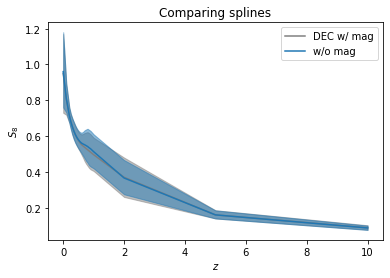

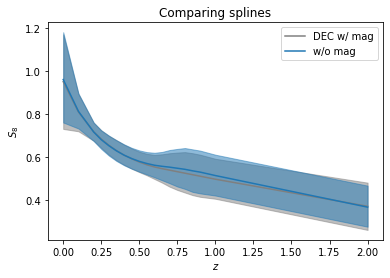

In [328]:
for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['DEC w/ mag', 'w/o mag'],
                            [dec_bin_s2, dec_bin_s2_nm]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()


for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['DEC w/ mag', 'w/o mag'],
                            [dec_bin_s2, dec_bin_s2_nm]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()


### DESgc + eBOSS + CMB

In [146]:
###
dgcec_bin_s2_nm_di = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2/cl_cross_corr_data_info.npz')
dgcec_bin_s2_nm_bfi = np.load('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2/cl_cross_corr_bestfit_info.npz')

dgcec_bin_s2_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DESgc_eBOSS_CMB_binning_softer_2/2021-04-12_11000000_',
                                     settings={'ignore_rows':0.5})

print('dgcec_bin_s2_nm', dgcec_bin_s2_nm.getGelmanRubin(20))
print('dgcec_bin_s2', dgcec_bin_s2.getGelmanRubin(20))

dgcec_bin_s2_nm 0.03178687149159865
dgcec_bin_s2 0.05008426727411814


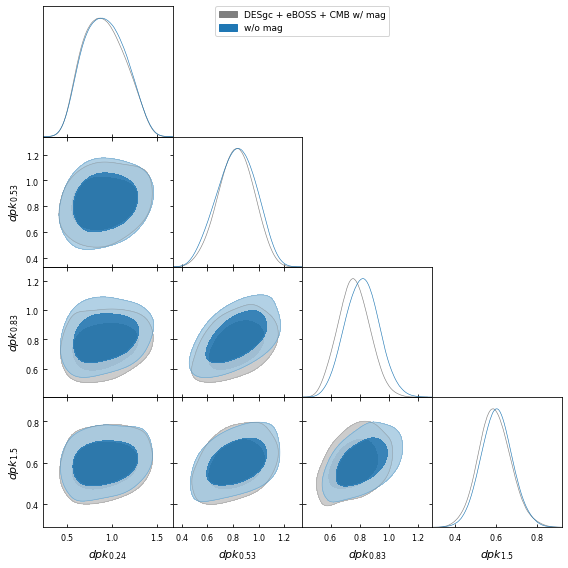

In [147]:
# dpk_{0.24 } = 0.92^{+0.16}_{-0.17}
# dpk_{0.53 } = 0.76^{+0.15}_{-0.14}
# dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
# dpk_{1.5 } = 0.57^{+0.15}_{-0.13}

g = plots.get_subplot_plotter()
g.triangle_plot([dgcec_bin_s2, dgcec_bin_s2_nm], ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['DESgc + eBOSS + CMB w/ mag', 'w/o mag'])
g.finish_plot()

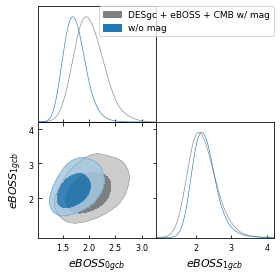

In [154]:
# dpk_{0.24 } = 0.92^{+0.16}_{-0.17}
# dpk_{0.53 } = 0.76^{+0.15}_{-0.14}
# dpk_{0.83 } = 0.72^{+0.18}_{-0.18}
# dpk_{1.5 } = 0.57^{+0.15}_{-0.13}

g = plots.get_subplot_plotter()
g.triangle_plot([dgcec_bin_s2, dgcec_bin_s2_nm], ['eBOSS__0_gc_b', 'eBOSS__1_gc_b'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dec_bin_s2l']],
                legend_labels=['DESgc + eBOSS + CMB w/ mag', 'w/o mag'])
g.finish_plot()

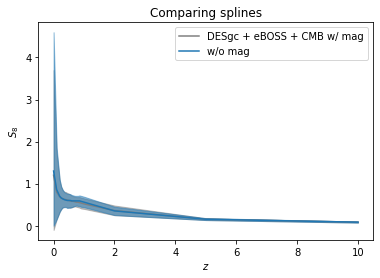

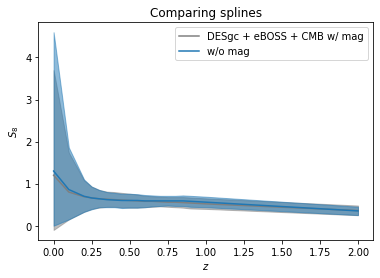

In [149]:
for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['DESgc + eBOSS + CMB w/ mag', 'w/o mag'],
                            [dgcec_bin_s2, dgcec_bin_s2_nm]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
#             if z > 2:
#                 break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()


for cl, label, chain in zip(['dec_bin_s2', 'dec_bin_s2l'],
                            ['DESgc + eBOSS + CMB w/ mag', 'w/o mag'],
                            [dgcec_bin_s2, dgcec_bin_s2_nm]):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.title(r'$\Lambda$CDM')
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title(r'Comparing splines')
plt.legend()
plt.show()


## DES covG vs covGNG

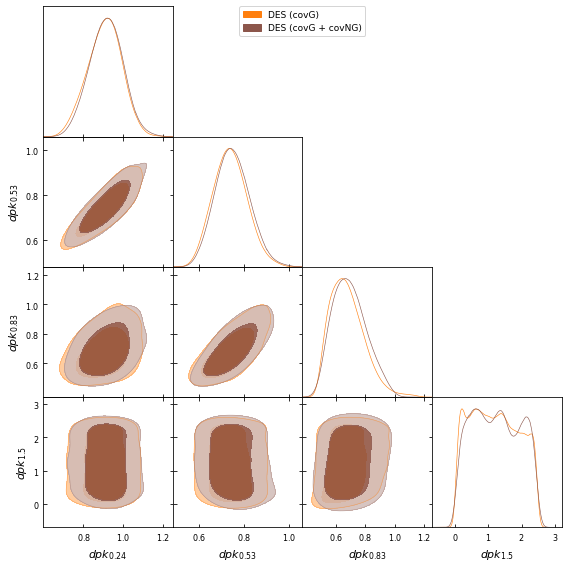

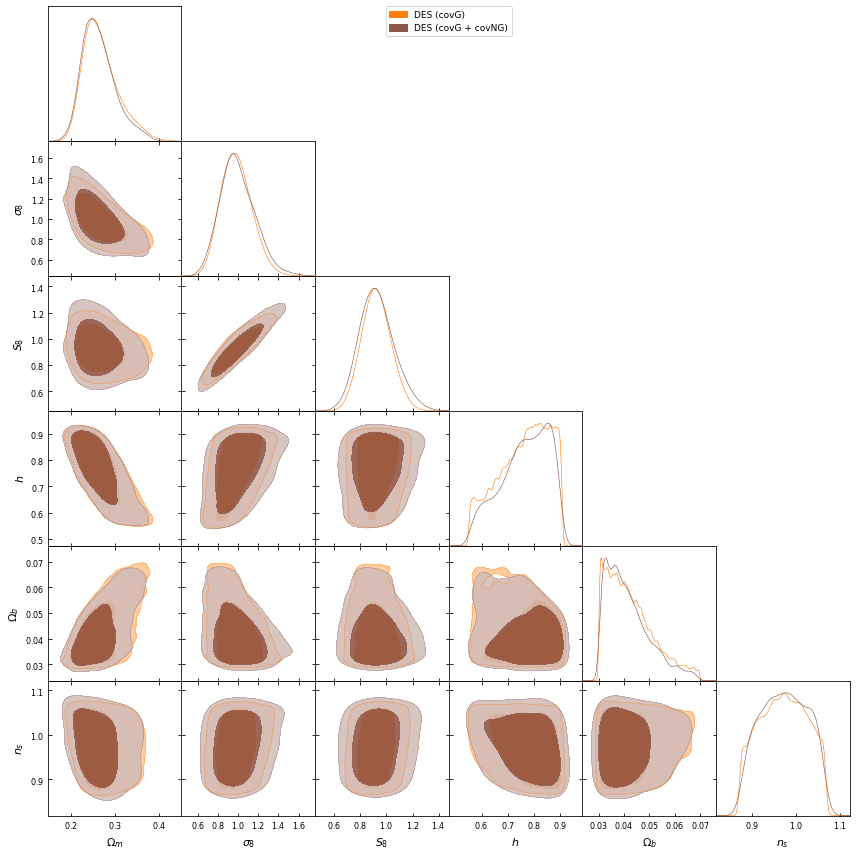

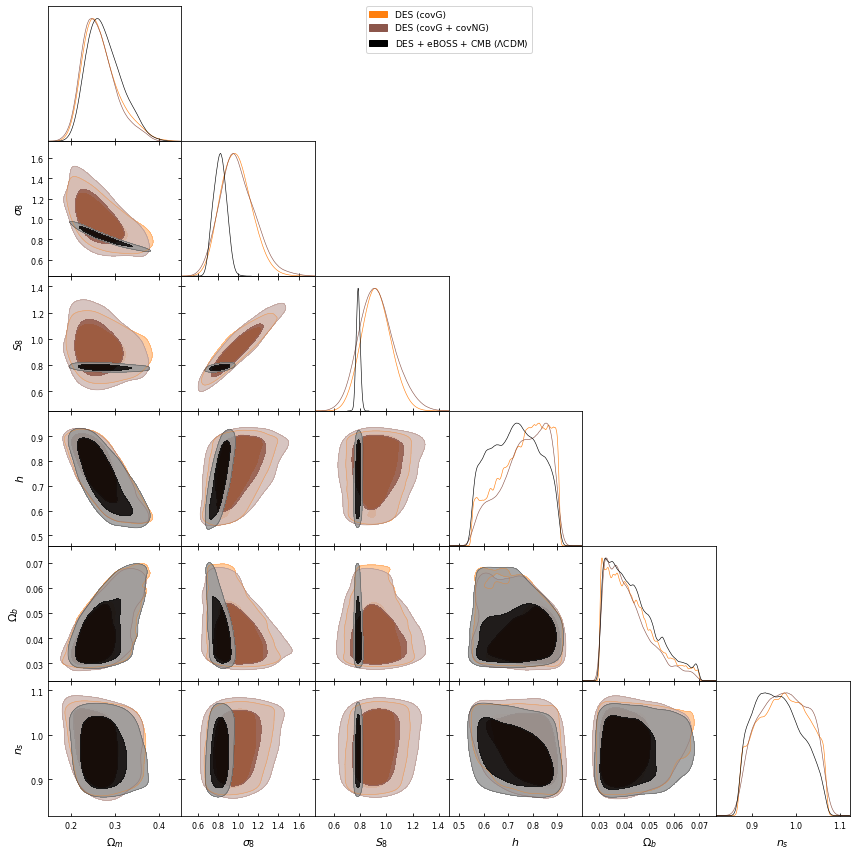

In [72]:
chains = [d_bin_s2, dcovGNG_bin_s2]
contour_colors = [color['d_bin_s2'], color['dcovGNG_bin_s2']]
ckeys = ['d_bin_s2', 'dcovGNG_bin_s2']
legend_labels = ['DES (covG)', 'DES (covG + covNG)']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

#######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

#######
g = plots.get_subplot_plotter()
g.triangle_plot(chains + [dec], ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=contour_colors + [color['dec']],
                legend_labels=legend_labels + [r'DES + eBOSS + CMB ($\Lambda$CDM)'])
g.finish_plot()

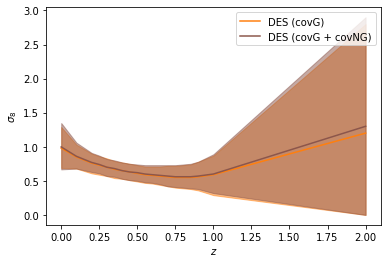

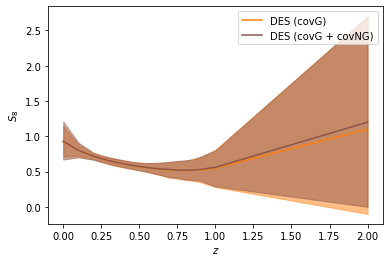

In [73]:
chains = [d_bin_s2, dcovGNG_bin_s2]
contour_colors = [color['d_bin_s2'], color['dcovGNG_bin_s2']]
ckeys = ['d_bin_s2', 'dcovGNG_bin_s2']
legend_labels = ['DES (covG)', 'DES (covG + covNG)']

########### sigma8(z) ###########
for cl, label, chain in zip(ckeys, legend_labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

# No z>5 because sigma8(z=5) = Planck's



########### S8(z) #############
for cl, label, chain in zip(ckeys, legend_labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

### Check biases

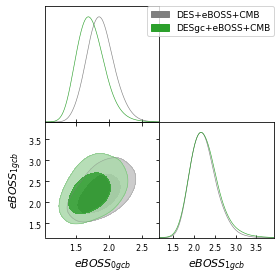

In [74]:
g = plots.get_subplot_plotter()
g.triangle_plot([dec_bin_s2, dgcec_bin_s2], ['eBOSS__0_gc_b', 'eBOSS__1_gc_b'],
                filled=True, contour_colors=[color['dec_bin_s2'], color['dgcec_bin_s2']],
                legend_labels=['DES+eBOSS+CMB', 'DESgc+eBOSS+CMB'])
g.finish_plot()

## KiDS

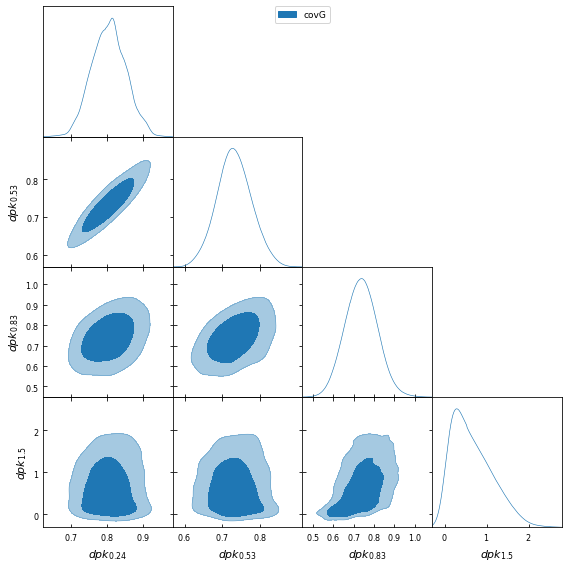

In [54]:
chains = [Dk_bin_s2]

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True)
g.finish_plot()

In [52]:
chains = [Dk_bin_s2, Dec_bin_s2, Dkec_bin_s2]
ckeys = ['Dk_bin_s2', 'Dec_bin_s2', 'Dkec_bin_s2']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['DECaLS + K1000', 'DECaLS + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB']

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

NameError: name 'Dec_bin_s2' is not defined

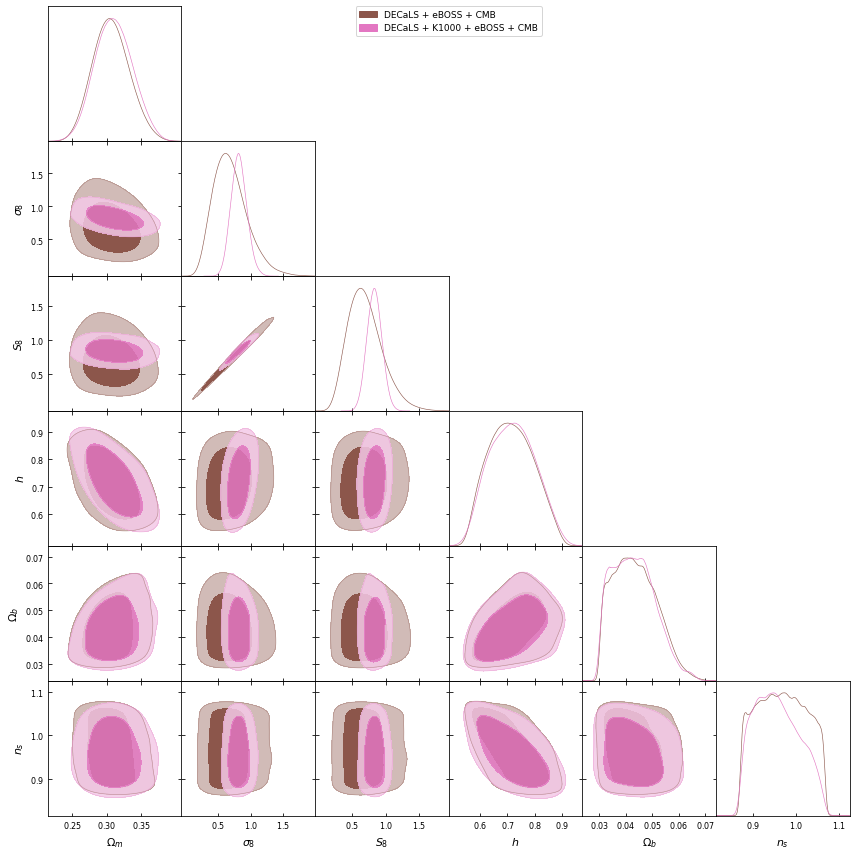

In [76]:
chains = [Dec_bin_s2, Dkec_bin_s2]
ckeys = ['Dec_bin_s2', 'Dkec_bin_s2']
contour_colors = [kcolor[c] for c in ckeys]
legend_labels = ['DECaLS + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

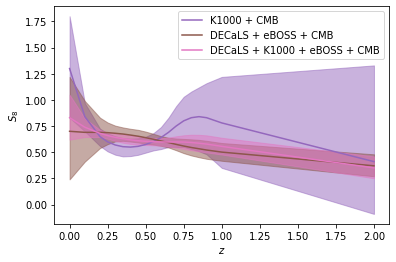

In [100]:
chains = [kc_bin_s2, Dec_bin_s2, Dkec_bin_s2]
ckeys = ['kc_bin_s2', 'Dec_bin_s2', 'Dkec_bin_s2']
labels = ['K1000 + CMB', 'DECaLS + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB']

# for cl, label, chain in zip(ckeys, labels, chains):
#     sigma8z = []
#     for p in chain.paramNames.list():
#         if 'S8z' in p:
#             z = float(p.split('_')[-1])
# #             if z > 1:
# #                 break
#             InlineLatex = chain.getInlineLatex(p, limit=2)
# #             print(InlineLatex)
#             sigma8z.append(extract_info(InlineLatex))
#     sigma8z = np.array(sigma8z).T
#     plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
#     plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
# plt.title(r'$\Lambda$CDM')
# plt.xlabel('$z$')
# plt.ylabel('$S_8$')
# plt.title(r'Comparing splines')
# plt.legend()
# plt.show()


for cl, label, chain in zip(ckeys, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=kcolor[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=kcolor[cl])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

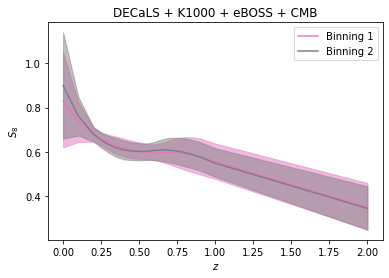

In [273]:
chains = [Dkec_bin_s2, Dkec_bin_s2_ndpk]
ckeys = ['Dkec_bin_s2', 'Dkec_bin_s2_ndpk']
labels = ['Binning 1', 'Binning 2']

for cl, label, chain in zip(ckeys, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=2)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=kcolor[cl])
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=kcolor[cl])
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.title('DECaLS + K1000 + eBOSS + CMB')
plt.legend()
plt.show()

## KiDS vs DES vs Planck vs all together

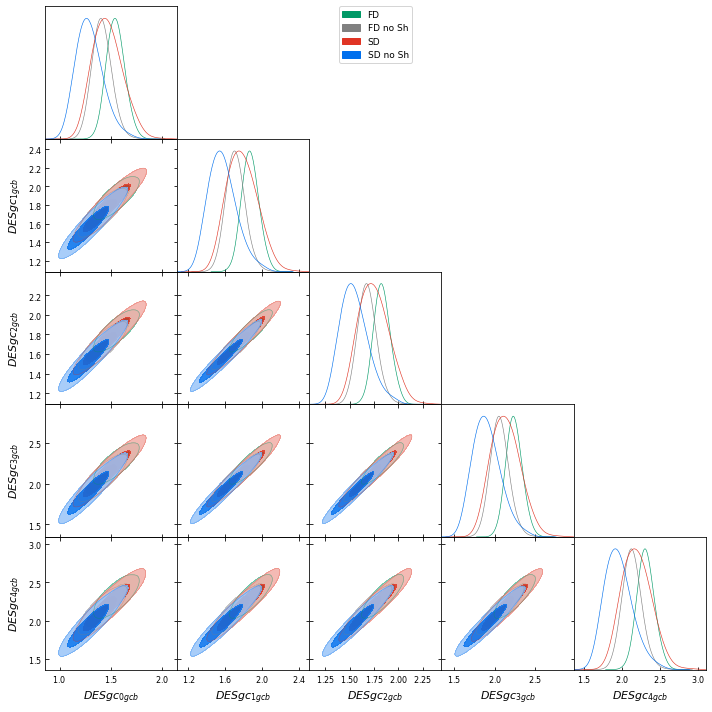

In [27]:
chains = [alld, alld_noSh, dec, dgcec]
legend_labels = ['FD', 'FD no Sh', 'SD', 'SD no Sh']

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['DESgc__0_gc_b', 'DESgc__1_gc_b', 'DESgc__2_gc_b', 'DESgc__3_gc_b', 'DESgc__4_gc_b'],
                filled=True, 
                legend_labels=legend_labels)
g.finish_plot()

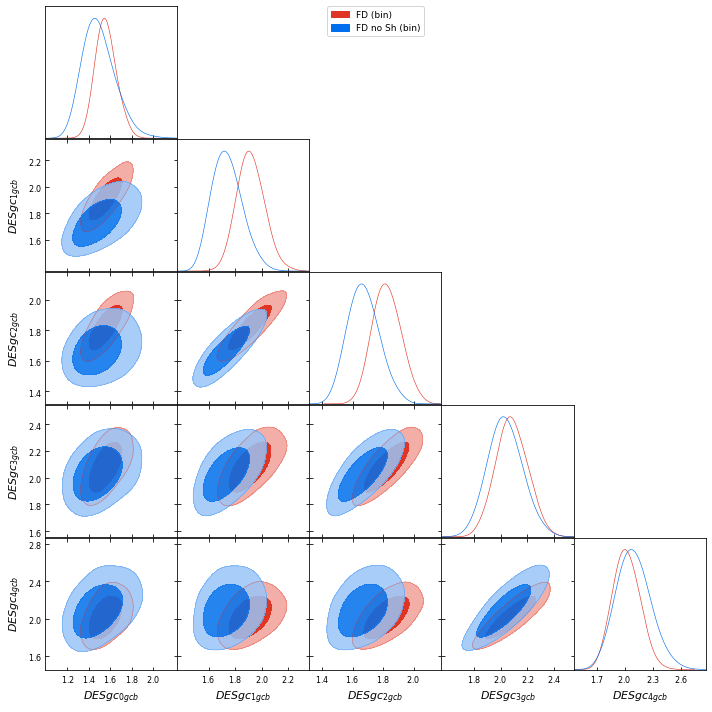

In [29]:
chains = [alld_bin_s2, alld_noSh_bin_s2]
legend_labels = ['FD (bin)', 'FD no Sh (bin)']

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['DESgc__0_gc_b', 'DESgc__1_gc_b', 'DESgc__2_gc_b', 'DESgc__3_gc_b', 'DESgc__4_gc_b'],
                filled=True, 
                legend_labels=legend_labels)
g.finish_plot()

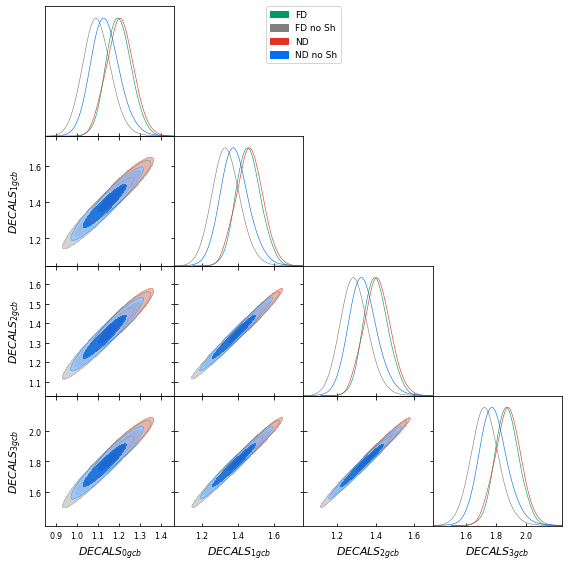

In [28]:
chains = [alld, alld_noSh, Dkec, Dec]
legend_labels = ['FD', 'FD no Sh', 'ND', 'ND no Sh']

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['DECALS__0_gc_b', 'DECALS__1_gc_b', 'DECALS__2_gc_b', 'DECALS__3_gc_b'],
                filled=True, 
                legend_labels=legend_labels)
g.finish_plot()

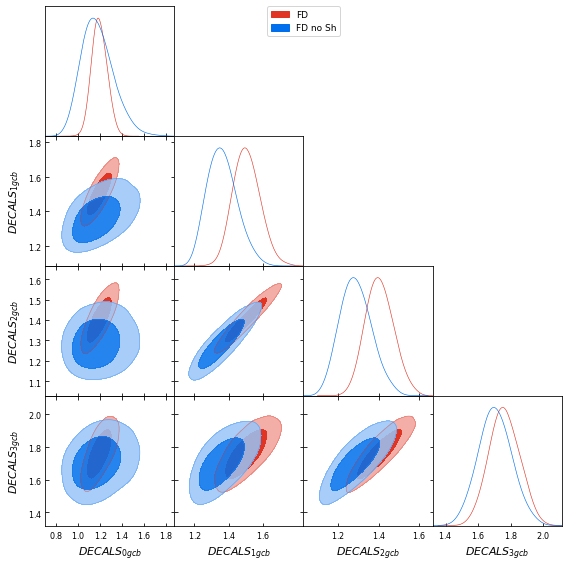

In [30]:
chains = [alld_bin_s2, alld_noSh_bin_s2]
legend_labels = ['FD', 'FD no Sh']

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['DECALS__0_gc_b', 'DECALS__1_gc_b', 'DECALS__2_gc_b', 'DECALS__3_gc_b'],
                filled=True, 
                legend_labels=legend_labels)
g.finish_plot()

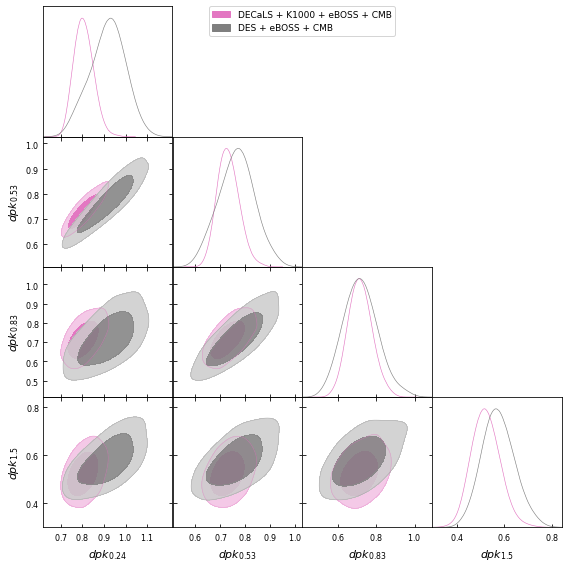

In [78]:
chains = [Dkec_bin_s2, dec_bin_s2]
ckeys = ['Dkec_bin_s2', 'dec_bin_s2']
contour_colors = [kcolor['Dkec_bin_s2'], color['dec_bin_s2']]
legend_labels = ['DECaLS + K1000 + eBOSS + CMB', 'DES + eBOSS + CMB']

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

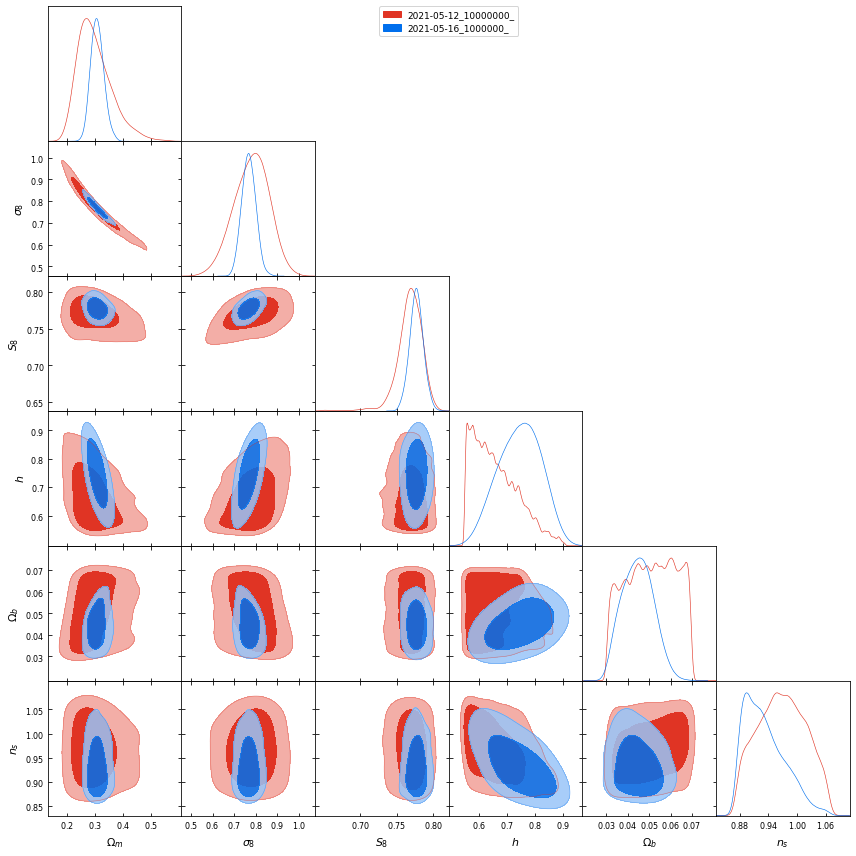

In [10]:
chains = [alld_noCl, alld]

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True)
g.finish_plot()

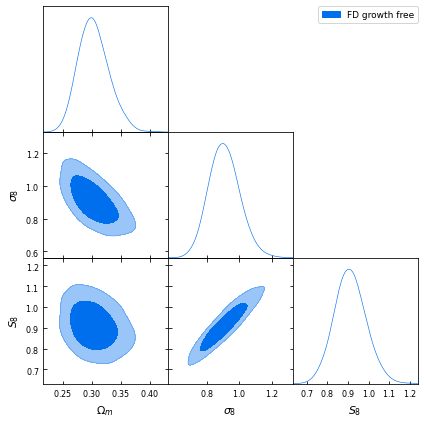

In [25]:
chains = [alld_bin_s2]

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8'],
                legend_labels=['FD growth free'],
                filled=True)
g.finish_plot()

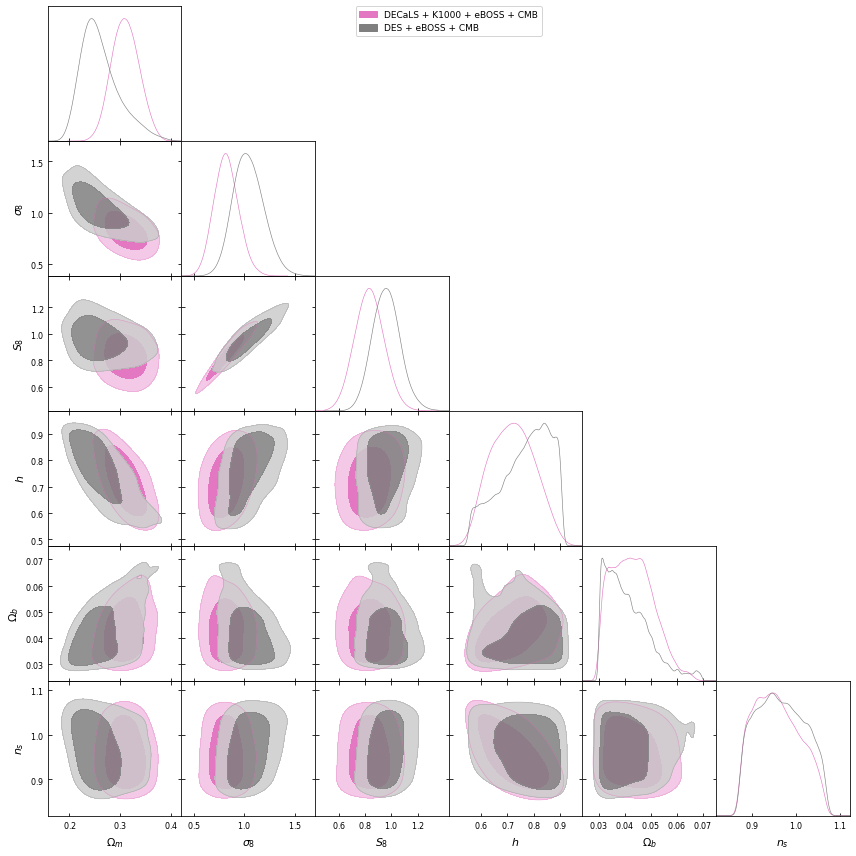

In [79]:
chains = [Dkec_bin_s2, dec_bin_s2]
ckeys = ['Dkec_bin_s2', 'dec_bin_s2']
contour_colors = [kcolor['Dkec_bin_s2'], color['dec_bin_s2']]
legend_labels = ['DECaLS + K1000 + eBOSS + CMB', 'DES + eBOSS + CMB']

######
g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['Omega_m', 'sigma_8', 'S_8', 'h', 'Omega_b', 'n_s'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

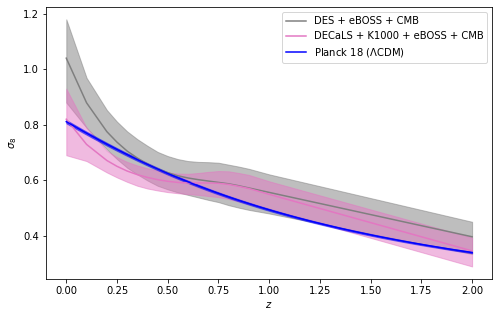

In [141]:
chains = [dec_bin_s2, Dkec_bin_s2]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2']
clist = [color['dec_bin_s2'], kcolor['Dkec_bin_s2']]
labels = ['DES + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB']

# for cl, label, chain in zip(ckeys, labels, chains):
#     sigma8z = []
#     for p in chain.paramNames.list():
#         if 'S8z' in p:
#             z = float(p.split('_')[-1])
# #             if z > 1:
# #                 break
#             InlineLatex = chain.getInlineLatex(p, limit=2)
# #             print(InlineLatex)
#             sigma8z.append(extract_info(InlineLatex))
#     sigma8z = np.array(sigma8z).T
#     plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
#     plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
# plt.title(r'$\Lambda$CDM')
# plt.xlabel('$z$')
# plt.ylabel('$S_8$')
# plt.title(r'Comparing splines')
# plt.legend()
# plt.show()


f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=cl)
    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = r'Planck 18 ($\Lambda$CDM)'
sigma8z = []
for p in chain.paramNames.list():
    if 'sigma8z_' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
plt.plot(p18_zarr, sigma8z[1], label=label, color=cl)
plt.fill_between(p18_zarr, sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                 alpha=.5, color=cl)

    
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

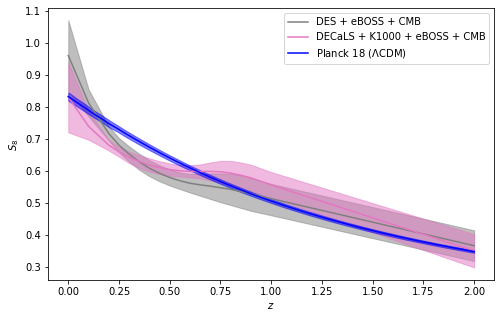

In [123]:
chains = [dec_bin_s2, Dkec_bin_s2]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2']
clist = [color['dec_bin_s2'], kcolor['Dkec_bin_s2']]
labels = ['DES + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB']

# for cl, label, chain in zip(ckeys, labels, chains):
#     sigma8z = []
#     for p in chain.paramNames.list():
#         if 'S8z' in p:
#             z = float(p.split('_')[-1])
# #             if z > 1:
# #                 break
#             InlineLatex = chain.getInlineLatex(p, limit=2)
# #             print(InlineLatex)
#             sigma8z.append(extract_info(InlineLatex))
#     sigma8z = np.array(sigma8z).T
#     plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
#     plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
# plt.title(r'$\Lambda$CDM')
# plt.xlabel('$z$')
# plt.ylabel('$S_8$')
# plt.title(r'Comparing splines')
# plt.legend()
# plt.show()


f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=cl)
    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = r'Planck 18 ($\Lambda$CDM)'
sigma8z = []
for p in chain.paramNames.list():
    if 'S8z' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
plt.plot(p18_zarr, sigma8z[1], label=label, color=cl)
plt.fill_between(p18_zarr, sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                 alpha=.5, color=cl)

    
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

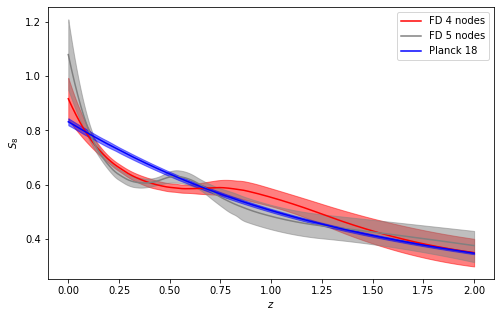

In [8]:
chains = [alld_bin_s2, alld_bin_s2_extra]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2']
clist = ['red', 'gray']
labels = ['FD 4 nodes', 'FD 5 nodes']


f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    _, ix = np.unique(sigma8z[0], return_index=True)
    sigma8z = sigma8z[:, ix]
    plot_interp1d_S8z(plt, sigma8z, label, cl)
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = 'Planck 18'
sigma8z = []
for p in chain.paramNames.list():
    if 'S8z' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
sigma8z[0, :] = p18_zarr
plot_interp1d_S8z(plt, sigma8z, label, cl)
        
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

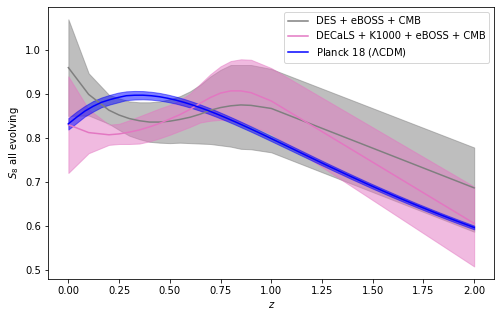

In [206]:
chains = [dec_bin_s2, Dkec_bin_s2]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2']
clist = [color['dec_bin_s2'], kcolor['Dkec_bin_s2']]
labels = ['DES + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB']

# chains = [Dkec_bin_s2]
# ckeys = ['Dkec_bin_s2']
# clist = [kcolor['Dkec_bin_s2']]
# labels = ['DECaLS + K1000 + eBOSS + CMB']

f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8tz' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=cl)
    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = r'Planck 18 ($\Lambda$CDM)'
sigma8z = []
for p in chain.paramNames.list():
    if 'S8tz' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
plt.plot(p18_zarr, sigma8z[1], label=label, color=cl)
plt.fill_between(p18_zarr, sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                 alpha=.5, color=cl)

    
plt.xlabel('$z$')
plt.ylabel('$S_8$ all evolving')
plt.legend()
plt.show()

## Fiducial vs Planck

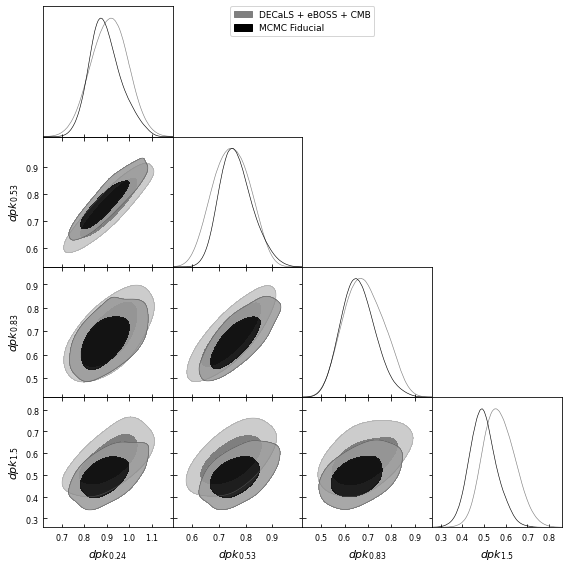

In [273]:
chains = [dec_bin_s2, dec_bin_s2_fid]
ckeys = ['dec_bin_s2', 'dec']
contour_colors = [color[c] for c in ckeys]
legend_labels = ['DECaLS + eBOSS + CMB', 'MCMC Fiducial']

g = plots.get_subplot_plotter()
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels)
g.finish_plot()

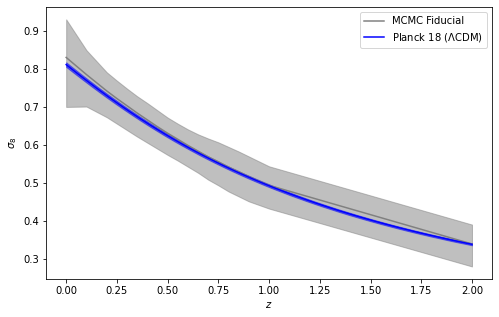

In [259]:
chains = [dec_bin_s2_fid]
clist = ['gray']
labels = ['MCMC Fiducial']

# for cl, label, chain in zip(ckeys, labels, chains):
#     sigma8z = []
#     for p in chain.paramNames.list():
#         if 'S8z' in p:
#             z = float(p.split('_')[-1])
# #             if z > 1:
# #                 break
#             InlineLatex = chain.getInlineLatex(p, limit=2)
# #             print(InlineLatex)
#             sigma8z.append(extract_info(InlineLatex))
#     sigma8z = np.array(sigma8z).T
#     plt.plot(sigma8z[0], sigma8z[1], label=label, color=color[cl])
#     plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5, color=color[cl])
# plt.title(r'$\Lambda$CDM')
# plt.xlabel('$z$')
# plt.ylabel('$S_8$')
# plt.title(r'Comparing splines')
# plt.legend()
# plt.show()


f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=cl)
    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = r'Planck 18 ($\Lambda$CDM)'
sigma8z = []
for p in chain.paramNames.list():
    if 'sigma8z_' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
plt.plot(p18_zarr, sigma8z[1], label=label, color=cl)
plt.fill_between(p18_zarr, sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                 alpha=.5, color=cl)

    
plt.xlabel('$z$')
plt.ylabel('$\sigma_8$')
plt.legend()
plt.show()

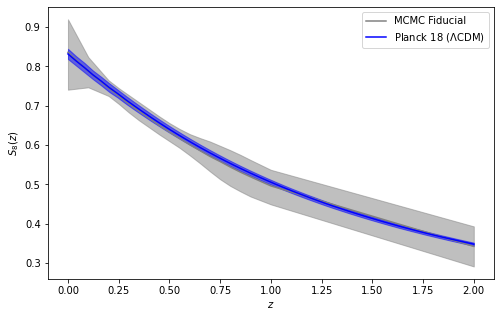

In [262]:
chains = [dec_bin_s2_fid]
clist = ['gray']
labels = ['MCMC Fiducial']


f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=cl)
    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = r'Planck 18 ($\Lambda$CDM)'
sigma8z = []
for p in chain.paramNames.list():
    if 'S8z_' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
plt.plot(p18_zarr, sigma8z[1], label=label, color=cl)
plt.fill_between(p18_zarr, sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                 alpha=.5, color=cl)

    
plt.xlabel('$z$')
plt.ylabel('$S_8(z)$')
plt.legend()
plt.show()

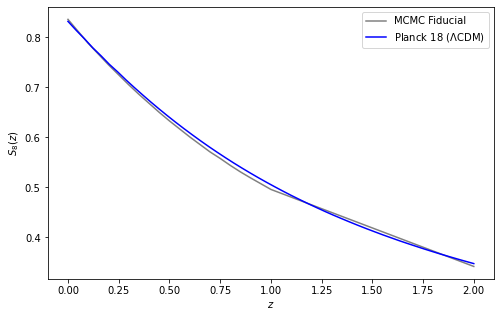

In [270]:
chains = [dec_bin_s2_fid]
clist = ['gray']
labels = ['MCMC Fiducial']


f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
#     plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
#                      alpha=.5, color=cl)
    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = 'blue'
label = r'Planck 18 ($\Lambda$CDM)'
sigma8z = []
for p in chain.paramNames.list():
    if 'S8z_' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
plt.plot(p18_zarr, sigma8z[1], label=label, color=cl)
# plt.fill_between(p18_zarr, sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
#                  alpha=.5, color=cl)

    
plt.xlabel('$z$')
plt.ylabel('$S_8(z)$')
plt.legend()
plt.show()

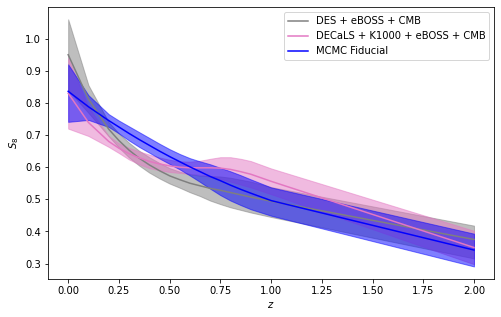

In [266]:
chains = [dec_bin_s2, Dkec_bin_s2, dec_bin_s2_fid]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2', 'dec_bin_s2_fid']
clist = [color['dec_bin_s2'], kcolor['Dkec_bin_s2'], 'blue']
labels = ['DES + eBOSS + CMB', 'DECaLS + K1000 + eBOSS + CMB', 'MCMC Fiducial']


f = plt.figure(figsize=(8, 5))

for cl, label, chain in zip(clist, labels, chains):
    sigma8z = []
    for p in chain.paramNames.list():
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                break
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plt.plot(sigma8z[0], sigma8z[1], label=label, color=cl)
    plt.fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3],
                     alpha=.5, color=cl)

    
plt.xlabel('$z$')
plt.ylabel('$S_8$')
plt.legend()
plt.show()

# $\chi^2$'s

In [81]:
from texttable import Texttable
import scipy.stats

names = ['ec', 'dc', 'dc2', 'de', 'dec', 'dec_tlr', 'dec_bin_s', 'dec_bin2', 'dec_bin_s2', 'd_bin_s2', 'dcovGNG_bin_s2']
chains = [ec, dc, dc2, de, dec, dec_tlr, dec_bin_s, dec_bin2, dec_bin_s2, d_bin_s2, dcovGNG_bin_s2]
di = [ec_di, dc_di, dc2_di,de_di, dec_di, dec_tlr_di, dec_bin_s_di, dec_bin2_di, dec_bin_s2_di, d_bin_s2_di, dcovGNG_bin_s2_di]
bfi = [ec_bfi, dc_bfi, dc2_bfi, de_bfi, dec_bfi, dec_tlr_bfi, dec_bin_s_bfi, dec_bin2_bfi, dec_bin_s2_bfi, d_bin_s2_bfi, dcovGNG_bin_s2_bfi]
#####
t = Texttable()
t.add_row(['', 'params', 'data points', 'chi2_wp', 'chi2', 'PTE', 'PTE (d-p)'])
for n, c, b, d in zip(names, chains, bfi, di):
    dof = d['ells'].size
    vp = dof - d['dof']
    chi2_c = 2 * c.loglikes.min()
    chi2 = b['chi2_nolp']
    pte = 1 - scipy.stats.chi2.cdf(chi2, dof)
    pte2 = 1 - scipy.stats.chi2.cdf(chi2, dof - vp)
    t.add_row([n, vp, dof, chi2_c, chi2, pte, pte2])
print(t.draw())

+---------------+--------+-------------+---------+---------+-------+-----------+
|               | params | data points | chi2_wp | chi2    | PTE   | PTE (d-p) |
+---------------+--------+-------------+---------+---------+-------+-----------+
| ec            | 7      | 52          | 41.666  | 41.666  | 0.847 | 0.614     |
+---------------+--------+-------------+---------+---------+-------+-----------+
| dc            | 25     | 613         | 633.986 | 622.607 | 0.385 | 0.156     |
+---------------+--------+-------------+---------+---------+-------+-----------+
| dc2           | 25     | 613         | 606.030 | 591.558 | 0.726 | 0.451     |
+---------------+--------+-------------+---------+---------+-------+-----------+
| de            | 27     | 501         | 531.002 | 521.910 | 0.251 | 0.063     |
+---------------+--------+-------------+---------+---------+-------+-----------+
| dec           | 27     | 665         | 675.870 | 669.894 | 0.440 | 0.185     |
+---------------+--------+--

In [280]:
from texttable import Texttable
import scipy.stats

names = ['kc', 'Dec', 'Dkec']
chains = [kc, Dec, Dkec]
di = [kc_di, Dec_di, Dkec_di]
bfi = [kc_bfi, Dec_bfi, Dkec_bfi]
#####
t = Texttable()
t.add_row(['', 'params', 'data points', 'chi2_wp', 'chi2', 'PTE', 'PTE (d-p)'])
for n, c, b, d in zip(names, chains, bfi, di):
    dof = d['ells'].size
    vp = dof - d['dof']
    chi2_c = 2 * c.loglikes.min()
    chi2 = b['chi2_nolp']
    pte = 1 - scipy.stats.chi2.cdf(chi2, dof)
    pte2 = 1 - scipy.stats.chi2.cdf(chi2, dof - vp)
    t.add_row([n, vp, dof, chi2_c, chi2, pte, pte2])
print(t.draw())

+------+--------+-------------+---------+---------+-------+-----------+
|      | params | data points | chi2_wp | chi2    | PTE   | PTE (d-p) |
+------+--------+-------------+---------+---------+-------+-----------+
| kc   | 17     | 440         | 461.938 | 459.855 | 0.248 | 0.105     |
+------+--------+-------------+---------+---------+-------+-----------+
| Dec  | 15     | 112         | 90.515  | 90.047  | 0.937 | 0.678     |
+------+--------+-------------+---------+---------+-------+-----------+
| Dkec | 27     | 662         | 689.516 | 684.583 | 0.264 | 0.085     |
+------+--------+-------------+---------+---------+-------+-----------+


## DES + eBOSS + CMB

### $C_\ell$'s

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(2, 2, figsize=(10, 6))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('eBOSS' not in tr1):
        continue
    ell, cl, cov = sG.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].errorbar(ell, -cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(5, 4, figsize=(15, 12))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('gc' not in tr1) or ('wl' not in tr2):
        continue
    ell, cl, cov = sG.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(15, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('gc' not in tr1) or ('gc' not in tr2):
        continue
    ell, cl, cov = sG.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(4, 4, figsize=(12, 12))
ax = axs
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('wl' not in tr1) or ('wl' not in tr2):
        continue
    ix = (int(tr1[-1]), int(tr2[-1]))
    ell, cl, cov = sG.get_ell_cl('cl_ee', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(15, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('gc' not in tr1) or ('cv' not in tr2):
        continue
    ell, cl, cov = sG.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 4, figsize=(12, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('wl' not in tr1) or ('cv' not in tr2):
        continue
    ell, cl, cov = sG.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

### $\chi^2$'s

In [97]:
info = dec_di
bf = dec_bfi
(info['cls'] - bf['cls']).dot(np.linalg.inv(info['cov'])).dot(info['cls'] - bf['cls'])

669.894233671598

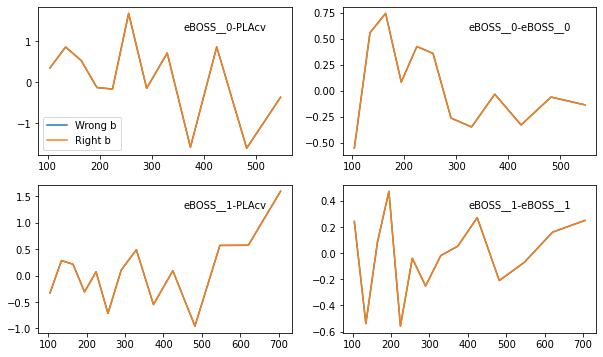

In [85]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(2, 2, figsize=(10, 6))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('eBOSS' not in tr1):
        continue
    ell_cl, cl, cov = sG.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[np.in1d(ell_cl, ell)]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err, label='Wrong b')
    # 
    ell_cl1, cl1, cov = sK.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl1 = cl1[np.in1d(ell_cl1, ell)]
    err = err[np.in1d(ell_cl1, ell)]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err, label='Right b')
#     ax[ix].plot(ells_bf_ar[i], (cl - cl1))

    #
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
ax[0].legend(loc='lower left')
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(5, 4, figsize=(15, 12))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('gc' not in tr1) or ('wl' not in tr2):
        continue
    ell_cl, cl, cov = sG.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(15, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('gc' not in tr1) or ('gc' not in tr2):
        continue
    ell_cl, cl, cov = sG.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(4, 4, figsize=(12, 12))
ax = axs
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('wl' not in tr1) or ('wl' not in tr2):
        continue
    ix = (int(tr1[-1]), int(tr2[-1]))
    ell_cl, cl, cov = sG.get_ell_cl('cl_ee', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(15, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('gc' not in tr1) or ('cv' not in tr2):
        continue
    ell_ell, cl, cov = sG.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = dec_di
bf = dec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 4, figsize=(12, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('wl' not in tr1) or ('cv' not in tr2):
        continue
    ell_cl, cl, cov = sG.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

## KiDS + CMB

In [ ]:
info = kc_di
bf = kc_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(5, 5, figsize=(15, 15))
ax = axs
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('KiDS' not in tr1) or ('KiDS' not in tr2):
        continue
    ix = (int(tr1[-1]), int(tr2[-1]))
    ell, cl, cov = sK.get_ell_cl('cl_ee', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].errorbar(ell, -cl, yerr=err, c=DCOLORS[2])
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
plt.show()
plt.close()
    

In [ ]:
info = kc_di
bf = kc_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(12, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
#     print(trs)
    if ('KiDS' not in tr1) or ('cv' not in tr2):
        continue
    ell, cl, cov = sK.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = kc_di
bf = kc_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(5, 5, figsize=(12, 12))
ax = axs
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('KiDS' not in tr1) or ('KiDS' not in tr2):
        continue
    ix = (int(tr1[-1]), int(tr2[-1]))
    ell_cl, cl, cov = sK.get_ell_cl('cl_ee', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
plt.show()
plt.close()
    

In [ ]:
info = kc_di
bf = kc_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(12, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('KiDS' not in tr1) or ('cv' not in tr2):
        continue
    ell_cl, cl, cov = sK.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

## DECALS + KiDS + eBOSS + CMB

### $C_\ell$'s

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 4, figsize=(12, 3))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('DECALS' not in tr1) or ('DECALS' not in tr2):
        continue
    print(trs)
    ell, cl, cov = sK.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(4, 5, figsize=(15, 12))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('DECALS' not in tr1) or ('KiDS' not in tr2):
        continue
    ell, cl, cov = sK.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].errorbar(ell, -cl, yerr=err, c=DCOLORS[2])
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(5, 5, figsize=(15, 15))
ax = axs
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('KiDS' not in tr1) or ('KiDS' not in tr2):
        continue
    ix = (int(tr1[-1]), int(tr2[-1]))
    ell, cl, cov = sK.get_ell_cl('cl_ee', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].errorbar(ell, -cl, yerr=err, c=DCOLORS[2])
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 4, figsize=(15, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('DECALS' not in tr1) or ('cv' not in tr2):
        continue
    ell, cl, cov = sK.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(12, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
#     print(trs)
    if ('KiDS' not in tr1) or ('cv' not in tr2):
        continue
    ell, cl, cov = sK.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 4, figsize=(12, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
#     print(trs)
    if ('DECALS' not in tr1) or ('cv' not in tr2):
        continue
    ell, cl, cov = sK.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ax[ix].errorbar(ell, cl, yerr=err)
    ax[ix].loglog(ells_bf_ar[i], cls_bf_ar[i])
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

### $\chi^2$'s

In [ ]:
info = Dkec_di
bf = Dkec_bfi
(info['cls'] - bf['cls']).dot(np.linalg.inv(info['cov'])).dot(info['cls'] - bf['cls'])

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 4, figsize=(12, 3))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('DECALS' not in tr1) or ('DECALS' not in tr2):
        continue
    ell_cl, cl, cov = sK.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(4, 5, figsize=(15, 12))
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('DECALS' not in tr1) or ('KiDS' not in tr2):
        continue
    ell_cl, cl, cov = sK.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(5, 5, figsize=(12, 12))
ax = axs
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('KiDS' not in tr1) or ('KiDS' not in tr2):
        continue
    ix = (int(tr1[-1]), int(tr2[-1]))
    ell_cl, cl, cov = sK.get_ell_cl('cl_ee', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 4, figsize=(15, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('DECALS' not in tr1) or ('cv' not in tr2):
        continue
    ell_ell, cl, cov = sK.get_ell_cl('cl_00', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

In [ ]:
info = Dkec_di
bf = Dkec_bfi

ells_bf_ar, cls_bf_ar = split_vector_array(info['ells'], bf['cls'])
f, axs = plt.subplots(1, 5, figsize=(12, 2.5), gridspec_kw={'wspace': 0}, sharey=True)
ax = axs.reshape((-1))
ix = 0
for i, trs in enumerate(info['tracers']):
    tr1, tr2 = trs
    if ('KiDS' not in tr1) or ('cv' not in tr2):
        continue
    ell_cl, cl, cov = sK.get_ell_cl('cl_0e', tr1, tr2, return_cov=True)
    err = np.sqrt(np.diag(cov))
    ell = ells_bf_ar[i]
    cl = cl[np.in1d(ell_cl, ell)]
    err = err[:ell.size]
    ax[ix].plot(ells_bf_ar[i], (cl - cls_bf_ar[i]) / err)
    ax[ix].text(0.9, 0.9, tr1+'-'+tr2, horizontalalignment='right', 
               verticalalignment='top', transform=ax[ix].transAxes)
    ix += 1
plt.show()
plt.close()
    

## Histogram $\chi$

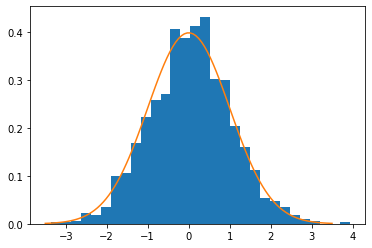

In [129]:
cls_data = np.concatenate([alld_di1['cls'], alld_di2['cls']])
cls_bf = np.concatenate([alld_bfi1['cls'], alld_bfi2['cls']])
err_data = np.concatenate([np.sqrt(np.diag(alld_di1['cov'])),
                           np.sqrt(np.diag(alld_di2['cov']))])

plt.hist((cls_data - cls_bf) / err_data, bins=30, density=True)
x = np.linspace(-3.5, 3.5, 100)
plt.plot(x, scipy.stats.norm.pdf(x, loc=0, scale=1))
plt.plot()
plt.show()
plt.close()

# Paper

In [6]:
pcolor = {'donly': DCOLORS[0],
          'd_bin_s2': DCOLORS[0],
          'dec': DCOLORS[1],
          'dec_bin_s2': DCOLORS[1], 
          'dwlc': DCOLORS[2],
          'dwlc_bin_s2': DCOLORS[2],
          'dgcec': DCOLORS[3],
          'dgcec_bin_s2': DCOLORS[3], 
          #
          'Dkec': DCOLORS[4],
          'Dkec_bin_s2': DCOLORS[4],
          'Dec': DCOLORS[5],
          'Dec_bin_s2': DCOLORS[5],
          'Dk': DCOLORS[6],
          'Dk_bin_s2': DCOLORS[6],
          'kc': DCOLORS[7],
          'kc_bin_s2': DCOLORS[7],
          #
          'alld': 'red',
          'alld_bin_s2': 'red',
          'alld_noSh': 'gray',
          'alld_noSh_bin_s2': 'gray',
          'alld_noCl': 'green',
          'alld_noCl_bin_s2': 'green',
          #
          'p18': 'blue',
          '3x2': 'black',
          'comp': 'black'
        }
pcolor['k3x2'] = pcolor['d3x2'] = pcolor['3x2']

plabels = {'dec': r'SD',
           'dgcec': r'SD no $\gamma$', # r'DES$g$ + eBOSS + CMB$\kappa$',
           'dwlc':  r'SD no $\delta_g$', # r'DES$\gamma$ + CMB$\kappa$',
           'donly': r'DES$g$ + DES$\gamma$',
           'Dk':  r'DELS + KiDS',
           'Dec': r'ND no $\gamma$', # r'DELS + eBOSS + CMB$\kappa$',
           'Dkec': r'ND',
           'kc': r'ND no $\delta_g$', #r'KiDS + CMB$\kappa$',
           'alld': r'FD',
           'alld_noCl': r'FD no $\delta_g$',
           'alld_noSh': r'FD no $\gamma$',
           'p18': 'Planck 18',
           'k3x2': 'KiDS-1000 3x2',
           'd3x2': 'DESY1 3x2'
    
}
plabels['d_bin_s2'] = plabels['donly']
plabels.update({k + '_bin_s2': v for k, v in plabels.items() if k not in ['p18', 'k3x2', 'd3x2', 'donly']})

## Paper plots

### N(z) & q(z)

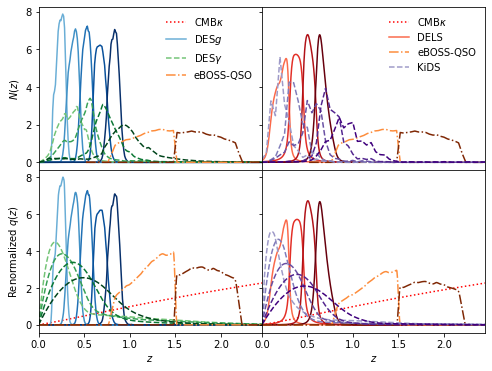

In [18]:
import pyccl as ccl

cosmo = ccl.CosmologyVanillaLCDM()
z = np.linspace(0, 2.5, 1000)
chi = ccl.comoving_radial_distance(cosmo, 1/(1+z))

cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 5)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 4)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

# Create a 2x 2 panel figure with A) kernels and B) N(z) for both N&S data sets
f, ax = plt.subplots(2, 2, figsize=(8, 6), gridspec_kw={'hspace':0, 'wspace': 0},
                    sharex=True, sharey='row')

#############################
####### South data set ######
#############################

# Create CCL Tracers
ccl_tracers = {}
for n, t in sG.tracers.items():
    t = sG.tracers[n]
    if 'DESgc' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = f'DES$g$'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)
    elif 'eBOSS' in n:
        factor = 2
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)        
    elif 'DESwl' in n:
        factor = 2
        cmap = cmap_wl
        ls = '--'
        label = r'DES$\gamma$'
        ccl_tracers[n] = ccl.WeakLensingTracer(cosmo, (t.z, t.nz))
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'
        ccl_tracers[n] = ccl.CMBLensingTracer(cosmo, z_source=1100)

    color = next(cmap)
    if 'CMB' in label:
        ax[0, 0].plot([0], [0], c=color, ls=ls, label=label if ('0' in n) or ('cv' in n) else '')
    else:
        ### N(z)
        c = np.sum(t.nz[:-1] * np.diff(t.z))
        nz = t.nz / c

        ax[0, 0].plot(t.z, nz, c=color, ls=ls, label=label if ('0' in n) or ('cv' in n) else '')
    
    # Kernel
    kernel = ccl_tracers[n].get_kernel(chi)
#     ax[1, 0].plot(z, kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls)
    ax[1, 0].plot(z, factor * kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls)
#     ax[1, 0].plot(z, kernel[0] / np.max(kernel[0]), c=color, ls=ls)
    
#############################
####### North data set ######
#############################

cmap_gc = iter(plt.cm.get_cmap('Reds')(np.linspace(0.5, 1, 4)))
cmap_wl = iter(plt.cm.get_cmap('Purples')(np.linspace(0.5, 1, 5)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))
    
ccl_tracers = {}
for n, t in sK.tracers.items():    
    t = sK.tracers[n]
    if 'DECALS' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = 'DELS'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)
    elif 'eBOSS' in n:
        factor = 1.5
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)        
    elif 'KiDS' in n:
        factor = 1.5
        cmap = cmap_wl
        ls = '--'
        label = 'KiDS'
        ccl_tracers[n] = ccl.WeakLensingTracer(cosmo, (t.z, t.nz))
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'
        ccl_tracers[n] = ccl.CMBLensingTracer(cosmo, z_source=1100)

    color = next(cmap)
    if 'CMB' in label:
        ax[0, 1].plot([0], [0], c=color, ls=ls, label=label if ('_0' in n) or ('cv' in n) else '')
    else:
        ### N(z)
        c = np.sum(t.nz[:-1] * np.diff(t.z))
        nz = t.nz / c

        ax[0, 1].plot(t.z, nz, c=color, ls=ls, label=label if ('_0' in n) or ('cv' in n) else '')
    
    # Kernel
    kernel = ccl_tracers[n].get_kernel(chi)
#     ax[1, 1].plot(z, kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls)
    ax[1, 1].plot(z, factor * kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls)
#     ax[1, 1].plot(z, kernel[0] / np.max(kernel[0]), c=color, ls=ls)

#### Finish plot ####    

ax[0, 0].legend(frameon=False)
ax[0, 1].legend(frameon=False)

ax[1, 0].set_xlim([0, 2.45])
ax[1, 1].set_xlim([0, 2.45])

ax[1, 0].set_xlabel('$z$')
ax[1, 1].set_xlabel('$z$')

ax[0, 0].set_ylabel('$N(z)$')
ax[1, 0].set_ylabel('Renormalized $q(z)$')
plt.savefig('./S8z_figures/Nz.pdf')
plt.show()
plt.close()

### Sky footprint

`python3 ../../S8z/notebooks/plot_footprint.py`

### Covariances entering the MCMC

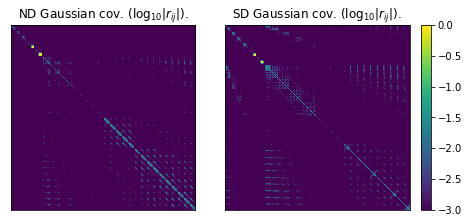

In [19]:
def get_r(cv):
    cv_d = np.diag(cv)
    return cv / np.sqrt(cv_d[:, None] * cv_d[None, :])


from matplotlib.colors import LogNorm
current_cmap = plt.cm.get_cmap()
current_cmap.set_bad(color='gray')

f, axs = plt.subplots(1, 2, figsize=(7, 3.2), gridspec_kw={'wspace': 0})

axs[0].set_title(r'ND Gaussian cov. ($\log_{10}|r_{ij}|$).')
axs[0].imshow(np.log10(np.fabs(get_r(Dkec_di['cov'] + 1e-100))), vmin=-3, vmax=0)
axs[0].set_yticks([])
axs[0].set_xticks([])

#
axs[1].set_title(r'SD Gaussian cov. ($\log_{10}|r_{ij}|$).')
im = axs[1].imshow(np.log10(np.fabs(get_r(dec_di['cov'] + 1e-100))), vmin=-3, vmax=0)
axs[1].set_yticks([])
axs[1].set_xticks([])
f.colorbar(im)
plt.tight_layout()
plt.savefig('./S8z_figures/ND_SD_covG_corr.pdf')
plt.show()
plt.close()

### $S_8$ - $\Omega_m$

We are interested on showing 4 different plots. The first two will show that we recover compatible results with the collaborations which, in the case of the south probes, they stand for:
   - DESgc + DESwl
   - DESY1 3x2
and in the case of the north probes:
   - K1000 + DECaLS
   - K1000 3x2 (2007.15632)
   
The third plot would be a result summary with:
   - DES + eBOSS + CMBk
   - DECaLS + K1000 + eBOSS + CMBk
   - All together
   - Planck 18
toether with the last plot would be:
   - FD - Clustering
   - FD - Shear
   - All together
   - Planck 18

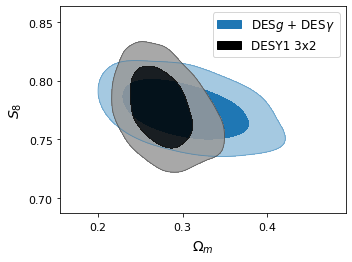

In [20]:
#  DESwl + CMBk
#  DESgc + eBOSS + CMBk
#  DES + eBOSS + CMBk
#  DES

chains = [donly, d_oficial]
ckeys = ['donly', 'd3x2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

######
g = plots.get_single_plotter(width_inch=5)
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper right')
g.finish_plot()
plt.savefig('./S8z_figures/SD_lcdm_s8.pdf')
plt.show()
plt.close()

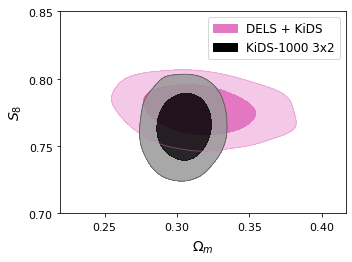

In [21]:
#   K1000 + CMBk
#   DECaLS + eBOSS + CMBk
#   DECaLS + K1000 + eBOSS + CMBk
#   DECaLS + K1000


chains = [Dk, k3x2_oficial]
ckeys = ['Dk', 'k3x2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

######
g = plots.get_single_plotter(width_inch=5)
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper right')
plt.ylim([0.7, 0.85])
g.finish_plot()
plt.savefig('./S8z_figures/ND_lcdm_s8.pdf')
plt.show()
plt.close()

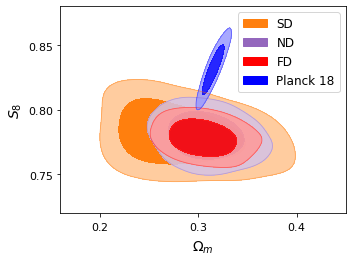

In [22]:
#  DES + eBOSS + CMBk
#  DECaLS + K1000 + eBOSS + CMBk
#  All together
#  Planck 18


chains = [dec, Dkec, alld, p18]
ckeys = ['dec', 'Dkec', 'alld',  'p18']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

######
g = plots.get_single_plotter(width_inch=5)
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper right')
plt.xlim([None, 0.45])
g.finish_plot()
plt.savefig('./S8z_figures/FD_lcdm_s8.pdf')
plt.show()
plt.close()

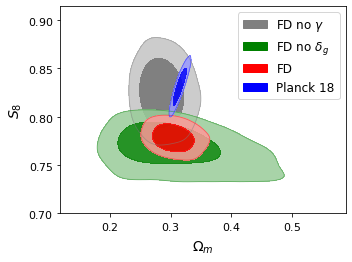

In [23]:
#  DES + eBOSS + CMBk
#  DECaLS + K1000 + eBOSS + CMBk
#  All together
#  Planck 18


chains = [alld_noSh, alld_noCl,alld, p18]
ckeys = ['alld_noSh', 'alld_noCl', 'alld',  'p18']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

######
g = plots.get_single_plotter(width_inch=5)
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper right')
plt.ylim([0.7, None])
g.finish_plot()
plt.savefig('./S8z_figures/FD_lcdm_s8_2.pdf')
plt.show()
plt.close()

### $S_8(z) = \sigma_8(z) \sqrt{\frac{\Omega_m(z=0)}{0.3}}$ 

We are interested on showing 3 different plots. The first two with the following combinations:
   - wl + CMBk
   - gc + eBOSS + CMBk
   - all
   - all w/o eBOSS + CMBk
   
which, in the case of the south probes, they stand for:
   - DESwl + CMBk
   - DESgc + eBOSS + CMBk
   - DES + eBOSS + CMBk
   - DES
   
In the case of the north probes:
   - K1000 + CMBk
   - DECaLS + eBOSS + CMBk
   - DECaLS + K1000 + eBOSS + CMBk
   - DECaLS + K1000
   
The third plot would be a result summary with:
   - DES + eBOSS + CMBk
   - DECaLS + K1000 + eBOSS + CMBk
   - All together
   - Planck 18

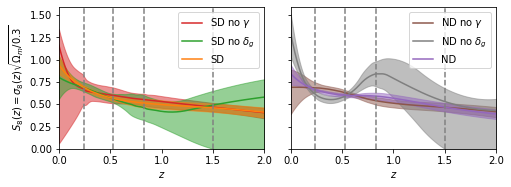

In [24]:
#  DESwl + CMBk
#  DESgc + eBOSS + CMBk
#  DES + eBOSS + CMBk
#  DES

chains = [dgcec_bin_s2, dwlc_bin_s2, dec_bin_s2]
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

f, axs = plt.subplots(1, 2, figsize=(7.2, 2.7), sharey=True) #, gridspec_kw={'wspace': 0.1})

########### S8(z) #############
for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(axs[0], sigma8z, label, cl)

########### Panel ND #######################

chains = [Dec_bin_s2, kc_bin_s2, Dkec_bin_s2]
ckeys = ['Dec_bin_s2', 'kc_bin_s2', 'Dkec_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]


for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(axs[1], sigma8z, label, cl)

    
for i in range(2):
    for zi in [0.24, 0.53, 0.83, 1.5]: 
            axs[i].axvline(zi, ls='--', color='gray')
    axs[i].set_xlabel('$z$')
    axs[i].legend()
    axs[i].set_xlim([0, 2.0])
# axs[1].set_xticks(ax)
# axs[1].set_xlim([-0.03, 2])
##############################################
axs[0].set_ylim([0, None])
axs[0].set_ylabel('$S_8(z) = \sigma_8(z) \sqrt{\Omega_m / 0.3}$')
plt.tight_layout()
plt.savefig('./S8z_figures/ND_SD_s8z.pdf')
plt.show()
plt.close()

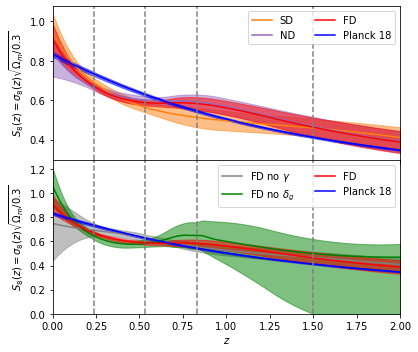

In [25]:
#  DES + eBOSS + CMBk
#  DECaLS + K1000 + eBOSS + CMBk
#  All together
#  Planck 18

chains = [dec_bin_s2, Dkec_bin_s2, alld_bin_s2]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2', 'alld_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

f, axs = plt.subplots(2, 1, figsize=(6, 5), sharex=True, gridspec_kw={'hspace': 0.00})

for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(axs[0], sigma8z, label, cl)

    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = pcolor['p18']
label = plabels['p18']
sigma8z = []
for p in chain.paramNames.list():
    if 'S8z' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
sigma8z[0, :] = p18_zarr
plot_interp1d_S8z(axs[0], sigma8z, label, cl)


####################### FD 2 ###########################

chains = [alld_noSh_bin_s2, alld_noCl_bin_s2, alld_bin_s2]
ckeys = ['alld_noSh_bin_s2', 'alld_noCl_bin_s2', 'alld_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(axs[1], sigma8z, label, cl)
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = pcolor['p18']
label = plabels['p18']
sigma8z = []
for p in chain.paramNames.list():
    if 'S8z' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
sigma8z[0, :] = p18_zarr
plot_interp1d_S8z(axs[1], sigma8z, label, cl)

#########################


for i in range(2):
    for zi in [0.24, 0.53, 0.83, 1.5]: 
            axs[i].axvline(zi, ls='--', color='gray')    
    axs[i].set_ylabel('$S_8(z) = \sigma_8(z) \sqrt{\Omega_m / 0.3}$')
    axs[i].legend(ncol=2)
# axs[0].set_ylim([0.2, None])
axs[1].set_ylim([0, None])
axs[1].set_xlim([0, 2])
axs[1].set_xlabel('$z$')
plt.tight_layout()
plt.savefig('./S8z_figures/FD_s8z.pdf')
plt.show()
plt.close()

### $\tilde{D}(z_i)$

We are interested on showing the complemetarity between clustering and weak lensing. We need only one plot. In the case of the South probes we need the following cases
   - DESwl + CMBk
   - DESgc + eBOSS + CMBk
   - DES + eBOSS + CMBk
   - DES

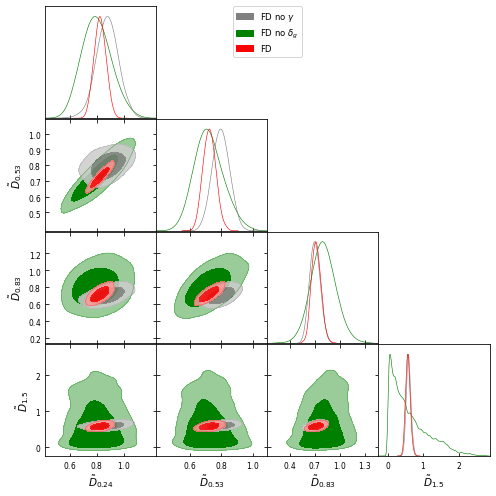

In [13]:
#####
### For the refereed version
#####

#  DESwl + CMBk
#  DESgc + eBOSS + CMBk
#  DES + eBOSS + CMBk
#  DES
chains = [alld_noCl_bin_s2, alld_noSh_bin_s2, alld_bin_s2]
ckeys = ['alld_noCl_bin_s2', 'alld_noSh_bin_s2', 'alld_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

######
g = plots.get_subplot_plotter(width_inch=7)
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels,
                label_order=[1, 0, 2],
                )
g.finish_plot()
plt.savefig('./S8z_figures/FD_dpk.pdf')
plt.show()
plt.close()

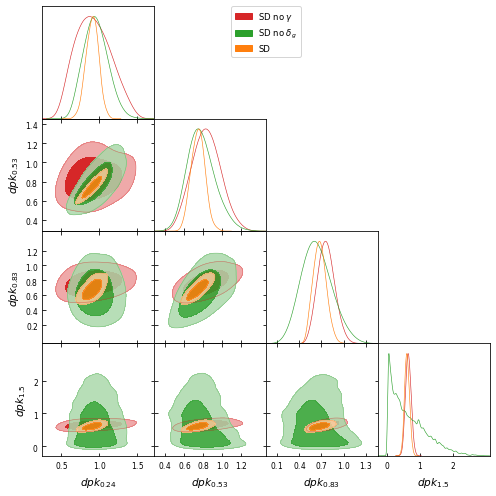

In [26]:
#  DESwl + CMBk
#  DESgc + eBOSS + CMBk
#  DES + eBOSS + CMBk
#  DES
dgcec_bin_s2.parLabel
chains = [dgcec_bin_s2, dwlc_bin_s2, dec_bin_s2]
ckeys = ['dgcec_bin_s2', 'dwlc_bin_s2', 'dec_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

######
g = plots.get_subplot_plotter(width_inch=7)
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels,
                )
g.finish_plot()
plt.savefig('./S8z_figures/SD_dpk.pdf')
plt.show()
plt.close()

Correlation matrix
No shear
[[1.         0.19409329 0.23838689 0.27872832]
 [0.19409329 1.         0.51673534 0.42834906]
 [0.23838689 0.51673534 1.         0.50657071]
 [0.27872832 0.42834906 0.50657071 1.        ]]
No cl
[[ 1.          0.69856046  0.00807732  0.03869567]
 [ 0.69856046  1.          0.57717633 -0.16399824]
 [ 0.00807732  0.57717633  1.         -0.01149069]
 [ 0.03869567 -0.16399824 -0.01149069  1.        ]]


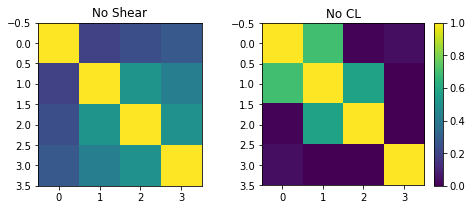

In [27]:
print('Correlation matrix')
print('No shear')
corr_dgcec = dgcec_bin_s2.corr(['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'])
print(corr_dgcec)
print('No cl')
corr_dwlc = dwlc_bin_s2.corr(['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'])
print(corr_dwlc)
f, axs = plt.subplots(1, 2, figsize=(8, 3))
axs[0].imshow(corr_dgcec, vmin=0, vmax=1)
im = axs[1].imshow(corr_dwlc, vmin=0, vmax=1)
axs[0].set_title('No Shear')
axs[1].set_title('No CL')
f.colorbar(im)
plt.show()
plt.close()

### Quadratic vs Linear splines (DES + eBOSS + CMB)

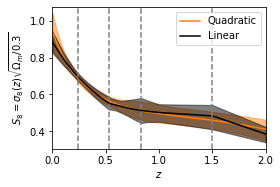

In [28]:
f = plt.figure(figsize=(4, 2.7))

for cl, label, chain in zip(['dec_bin_s2', 'comp'],
                            ['Quadratic', 'Linear'],
                            [dec_bin_s2, dec_bin_s2l]):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(plt, sigma8z, label, pcolor[cl], kind=label.lower())
        
for zi in [0.24, 0.53, 0.83, 1.5]: 
    plt.axvline(zi, ls='--', color='gray')  
    
plt.xlabel('$z$')
plt.ylabel('$S_8 = \sigma_8(z) \sqrt{\Omega_m / 0.3}$')
# plt.title(r'Comparing splines')
plt.xlim([0, 2])
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig('./S8z_figures/SD_splines.pdf')
plt.show()
plt.close()

### covG vs covG+covNG (DES only)

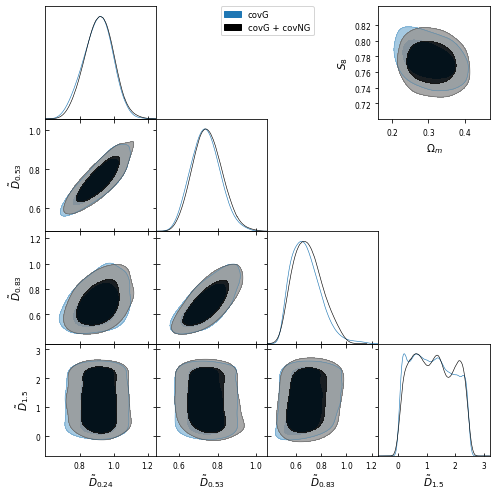

In [29]:
# There's something weird going on with the LCDM DES + CMB covG vs covGNG contours.
# Maybe I should have rerun the v3 again. However, we have checked this several times
# and this contour plot should reflect the truth, although you can see some discrepancies 
# in the other plots below. I think this plot matches because it was run with the same covmat
# while the others have the updated one (there was sth slightly wrong in the old one
# that changed things just a little bit - probably the bit that we see here)
# In any case, the important plot is the one with the nodes, not that of LCDM. The errors 
# from the systematics will be larger than the worst scenario we see here.

chains = [d_bin_s2, dcovGNG_bin_s2]
ckeys = ['d_bin_s2', 'comp']
contour_colors = [pcolor[c] for c in ckeys]
# legend_labels = [plabels[ckeys[0]]] * 2
legend_labels = ['covG', 'covG + covNG']

######
g = plots.get_subplot_plotter(width_inch=7)
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels,
                )
# g.plot_2d(chains, 'Omega_m', 'S_8', colors=contour_colors, filled=True, ax=g.get_axes((0, 3)))
g.plot_2d([dc, dc2], 'Omega_m', 'S_8', colors=contour_colors, filled=True, ax=g.get_axes((0, 3)))
# No finish_plot because it breaks the figure configuration
# g.finish_plot()
plt.savefig('./S8z_figures/SD_covG_covGNG.pdf')
plt.show()
plt.close()

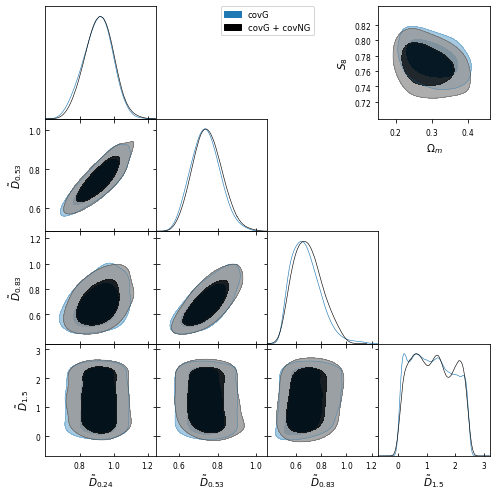

In [30]:
chains = [d_bin_s2, dcovGNG_bin_s2]
ckeys = ['d_bin_s2', 'comp']
contour_colors = [pcolor[c] for c in ckeys]
# legend_labels = [plabels[ckeys[0]]] * 2
legend_labels = ['covG', 'covG + covNG']

######
g = plots.get_subplot_plotter(width_inch=7)
g.triangle_plot(chains, ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5'],
                filled=True, 
                contour_colors=contour_colors,
                legend_labels=legend_labels,
                )
# g.plot_2d(chains, 'Omega_m', 'S_8', colors=contour_colors, filled=True, ax=g.get_axes((0, 3)))
g.plot_2d([dc, dc_covGNG], 'Omega_m', 'S_8', colors=contour_colors, filled=True,
          ax=g.get_axes((0, 3)), alphas=[1, 0.8])
# No finish_plot because it breaks the figure configuration
# g.finish_plot()
# plt.savefig('./S8z_figures/SD_covG_covGNG.pdf')
plt.show()
plt.close()

covGNG S_{8 } = 0.768\pm 0.019 \Omega_{m } = 0.288^{+0.037}_{-0.057}
covG S_{8 } = 0.776\pm 0.017 \Omega_{m } = 0.300^{+0.040}_{-0.053}


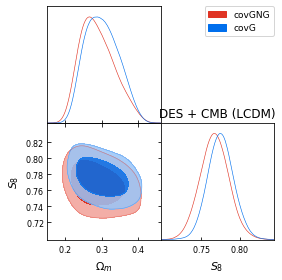

In [32]:
print('covGNG', dc_covGNG.getInlineLatex('S_8'), dc_covGNG.getInlineLatex('Omega_m'))
print('covG', dc.getInlineLatex('S_8'), dc.getInlineLatex('Omega_m'))
# print(dc2.getInlineLatex('S_8'), dc2.getInlineLatex('Omega_m'))

g = plots.getSubplotPlotter()
g.triangle_plot([dc_covGNG, dc], ['Omega_m', 'S_8'], 
                legend_labels=['covGNG', 'covG'], filled=True)
g.get_axes((1,1)).set_title('DES + CMB (LCDM)')
plt.show()
plt.close()

covGNG S_{8 } = 0.768\pm 0.019 \Omega_{m } = 0.288^{+0.037}_{-0.057}
covG S_{8 } = 0.776\pm 0.017 \Omega_{m } = 0.300^{+0.040}_{-0.053}


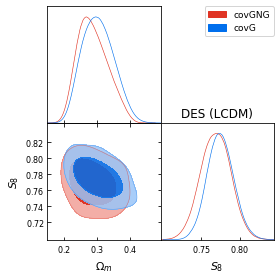

In [45]:
print('covGNG', dc_covGNG.getInlineLatex('S_8'), dc_covGNG.getInlineLatex('Omega_m'))
print('covG', dc.getInlineLatex('S_8'), dc.getInlineLatex('Omega_m'))
# print(dc2.getInlineLatex('S_8'), dc2.getInlineLatex('Omega_m'))

g = plots.getSubplotPlotter()
g.triangle_plot([donly_covGNG, donly], ['Omega_m', 'S_8'], 
                legend_labels=['covGNG', 'covG'], filled=True)
g.get_axes((1,1)).set_title('DES (LCDM)')
plt.show()
plt.close()

In [2]:
donly = getdist.loadMCSamples('./cl_cross_corr_v3_DES_2/2021-05-28_10000000_',
                                         settings={'ignore_rows':0.1})
donly2 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_3/2021-06-18_10000000_',
                                         settings={'ignore_rows':0.1})

g = plots.getSubplotPlotter()
g.triangle_plot([donly, donly2], ['Omega_m', 'S_8'], 
                legend_labels=['covGNG', 'covG'], filled=True)
g.get_axes((1,1)).set_title('DES (LCDM)')
plt.show()
plt.close()

./cl_cross_corr_v3_DES_3/2021-06-18_10000000__4.txt
Error reading ./cl_cross_corr_v3_DES_3/2021-06-18_10000000__4.txt


EmptyDataError: No columns to parse from file

### Histogram residuals

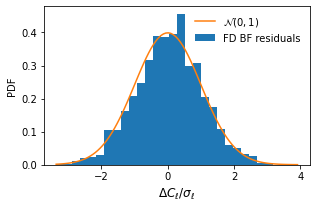

KstestResult(statistic=0.03933443479540233, pvalue=0.03766152459212413)


In [33]:
cls_data = np.concatenate([alld_di1['cls'], alld_di2['cls']])
cls_bf = np.concatenate([alld_bfi1['cls'], alld_bfi2['cls']])
err_data = np.concatenate([np.sqrt(np.diag(alld_di1['cov'])),
                           np.sqrt(np.diag(alld_di2['cov']))])

f = plt.figure(figsize=(4.5, 3))

h, b, _ = plt.hist((cls_data - cls_bf) / err_data, bins=30, density=True, label='FD BF residuals')
x = np.linspace(b[0], b[-1], 100)
plt.plot(x, scipy.stats.norm.pdf(x, loc=0, scale=1), label=r'$\mathcal{N}(0, 1)$')
plt.xlabel(r'$\Delta C_\ell / \sigma_\ell$', fontsize='12')
plt.ylabel('PDF')
plt.legend(loc='upper right', frameon=False)
plt.tight_layout()
plt.savefig('./S8z_figures/FD_res_histogram.pdf')
plt.show()
plt.close()

from scipy.stats import kstest
print(kstest((cls_data - cls_bf) / err_data, 'norm'))

### $\Lambda$CDM results

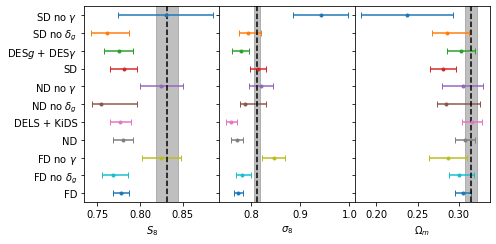

In [34]:
names = ['dgcec', 'dwlc', 'donly', 'dec',
         'Dec', 'kc', 'Dk', 'Dkec',
         'FD Cl', 'FD Sh', 'FD']
chains = [dgcec, dwlc, donly, dec,
          Dec, kc, Dk, Dkec,
          alld_noSh, alld_noCl, alld]
ckeys = ['dgcec', 'dwlc', 'donly', 'dec',
          'Dec', 'kc', 'Dk', 'Dkec',
          'alld_noSh', 'alld_noCl', 'alld']
labels = [plabels[c] for c in ckeys]

limit = 1

f, axs = plt.subplots(1, 3, figsize=(7, 3.5), sharey=True, gridspec_kw={'wspace': 0.0})

#####

for i, c in enumerate(chains):
    color = pcolor[ckeys[i]]
    Omega_m = extract_info(c.getInlineLatex('Omega_m', limit), return_z=False)
    sigma_8 = extract_info(c.getInlineLatex('sigma_8', limit), return_z=False)
    S_8 = extract_info(c.getInlineLatex('S_8', limit), return_z=False)
    #
    axs[0].errorbar(S_8[0], -i, xerr=[[S_8[2]], [S_8[1]]], fmt='.', capsize=3)
    axs[1].errorbar(sigma_8[0], -i, xerr=[[S_8[2]], [S_8[1]]], fmt='.', capsize=3)
    axs[2].errorbar(Omega_m[0], -i, xerr=[[S_8[2]], [S_8[1]]], fmt='.', capsize=3)

axs[0].set_xlabel('$S_8$')
axs[1].set_xlabel('$\sigma_8$')
axs[2].set_xlabel('$\Omega_m$')
axs[0].set_yticks(-np.arange(len(labels)))
axs[0].set_yticklabels(labels)

c = p18
Omega_m = extract_info(c.getInlineLatex('Omega_m', limit), return_z=False)
sigma_8 = extract_info(c.getInlineLatex('sigma_8', limit), return_z=False)
S_8 = extract_info(c.getInlineLatex('S_8', limit), return_z=False)
axs[0].axvspan(S_8[0]-S_8[2], S_8[0] + S_8[1], color='gray', alpha=0.5)
axs[1].axvspan(sigma_8[0] - sigma_8[2], sigma_8[0] + sigma_8[1], color='gray', alpha=0.5)
axs[2].axvspan(Omega_m[0] - Omega_m[2], Omega_m[0] + Omega_m[1], color='gray', alpha=0.5)

axs[0].axvline(S_8[0], color='black', ls='--')
axs[1].axvline(sigma_8[0], color='black', ls='--')
axs[2].axvline(Omega_m[0], color='black', ls='--')

plt.tight_layout()
plt.savefig('./S8z_figures/lcdm_results.pdf')
plt.show()
plt.close()

## Paper tables

### $\Lambda$CDM $\chi^2$ and results

In [46]:
from texttable import Texttable
import scipy.stats

names = ['dgcec', 'dwlc', 'donly', 'dec',
         'Dec', 'kc', 'Dk', 'Dkec',
         'FD no Sh', 'FD no Cl', 'FD']
chains = [dgcec, dwlc, donly, dec,
          Dec, kc, Dk, Dkec,
          alld_noSh, alld_noCl, alld]
di = [dgcec_di, dwlc_di, donly_di, dec_di,
      Dec_di, kc_di, Dk_di, Dkec_di,
      alld_noSh_di1, alld_noCl_di1, alld_di1]
bfi = [dgcec_bfi, dwlc_bfi, donly_bfi, dec_bfi,
       Dec_bfi, kc_bfi, Dk_bfi, Dkec_bfi,
       alld_noSh_bfi1, alld_noCl_bfi1, alld_bfi1]
nb = [7, 0, 5, 7,
      6, 0, 4, 6,
      11, 0, 11]

limit = 1

#####
t = Texttable()
t.add_row(['', 'dp', 'chi2', 'PTE', 'S_8', 'sigma_8', 'Omega_m'])
for n, c, b, d, nbi in zip(names, chains, bfi, di, nb):
    dp = d['ells'].size
    chi2 = b['chi2_nolp']
    if n == 'FD':
        dp += alld_di2['ells'].size
        chi2 += alld_bfi2['chi2_nolp']
    elif n == 'FD no Cl':
        dp += alld_noCl_di2['ells'].size
        chi2 += alld_noCl_bfi2['chi2_nolp']
    elif n == 'FD no Sh':
        dp += alld_noSh_di2['ells'].size
        chi2 += alld_noSh_bfi2['chi2_nolp'] 
#     elif n == 'donly':
#         chi2 = np.load('./cl_cross_corr_v3_DES/cl_cross_corr_bestfit_info.npz')['chi2_nolp']
    dof = dp - nbi - 2
    pte = 1 - scipy.stats.chi2.cdf(chi2, dof)
    #
    Omega_m = '${}$'.format(c.getInlineLatex('Omega_m', limit).split('=')[1])
    sigma_8 = '${}$'.format(c.getInlineLatex('sigma_8', limit).split('=')[1])
    S_8 = '${}$'.format(c.getInlineLatex('S_8', limit).split('=')[1])
    #
    t.add_row([n, dp, round(float(chi2)), round(100*pte), S_8, sigma_8, Omega_m])

c = p18
Omega_m = '${}$'.format(c.getInlineLatex('Omega_m', limit).split('=')[1])
sigma_8 = '${}$'.format(c.getInlineLatex('sigma_8', limit).split('=')[1])
S_8 = '${}$'.format(c.getInlineLatex('S_8', limit).split('=')[1])
t.add_row(['Planck', '-', '-', '-', S_8, sigma_8, Omega_m])
print(t.draw())

+----------+------+------+-----+---------------+---------------+---------------+
|          | dp   | chi2 | PTE | S_8           | sigma_8       | Omega_m       |
+----------+------+------+-----+---------------+---------------+---------------+
| dgcec    | 141  | 111  | 90  | $ 0.830\pm    | $ 0.942\pm    | $ 0.237^{+0.0 |
|          |      |      |     | 0.056$        | 0.092$        | 19}_{-0.040}$ |
+----------+------+------+-----+---------------+---------------+---------------+
| dwlc     | 336  | 347  | 30  | $ 0.761^{+0.0 | $ 0.794\pm    | $ 0.286^{+0.0 |
|          |      |      |     | 26}_{-0.019}$ | 0.091$        | 42}_{-0.077}$ |
+----------+------+------+-----+---------------+---------------+---------------+
| donly    | 475  | 496  | 18  | $ 0.775\pm    | $ 0.779^{+0.0 | $ 0.303^{+0.0 |
|          |      |      |     | 0.017$        | 63}_{-0.080}$ | 44}_{-0.053}$ |
+----------+------+------+-----+---------------+---------------+---------------+
| dec      | 665  | 660  | 4

In [47]:
print(latextable.draw_latex(t))

\begin{table}
	\begin{center}
		\begin{tabular}{|l|l|l|l|l|l|l|}
			\hline
			 \\
			\hline
			 & dp & chi2 & PTE & S_8 & sigma_8 & Omega_m \\
			\hline
			dgcec & 141 & 111 & 90 & $ 0.830\pm 0.056$ & $ 0.942\pm 0.092$ & $ 0.237^{+0.019}_{-0.040}$ \\
			\hline
			dwlc & 336 & 347 & 30 & $ 0.761^{+0.026}_{-0.019}$ & $ 0.794\pm 0.091$ & $ 0.286^{+0.042}_{-0.077}$ \\
			\hline
			donly & 475 & 496 & 18 & $ 0.775\pm 0.017$ & $ 0.779^{+0.063}_{-0.080}$ & $ 0.303^{+0.044}_{-0.053}$ \\
			\hline
			dec & 665 & 660 & 45 & $ 0.781\pm 0.016$ & $ 0.814^{+0.074}_{-0.065}$ & $ 0.281^{+0.029}_{-0.054}$ \\
			\hline
			Dec & 112 & 91 & 81 & $ 0.825\pm 0.025$ & $ 0.820\pm 0.044$ & $ 0.305^{+0.023}_{-0.028}$ \\
			\hline
			kc & 440 & 460 & 23 & $ 0.754^{+0.042}_{-0.010}$ & $ 0.788^{+0.095}_{-0.078}$ & $ 0.284^{+0.046}_{-0.079}$ \\
			\hline
			Dk & 610 & 649 & 10 & $ 0.777\pm 0.012$ & $ 0.760\pm 0.035$ & $ 0.316^{+0.023}_{-0.027}$ \\
			\hline
			Dkec & 662 & 688 & 18 & $ 0.780\pm 0.012$ & $ 0.772\pm 

### Binning $\chi^2$ and results

In [48]:
from texttable import Texttable
import scipy.stats

names = ['dgcec_bin_s2', 'dwlc_bin_s2', 'd_bin_s2', 'dec_bin_s2',
         'Dec_bin_s2', 'kc_bin_s2', 'Dk_bin_s2', 'Dkec_bin_s2', 
         'FD no Sh bin_s2', 'FD no Cl bin_s2', 'FD_bin_s2']
bfi_bin = [dgcec_bin_s2_bfi, dwlc_bin_s2_bfi, d_bin_s2_bfi, dec_bin_s2_bfi,
          Dec_bin_s2_bfi, kc_bin_s2_bfi, Dk_bin_s2_bfi, Dkec_bin_s2_bfi,
          alld_noSh_bin_s2_bfi1, alld_noCl_bin_s2_bfi1, alld_bin_s2_bfi1]
bfi = [dgcec_bfi, dwlc_bfi, donly_bfi, dec_bfi,
       Dec_bfi, kc_bfi, Dk_bfi, Dkec_bfi,
       alld_noSh_bfi1, alld_noCl_bfi1, alld_bfi1]
chains = [dgcec_bin_s2, dwlc_bin_s2, d_bin_s2, dec_bin_s2,
          Dec_bin_s2, kc_bin_s2, Dk_bin_s2, Dkec_bin_s2,
          alld_noSh_bin_s2, alld_noCl_bin_s2, alld_bin_s2]

limit = 1
#####
t = Texttable()
# t.set_max_width(0)
pars = ['dpk_0.24', 'dpk_0.53', 'dpk_0.83', 'dpk_1.5']
t.add_row(['', '\Delta chi2'] + pars)
for n, b, b_bin, c in zip(names, bfi, bfi_bin, chains):
    chi2 = b['chi2_nolp']
    chi2_bin = b_bin['chi2_nolp']
    if n == 'FD_bin_s2':
        chi2 += alld_bfi2['chi2_nolp']
        chi2_bin += alld_bin_s2_bfi2['chi2_nolp']
    elif n == 'FD no Cl bin_s2':
        chi2 += alld_noCl_bfi2['chi2_nolp']
        chi2_bin += alld_noCl_bin_s2_bfi2['chi2_nolp']
    elif n == 'FD no Sh bin_s2':
        chi2 += alld_noSh_bfi2['chi2_nolp'] 
        chi2_bin += alld_noSh_bin_s2_bfi2['chi2_nolp']
    row = [n, round(float(chi2_bin - chi2))]
    for pn in pars:
        row.append('${}$'.format(c.getInlineLatex(pn, limit).split('=')[1]))
    t.add_row(row)
    
#### Add planck
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = pcolor['p18']
label = plabels['p18']
Dz = [[1, 0, 0]]
for p in chain.paramNames.list():
    if 'Dz' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        Dz.append(extract_info(InlineLatex, return_z=False))
Dz = np.array(Dz).T
Dz_interp = interp1d(p18_zarr, Dz)    

row = ['p18', '-']
mean, plus, minus = Dz_interp([0.24, 0.53, 0.83, 1.5])
for i in range(4):
    # plus == minus
    row.append('${:.4} \pm {:.3}$'.format(mean[i], plus[i]))
t.add_row(row)
print(t.draw())

+-------------+------------+------------+------------+------------+------------+
|             | \Delta     | dpk_0.24   | dpk_0.53   | dpk_0.83   | dpk_1.5    |
|             | chi2       |            |            |            |            |
+-------------+------------+------------+------------+------------+------------+
| dgcec_bin_s | 1          | $ 0.92^{+0 | $ 0.83\pm  | $ 0.76^{+0 | $ 0.646\pm |
| 2           |            | .21}_{-0.2 | 0.15$      | .11}_{-0.1 | 0.085$     |
|             |            | 7}$        |            | 2}$        |            |
+-------------+------------+------------+------------+------------+------------+
| dwlc_bin_s2 | -2         | $ 0.96^{+0 | $ 0.78^{+0 | $ 0.64^{+0 | $ 0.66^{+0 |
|             |            | .15}_{-0.1 | .12}_{-0.1 | .19}_{-0.2 | .31}_{-0.6 |
|             |            | 8}$        | 7}$        | 3}$        | 6}$        |
+-------------+------------+------------+------------+------------+------------+
| d_bin_s2    | -2         |

In [49]:
print(latextable.draw_latex(t))

\begin{table}
	\begin{center}
		\begin{tabular}{|l|l|l|l|l|l|}
			\hline
			 \\
			\hline
			 & \Delta chi2 & dpk_0.24 & dpk_0.53 & dpk_0.83 & dpk_1.5 \\
			\hline
			dgcec_bin_s2 & 1 & $ 0.92^{+0.21}_{-0.27}$ & $ 0.83\pm 0.15$ & $ 0.76^{+0.11}_{-0.12}$ & $ 0.646\pm 0.085$ \\
			\hline
			dwlc_bin_s2 & -2 & $ 0.96^{+0.15}_{-0.18}$ & $ 0.78^{+0.12}_{-0.17}$ & $ 0.64^{+0.19}_{-0.23}$ & $ 0.66^{+0.31}_{-0.66}$ \\
			\hline
			d_bin_s2 & -2 & $ 0.907^{+0.093}_{-0.081}$ & $ 0.737^{+0.072}_{-0.080}$ & $ 0.678^{+0.081}_{-0.14}$ & $ 1.20^{+0.49}_{-1.1}$ \\
			\hline
			dec_bin_s2 & -2 & $ 0.909\pm 0.085$ & $ 0.745\pm 0.074$ & $ 0.677^{+0.085}_{-0.096}$ & $ 0.606^{+0.070}_{-0.080}$ \\
			\hline
			Dec_bin_s2 & -1 & $ 0.835\pm 0.086$ & $ 0.767\pm 0.056$ & $ 0.658^{+0.058}_{-0.072}$ & $ 0.569^{+0.059}_{-0.069}$ \\
			\hline
			kc_bin_s2 & -8 & $ 0.76^{+0.13}_{-0.17}$ & $ 0.74^{+0.12}_{-0.14}$ & $ 1.04\pm 0.22$ & $ 0.65^{+0.22}_{-0.65}$ \\
			\hline
			Dk_bin_s2 & -6 & $ 0.803\pm 0.046$ & $ 0.731^

### $\chi^2$ with covG vs covGNG

In [41]:
# dc_bfi = np.load('./cl_cross_corr_v3_DES_CMB/cl_cross_corr_bestfit_info.npz')
# dc_covGNG_bfi = np.load('./cl_cross_corr_v3_DES_CMB_covGNG/cl_cross_corr_bestfit_info.npz')
print('DES + CMB (LCDM)', 100 * (dc_bfi['chi2_nolp'] / dc_covGNG_bfi['chi2_nolp'] - 1))
##
print('DES (bin)', 100 * (d_bin_s2_bfi['chi2_nolp'] / dcovGNG_bin_s2_bfi['chi2_nolp'] - 1))
#
print('DES', 100 * (donly_bfi['chi2_nolp'] / donly_covGNG_bfi['chi2_nolp'] - 1))

DES + CMB (LCDM) -0.4562177756207708
DES (bin) 0.5121741454427342
DES 0.6436978781278357


### Tension with planck

In [42]:
print(alld.getInlineLatex('S_8'))
print(p18.getInlineLatex('S_8'))

S_{8 } = 0.7781\pm 0.0094
S_8 = 0.832\pm 0.013


In [43]:
mean, sigma, _ = extract_info(alld.getInlineLatex('S_8'), return_z=False)
meanP, sigmaP = 0.832, 0.013
print((mean - meanP)/np.sqrt((sigma**2 + sigmaP**2)))

-3.3598372538557015


### Tension with ACT

In [44]:
mean, sigma, _ = extract_info(alld.getInlineLatex('S_8'), return_z=False)
meanP, sigmaP = 0.840, 0.030
print((mean - meanP)/np.sqrt((sigma**2 + sigmaP**2)))

-1.9689426598307116


## Plots that didn't go to the paper

### Residuals

Residuals BF vs BF_LCDM_with_all_data:
 - Puntos con barras de error: $(C_\ell^\text{data} - C_\ell^\text{bf LCDM global})/\sigma_\ell$
 - y una linea: $(C_\ell^\text{bf LCDM north or south} - C_\ell^\text{bf LCDM global})/\sigma_\ell$

#### DESgc - DESgc

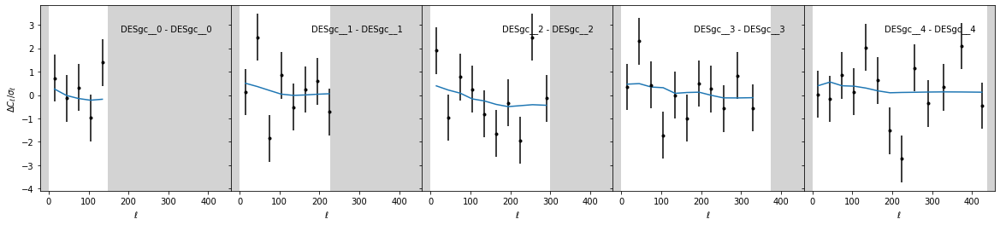

In [52]:
#
dtype = 'cl_00'
tr1 = 'DESgc'
tr2 = 'DESgc'
range1 = 5
range2 = 5
#
f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
#
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2 + f'__{j}'
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di1, alld_bfi1, (tr1i, tr2j), return_res=True)
    ells_SD, cls_SD = get_ell_cl_bf_arr(dec_di, dec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel] 
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_SD - cls_alld) / err)
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()
    

#### DESgc - DESwl

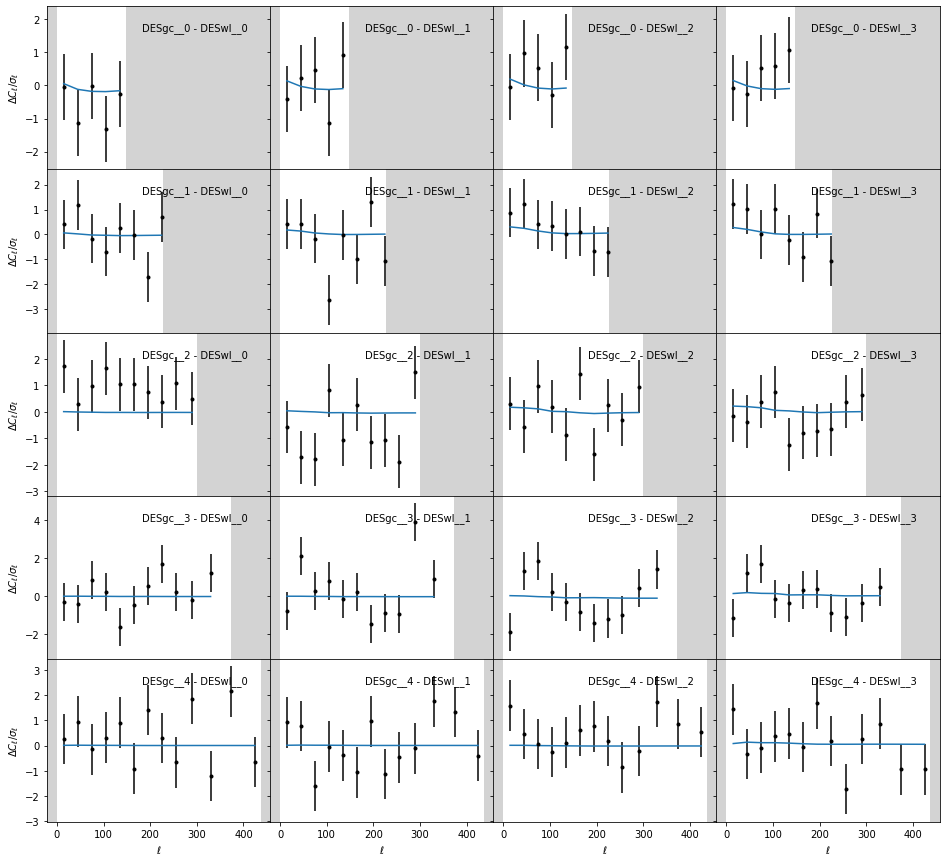

In [53]:
dtype = 'cl_0e'
tr1 = 'DESgc'
tr2 = 'DESwl'
range1 = 5
range2 = 4

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex='col', sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(range2):
        tr2j = tr2 + f'__{j}'
        # Select correct Cells in the bf array:
        ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di1, alld_bfi1, (tr1i, tr2j), return_res=True)
        ells_SD, cls_SD = get_ell_cl_bf_arr(dec_di, dec_bfi, (tr1i, tr2j))
        # Load Cell
        ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Keep scales in the MCMC
        sel = np.in1d(ell, ells_alld)
        ell = ell[sel]
        cl = cl[sel]
        err = err[sel] 
        # Plot (Cl_data - Cl_alld_bf) / sigma_ell
        axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
    #     axs[i, j].plot(ells_alld, res)
        # Plot ND
        axs[i, j].plot(ells_alld, (cls_SD - cls_alld) / err)
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DESwl - DESwl

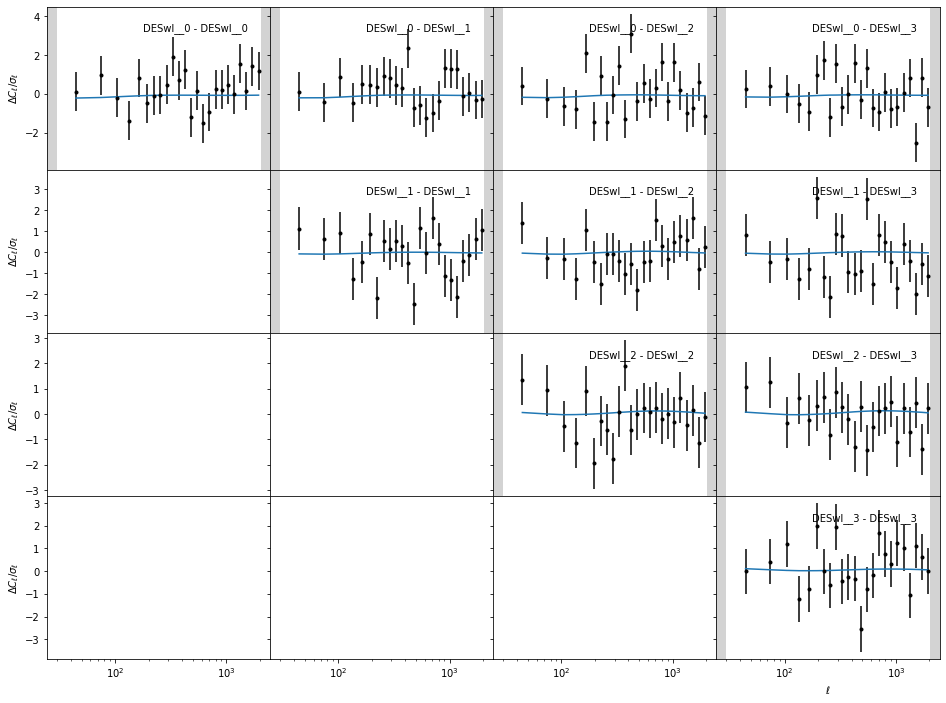

In [54]:
dtype = 'cl_ee'
tr1 = 'DESwl'
tr2 = 'DESwl'
range1 = 4
range2 = 4

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(i, range2):
        tr2j = tr2 + f'__{j}'
        # Select correct Cells in the bf array:
        ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di1, alld_bfi1, (tr1i, tr2j), return_res=True)
        ells_SD, cls_SD = get_ell_cl_bf_arr(dec_di, dec_bfi, (tr1i, tr2j))
        # Load Cell
        ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Keep scales in the MCMC
        sel = np.in1d(ell, ells_alld)
        ell = ell[sel]
        cl = cl[sel]
        err = err[sel] 
        # Plot (Cl_data - Cl_alld_bf) / sigma_ell
        axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
    #     axs[i, j].plot(ells_alld, res)
        # Plot ND
        axs[i, j].plot(ells_alld, (cls_SD - cls_alld) / err)
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xscale('log')
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DESgc - PLAcv

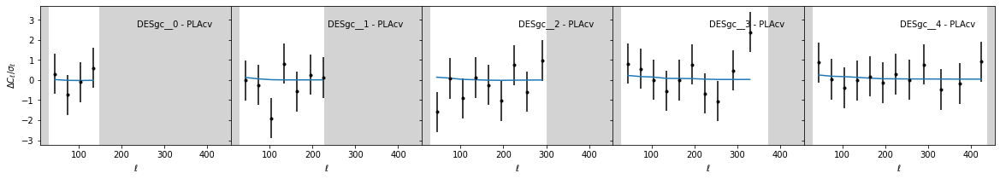

In [55]:
dtype = 'cl_00'
tr1 = 'DESgc'
tr2 = 'PLAcv'
range1 = 1
range2 = 5

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di1, alld_bfi1, (tr1i, tr2j), return_res=True)
    ells_SD, cls_SD = get_ell_cl_bf_arr(dec_di, dec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel] 
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_SD - cls_alld) / err)
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DESwl - PLAcv

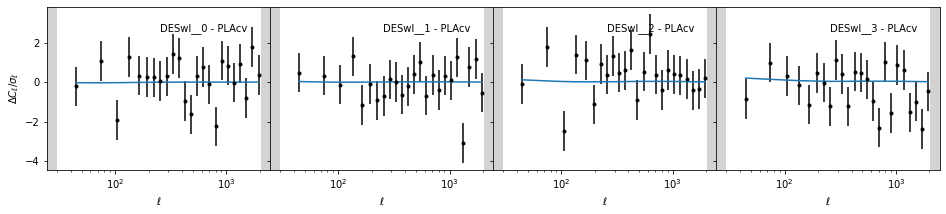

In [56]:
dtype = 'cl_0e'
tr1 = 'DESwl'
tr2 = 'PLAcv'
range1 = 1
range2 = 4

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di1, alld_bfi1, (tr1i, tr2j), return_res=True)
    ells_SD, cls_SD = get_ell_cl_bf_arr(dec_di, dec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel] 
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_SD - cls_alld) / err)
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### eBOSS - eBOSS

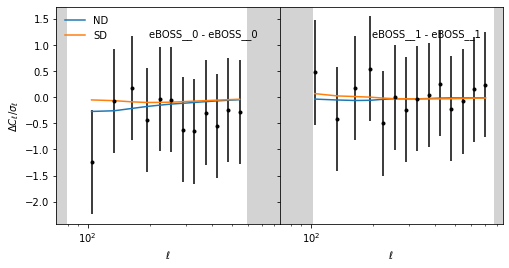

In [57]:
dtype = 'cl_00'
tr1 = 'eBOSS'
tr2 = 'eBOSS'
range1 = 1
range2 = 2
info = dec_di

f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))

i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2 + f'__{j}'
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di1, alld_bfi1, (tr1i, tr2j), return_res=True)
    ells_SD, cls_SD = get_ell_cl_bf_arr(dec_di, dec_bfi, (tr1i, tr2j))
    ells_ND, cls_ND = get_ell_cl_bf_arr(Dkec_di, Dkec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel] 
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_ND - cls_alld) / err, label='ND')
    # Plot SD
    axs[i, j].plot(ells_alld, (cls_SD - cls_alld) / err, label='SD')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
axs[0, 0].legend(loc='upper left', frameon=False)
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### eBOSS - PLAcv

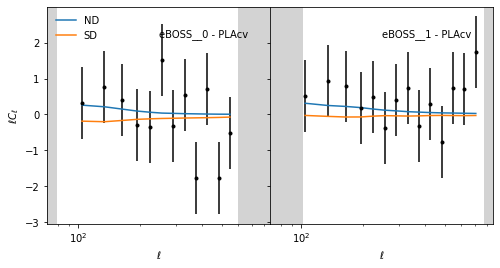

In [58]:
dtype = 'cl_00'
tr1 = 'eBOSS'
tr2 = 'PLAcv'
range1 = 1
range2 = 2
info = dec_di

f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))

i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di1, alld_bfi1, (tr1i, tr2j), return_res=True)
    ells_SD, cls_SD = get_ell_cl_bf_arr(dec_di, dec_bfi, (tr1i, tr2j))
    ells_ND, cls_ND = get_ell_cl_bf_arr(Dkec_di, Dkec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel] 
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot SD
    axs[i, j].plot(ells_alld, (cls_SD - cls_alld) / err, label='ND')
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_ND - cls_alld) / err, label='SD')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
axs[0, 0].legend(loc='upper left', frameon=False)
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DLS - DLS

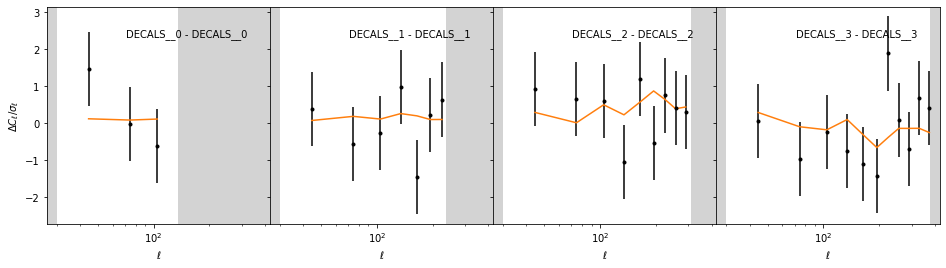

In [59]:
dtype = 'cl_00'
tr1 = 'DECALS'
tr2 = 'DECALS'
range1 = 4
range2 = 4
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))

i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2 + f'__{j}'
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di2, alld_bfi2, (tr1i, tr2j), return_res=True)
    ells_ND, cls_ND = get_ell_cl_bf_arr(Dkec_di, Dkec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sK.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel] 
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_ND - cls_alld) / err, color=DCOLORS[1])
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(Dkec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DLS - KiDS

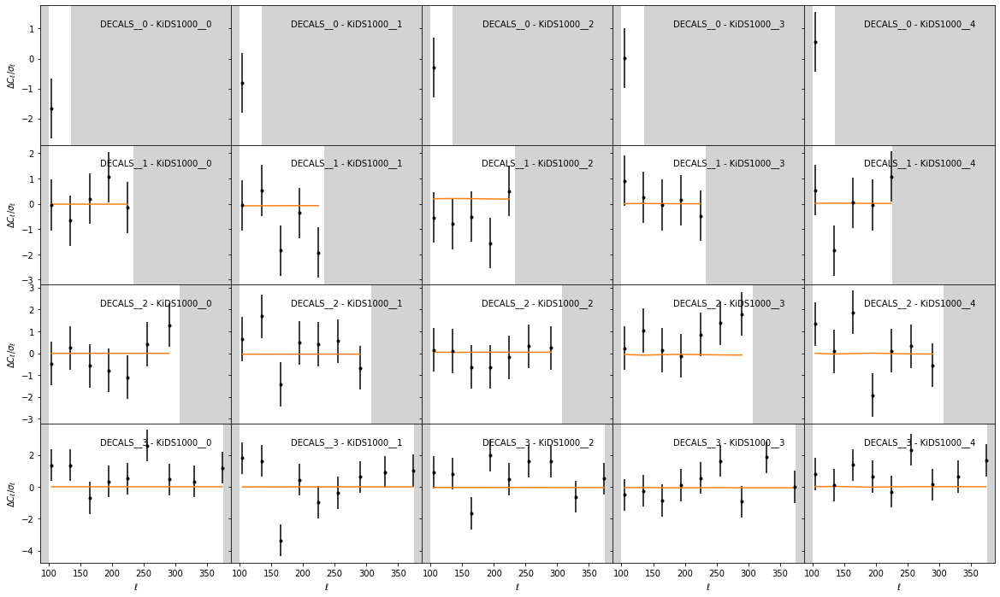

In [60]:
dtype = 'cl_0e'
tr1 = 'DECALS'
tr2 = 'KiDS1000'
range1 = 4
range2 = 5
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(range2):
        tr2j = tr2 + f'__{j}'
        # Select correct Cells in the bf array:
        ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di2, alld_bfi2, (tr1i, tr2j), return_res=True)
        ells_ND, cls_ND = get_ell_cl_bf_arr(Dkec_di, Dkec_bfi, (tr1i, tr2j))
        # Load Cell
        ell, cl, cov = sK.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Keep scales in the MCMC
        sel = np.in1d(ell, ells_alld)
        ell = ell[sel]
        cl = cl[sel]
        err = err[sel]
        # Plot (Cl_data - Cl_alld_bf) / sigma_ell
        axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
    #     axs[i, j].plot(ells_alld, res)
        # Plot ND
        axs[i, j].plot(ells_alld, (cls_ND - cls_alld) / err, color=DCOLORS[1])
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(Dkec_yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DLS - PLAcv

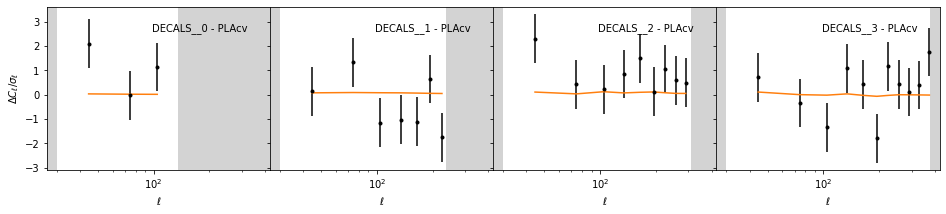

In [61]:
dtype = 'cl_00'
tr1 = 'DECALS'
tr2 = 'PLAcv'
range1 = 1
range2 = 4
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di2, alld_bfi2, (tr1i, tr2j), return_res=True)
    ells_ND, cls_ND = get_ell_cl_bf_arr(Dkec_di, Dkec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sK.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel]
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_ND - cls_alld) / err, color=DCOLORS[1])
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(Dkec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### KiDS - KiDS

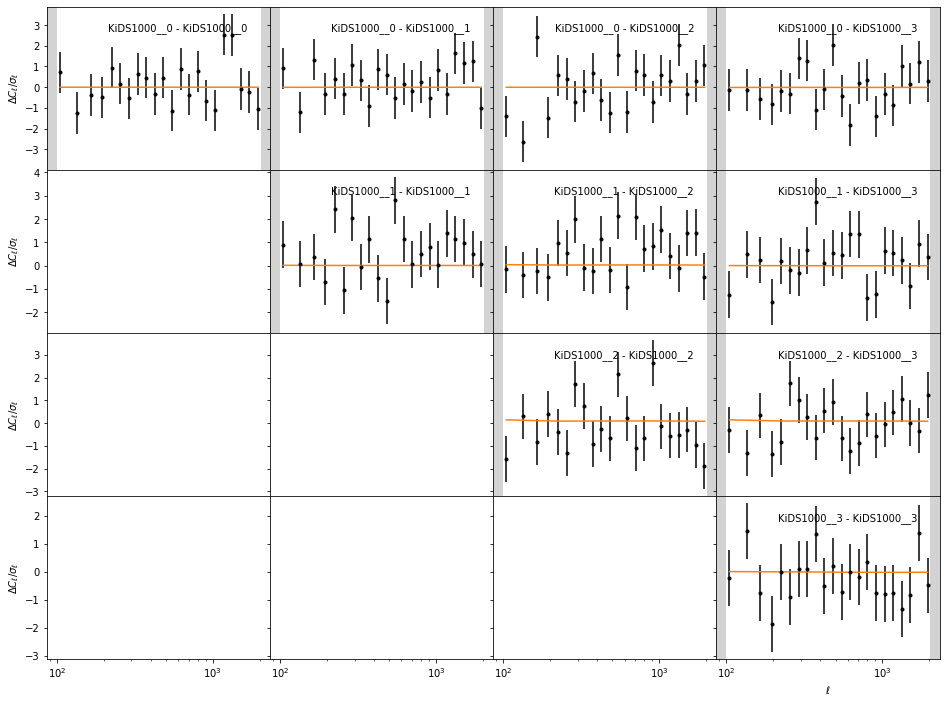

In [62]:
dtype = 'cl_ee'
tr1 = 'KiDS1000'
tr2 = 'KiDS1000'
range1 = 4
range2 = 4

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(i, range2):
        tr2j = tr2 + f'__{j}'
        # Select correct Cells in the bf array:
        ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di2, alld_bfi2, (tr1i, tr2j), return_res=True)
        ells_ND, cls_ND = get_ell_cl_bf_arr(Dkec_di, Dkec_bfi, (tr1i, tr2j))
        # Load Cell
        ell, cl, cov = sK.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Keep scales in the MCMC
        sel = np.in1d(ell, ells_alld)
        ell = ell[sel]
        cl = cl[sel]
        err = err[sel]
        # Plot (Cl_data - Cl_alld_bf) / sigma_ell
        axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
    #     axs[i, j].plot(ells_alld, res)
        # Plot ND
        axs[i, j].plot(ells_alld, (cls_ND - cls_alld) / err, color=DCOLORS[1])
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(Dkec_yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xscale('log')
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### KiDS - PLAcv

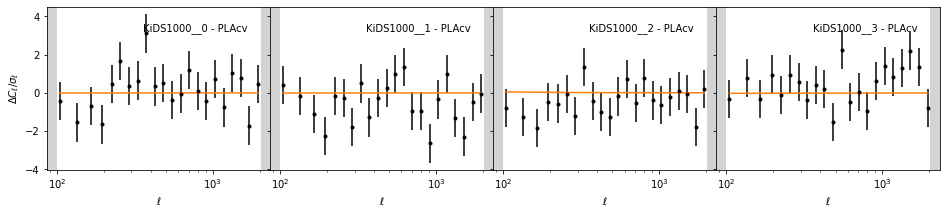

In [63]:
dtype = 'cl_0e'
tr1 = 'KiDS1000'
tr2 = 'PLAcv'
range1 = 1
range2 = 4
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Select correct Cells in the bf array:
    ells_alld, cls_alld, res = get_ell_cl_bf_arr(alld_di2, alld_bfi2, (tr1i, tr2j), return_res=True)
    ells_ND, cls_ND = get_ell_cl_bf_arr(Dkec_di, Dkec_bfi, (tr1i, tr2j))
    # Load Cell
    ell, cl, cov = sK.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Keep scales in the MCMC
    sel = np.in1d(ell, ells_alld)
    ell = ell[sel]
    cl = cl[sel]
    err = err[sel]
    # Plot (Cl_data - Cl_alld_bf) / sigma_ell
    axs[i, j].errorbar(ells_alld, (cl - cls_alld) / err, np.ones_like(cls_alld), fmt='k.')
#     axs[i, j].plot(ells_alld, res)
    # Plot ND
    axs[i, j].plot(ells_alld, (cls_ND - cls_alld) / err, color=DCOLORS[1])
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(Dkec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\Delta C_\ell / \sigma_\ell$')
plt.savefig('./S8z_figures/residuals/res_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

### $C_\ell$

#### DESgc - DESgc

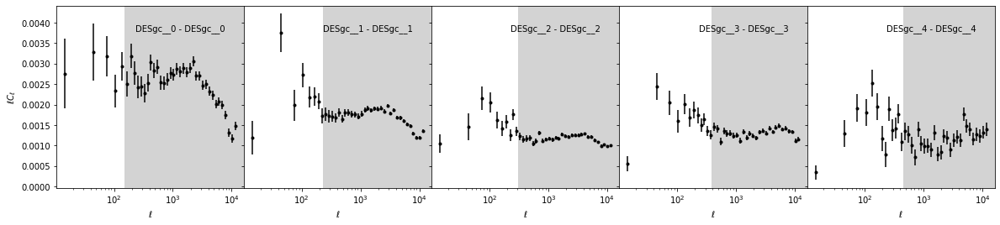

In [64]:
dtype = 'cl_00'
tr1 = 'DESgc'
tr2 = 'DESgc'
range1 = 5
range2 = 5
info = dec_di

f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))

i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2 + f'__{j}'
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DESgc - DESwl

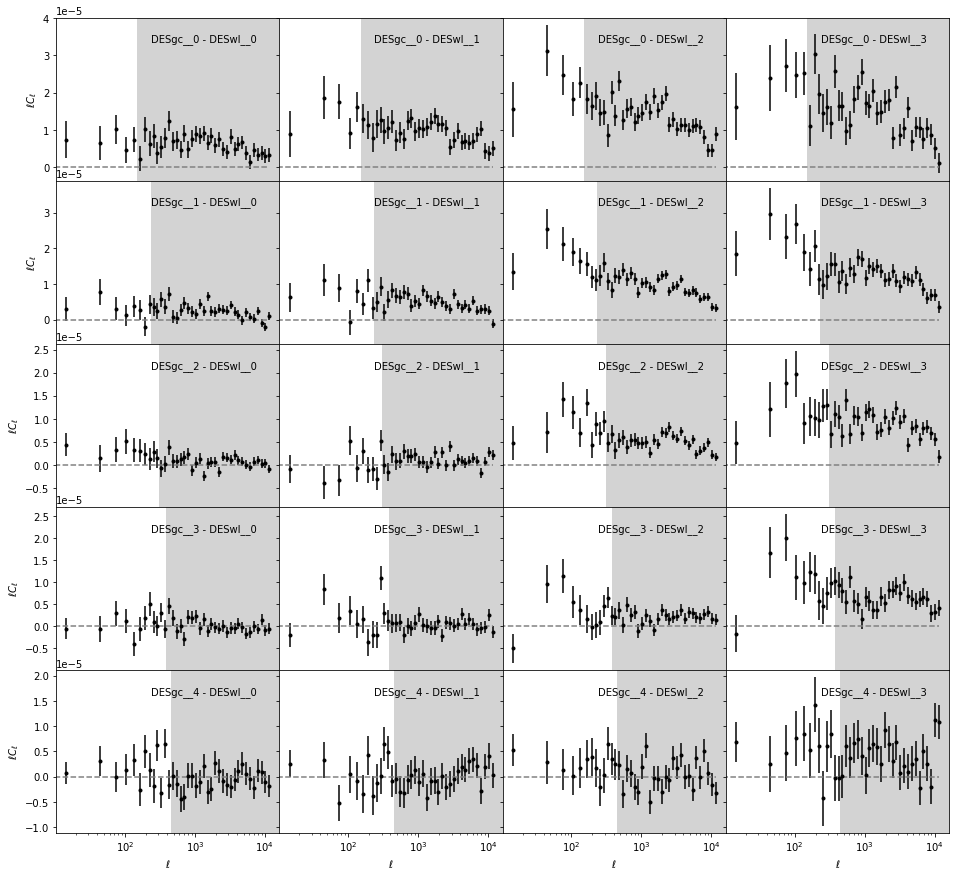

In [65]:
dtype = 'cl_0e'
tr1 = 'DESgc'
tr2 = 'DESwl'
range1 = 5
range2 = 4

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(range2):
        tr2j = tr2 + f'__{j}'
        # Load Cell
        ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Plot ell * cl st it's ~ flat
        axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
        # Plot a line at 0 to distinguish which are compatible with 0
        axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xscale('log')
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DESwl - DESwl

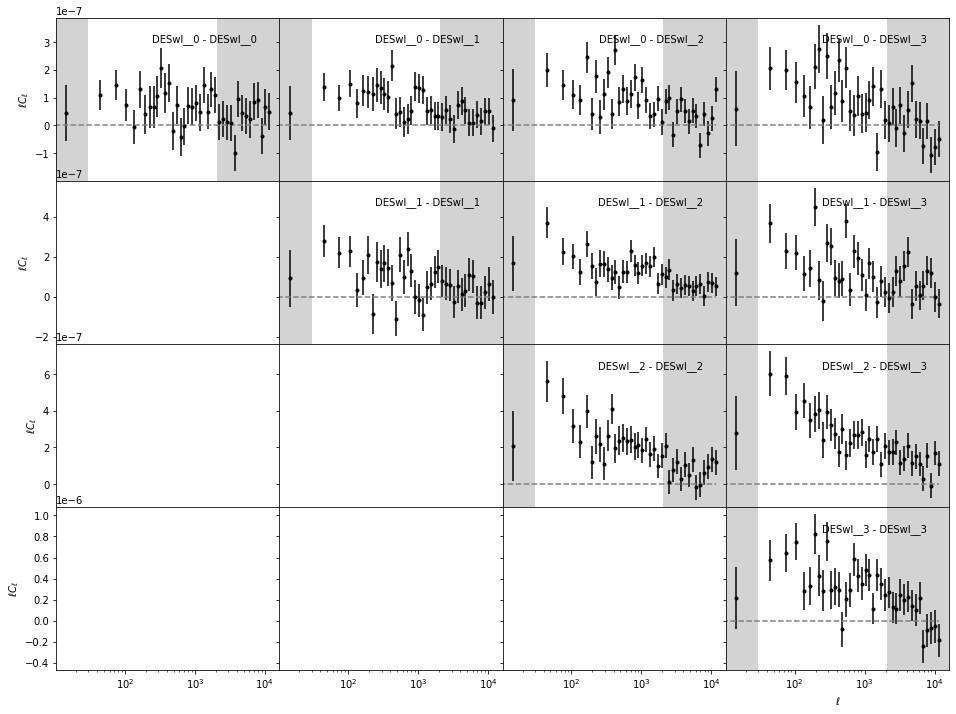

In [66]:
dtype = 'cl_ee'
tr1 = 'DESwl'
tr2 = 'DESwl'
range1 = 4
range2 = 4

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(i, range2):
        tr2j = tr2 + f'__{j}'
        # Load Cell
        ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Plot ell * cl st it's ~ flat
        axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
        # Plot a line at 0 to distinguish which are compatible with 0
        axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xscale('log')
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DESgc - PLAcv

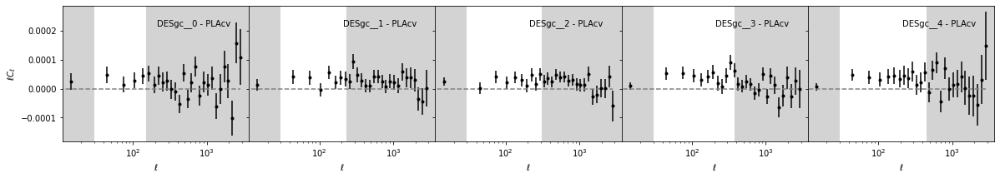

In [67]:
dtype = 'cl_00'
tr1 = 'DESgc'
tr2 = 'PLAcv'
range1 = 1
range2 = 5

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Remove ell > 3000 as cov is to large
    sel = ell < 3000
    err = err[sel]
    cl = cl[sel]
    ell = ell[sel]
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Plot a line at 0 to distinguish which are compatible with 0
    axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DESwl - PLAcv

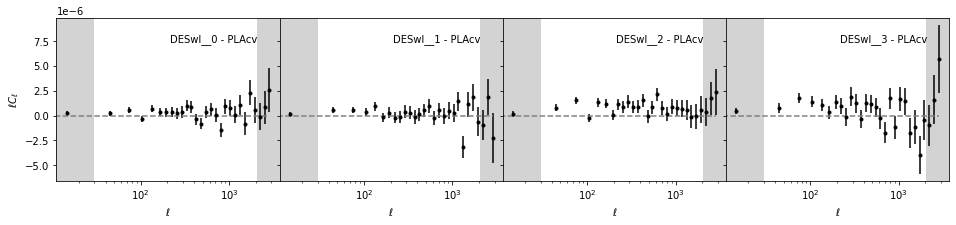

In [68]:
dtype = 'cl_0e'
tr1 = 'DESwl'
tr2 = 'PLAcv'
range1 = 1
range2 = 4

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Remove ell > 3000 as cov is to large
    sel = ell < 3000
    err = err[sel]
    cl = cl[sel]
    ell = ell[sel]
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Plot a line at 0 to distinguish which are compatible with 0
    axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### <span style="color:red"> eBOSS - eBOSS </span>

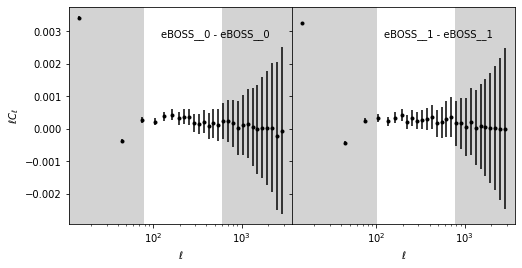

In [69]:
dtype = 'cl_00'
tr1 = 'eBOSS'
tr2 = 'eBOSS'
range1 = 1
range2 = 2
info = dec_di

f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))

i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2 + f'__{j}'
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Remove ell > 3000 as cov is to large
    sel = ell < 3000
    err = err[sel]
    cl = cl[sel]
    ell = ell[sel]
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### eBOSS - PLAcv

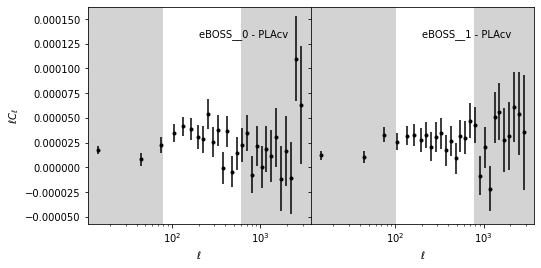

In [70]:
dtype = 'cl_00'
tr1 = 'eBOSS'
tr2 = 'PLAcv'
range1 = 1
range2 = 2
info = dec_di

f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))

i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2
    # Load Cell
    ell, cl, cov = sG.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Remove ell > 3000 as cov is to large
    sel = ell < 3000
    err = err[sel]
    cl = cl[sel]
    ell = ell[sel]
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(dec_yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DLS - DLS

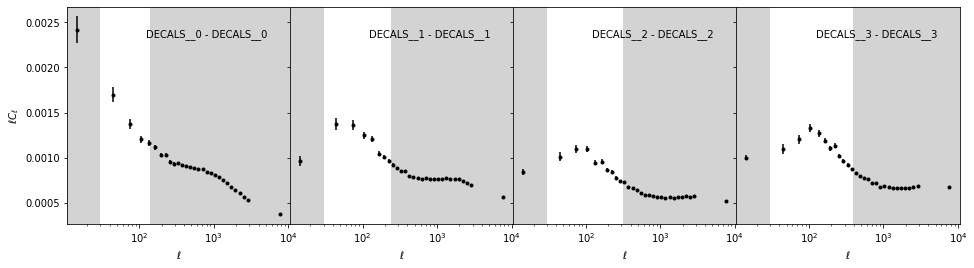

In [71]:
dtype = 'cl_00'
tr1 = 'DECALS'
tr2 = 'DECALS'
range1 = 4
range2 = 4
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(1, range2, figsize=(range2 * 4, 4 * 1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))

i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    tr2j = tr2 + f'__{j}'
    # Load Cell
    ell, cl, cov = sFile.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DLS - KiDS

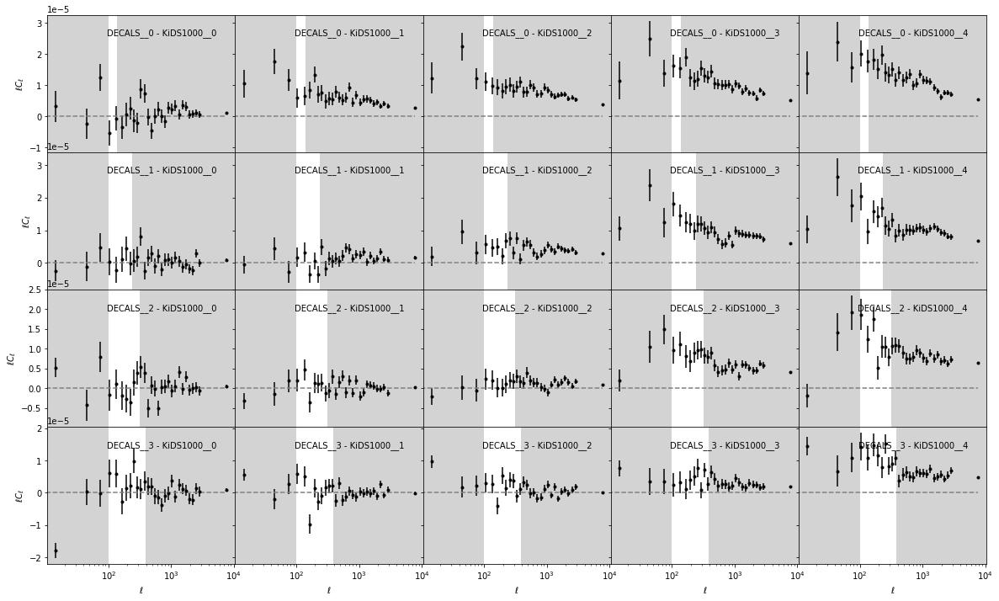

In [72]:
dtype = 'cl_0e'
tr1 = 'DECALS'
tr2 = 'KiDS1000'
range1 = 4
range2 = 5
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(range2):
        tr2j = tr2 + f'__{j}'
        # Load Cell
        ell, cl, cov = sFile.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Plot ell * cl st it's ~ flat
        axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
        # Plot a line at 0 to distinguish which are compatible with 0
        axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xscale('log')
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### DLS - PLAcv

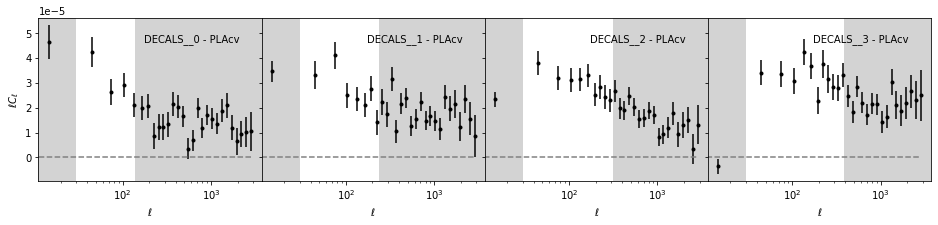

In [73]:
dtype = 'cl_00'
tr1 = 'DECALS'
tr2 = 'PLAcv'
range1 = 1
range2 = 4
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Load Cell
    ell, cl, cov = sFile.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Remove ell > 3000 as cov is to large
    sel = ell < 3000
    err = err[sel]
    cl = cl[sel]
    ell = ell[sel]
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Plot a line at 0 to distinguish which are compatible with 0
    axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### KiDS - KiDS

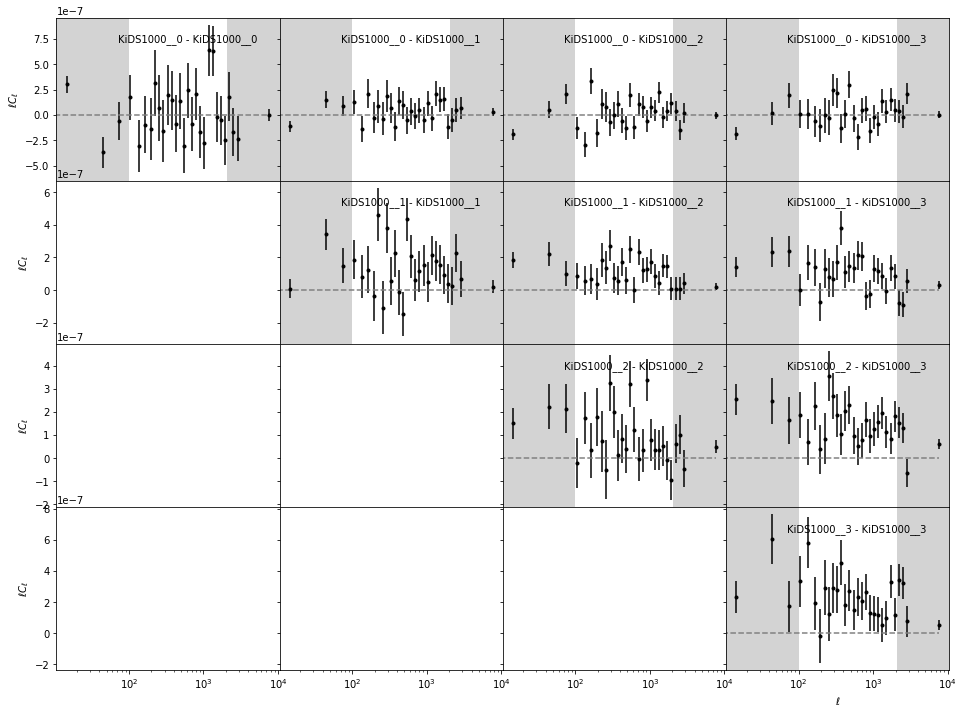

In [74]:
dtype = 'cl_ee'
tr1 = 'KiDS1000'
tr2 = 'KiDS1000'
range1 = 4
range2 = 4
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')

for i in range(range1):
    tr1i = tr1 + f'__{i}'
    for j in range(i, range2):
        tr2j = tr2 + f'__{j}'
        # Load Cell
        ell, cl, cov = sFile.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
        err = np.sqrt(np.diag(cov))
        # Plot ell * cl st it's ~ flat
        axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
        # Plot a line at 0 to distinguish which are compatible with 0
        axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
        # Shadow excluded region
        axs[i, j].set_facecolor('lightgray')
        ell1, ell2 = get_ellcuts(yml, tr1i, tr2j)
        axs[i, j].axvspan(ell1, ell2, color='white')
        # Add text
        axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
                  verticalalignment='top', transform=axs[i, j].transAxes)
        # Format axes
        axs[i, j].set_xscale('log')
        axs[i, j].set_xlabel(r'$\ell$')
    axs[i, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

#### KiDS - PLAcv

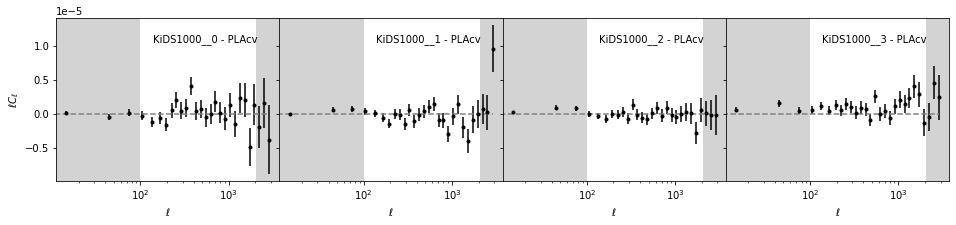

In [75]:
dtype = 'cl_0e'
tr1 = 'KiDS1000'
tr2 = 'PLAcv'
range1 = 1
range2 = 4
sFile = sK
info = Dkec_di
yml = Dkec_yml

f, axs = plt.subplots(range1, range2, figsize=(range2 * 4, 3 * range1), 
                      gridspec_kw={'hspace': 0, 'wspace': 0},
                      sharex=True, sharey='row')
axs = axs.reshape((1, range2))
tr2j = tr2
i = 0
for j in range(range2):
    tr1i = tr1 + f'__{j}'
    # Load Cell
    ell, cl, cov = sFile.get_ell_cl(dtype, tr1i, tr2j, return_cov=True)
    err = np.sqrt(np.diag(cov))
    # Remove ell > 3000 as cov is to large
    sel = ell < 3000
    err = err[sel]
    cl = cl[sel]
    ell = ell[sel]
    # Plot ell * cl st it's ~ flat
    axs[i, j].errorbar(ell, ell * cl, ell * err, fmt='k.')
    # Plot a line at 0 to distinguish which are compatible with 0
    axs[i, j].plot([0, ell[-1]], [0, 0], ls='--', c='gray')
    # Shadow excluded region
    axs[i, j].set_facecolor('lightgray')
    ell1, ell2 = get_ellcuts(yml, tr1i, tr2j)
    axs[i, j].axvspan(ell1, ell2, color='white')
    # Add text
    axs[i, j].text(0.9, 0.9, tr1i + ' - ' + tr2j, horizontalalignment='right', 
              verticalalignment='top', transform=axs[i, j].transAxes)
    # Format axes
    axs[i, j].set_xscale('log')
    axs[i, j].set_xlabel(r'$\ell$')
axs[0, 0].set_ylabel(r'$\ell C_\ell$')
plt.savefig('./S8z_figures/Cells/Cell_{}_{}.pdf'.format(tr1i.split('__')[0], tr2j.split('__')[0]))
plt.show()
plt.close()

### New dpk effect (DELS nodes) (not included)

In [122]:
# f, axs = plt.subplots(1, 2, figsize=(7.2, 2.7), sharey=True) #, gridspec_kw={'wspace': 0.1})

# for cl, label, chain in zip(['dec_bin_s2', 'comp'],
#                             ['Quadratic', 'Linear'],
#                             [dec_bin_s2, dec_bin_s2l]):
#     sigma8z = []
#     for p in chain.paramNames.list():
#         if 'S8z' in p:
#             z = float(p.split('_')[-1])
#             if z > 2:
#                 break
#             InlineLatex = chain.getInlineLatex(p, limit=1)
# #             print(InlineLatex)
#             sigma8z.append(extract_info(InlineLatex))
#     sigma8z = np.array(sigma8z).T
#     axs[0].plot(sigma8z[0], sigma8z[1], label=label,
#              color=pcolor[cl])
#     axs[0].fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5,
#                      color=pcolor[cl])
        
# for zi in [0.24, 0.53, 0.83, 1.5]: 
#     axs[0].axvline(zi, ls='--', color=pcolor['Dkec_bin_s2'])
    
# ###### New dpks #######################
# for cl, label, chain in zip(['Dkec_bin_s2', 'comp'],
#                             [r'Nodes DES$g$', 'Nodes DELS'],
#                             [Dkec_bin_s2, Dkec_bin_s2_ndpk]):
#     sigma8z = []
#     for p in chain.paramNames.list():
#         if 'S8z' in p:
#             z = float(p.split('_')[-1])
#             if z > 2:
#                 break
#             InlineLatex = chain.getInlineLatex(p, limit=1)
# #             print(InlineLatex)
#             sigma8z.append(extract_info(InlineLatex))
#     sigma8z = np.array(sigma8z).T
#     axs[1].plot(sigma8z[0], sigma8z[1], label=label,
#              color=pcolor[cl])
#     axs[1].fill_between(sigma8z[0], sigma8z[1] + sigma8z[2], sigma8z[1] - sigma8z[3], alpha=.5,
#                      color=pcolor[cl])
#     if 'DELS' in label:
#         z_nodes = [0.21, 0.52, 0.66, 1.5]
#     else: 
#         z_nodes = [0.24, 0.53, 0.83, 1.5]
        
#     for zi in z_nodes: 
#         axs[1].axvline(zi, ls='--', color=pcolor[cl]) 
    
# for i in range(2):
#     axs[i].set_xlabel('$z$')
#     axs[i].legend()
#     axs[i].set_xlim([0, 2.0])

# axs[0].set_ylabel('$S_8(z) = \sigma_8(z) \sqrt{\Omega_m / 0.3}$')
# # plt.title(r'Comparing splines')
# plt.legend(frameon=True)
# plt.tight_layout()
# plt.savefig('./S8z_figures/SD_splines_dpks.pdf')
# plt.show()
# plt.close()

### Referee: $f \sigma_8$

In [69]:
def plot_fsigma8_data(ax, label, color):
#     z, mean, err = np.loadtxt('../data/fs8_2014.txt', usecols=(1,2,3), unpack=True)

    # From https://www.sdss.org/science/final-bao-and-rsd-measurements/
    z = np.array([0.15, 0.380, 0.510, 0.700, 0.850, 1.48])
    mean = np.array([0.53, 0.500, 0.455, 0.448, 0.315, 0.462])
    err = np.array([0.16, 0.047, 0.039, 0.048, 0.095, 0.045])


    ax.errorbar(z, mean, err, label=label, color=color, fmt='.', capsize=3)

In [75]:
dec_bin_s2_fs8 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-04_10000000_fsigma8_',
                            settings={'ignore_rows':0.25})

Dkec_bin_s2_fs8 = getdist.loadMCSamples('./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8_',
                            settings={'ignore_rows':0.1})

alld_bin_s2_fs8 = getdist.loadMCSamples('./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000_fsigma8_',
                             settings={'ignore_rows':0.25})


./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__3.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__4.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__5.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__2.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__8.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__1.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__6.txt
./cl_cross_corr_v3_DECaLS_K1000_eBOSS_CMB_binning_softer_2_mag_correctMag/2021-06-06_10000000_fsigma8__7.txt
Removed 0.1 as burn in
./cl_cross_corr_v3_DES_K1000_all_binning_softer_2_mag_correctMag/2021-06-07_10000000_fsigma8__8.txt
./cl_

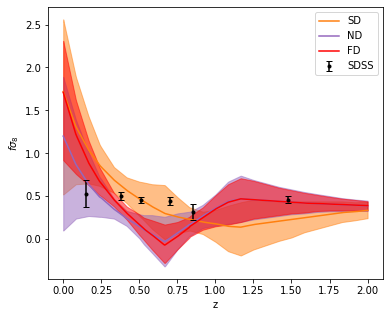

In [79]:
chains = [dec_bin_s2_fs8, Dkec_bin_s2_fs8, alld_bin_s2_fs8]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2', 'alld_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

f, axs = plt.subplots(1, 1, figsize=(6, 5), sharex=True, gridspec_kw={'hspace': 0.00})

for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'fsigma8' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(axs, sigma8z, label, cl, kind='linear')
plot_fsigma8_data(axs, 'SDSS', 'k')
# axs.set_xlim([0.25, 1.5])
plt.xlabel('z')
plt.ylabel('$f\sigma_8$')
plt.legend(loc=0)
plt.show()
plt.close()

### Referee: EdS S8(z) with our constraints

In [52]:
def plot_EdS_sigma8(ax, z, sigma8, errors, label, color):
    if type(errors) is float:
        low = up = errors
    else:
        low, up = errors
        
    a = 1 / (1 + z)
    D_EdS = a 
    mean = D_EdS * sigma8
    up = D_EdS * (sigma8 + up)
    down = D_EdS * (sigma8 - low)

    ax.plot(z, mean, label=label, color=color)
    
    ax.fill_between(z, mean, up, alpha=.5, color=cl)
    ax.fill_between(z, mean, down, alpha=.5, color=cl)

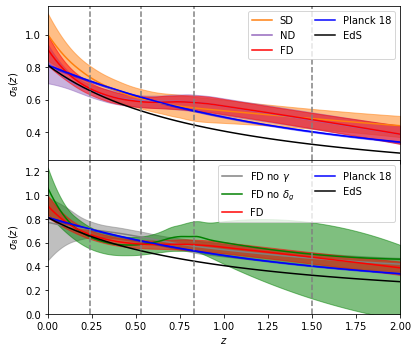

In [57]:
#  DES + eBOSS + CMBk
#  DECaLS + K1000 + eBOSS + CMBk
#  All together
#  Planck 18

chains = [dec_bin_s2, Dkec_bin_s2, alld_bin_s2]
ckeys = ['dec_bin_s2', 'Dkec_bin_s2', 'alld_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

f, axs = plt.subplots(2, 1, figsize=(6, 5), sharex=True, gridspec_kw={'hspace': 0.00})

for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(axs[0], sigma8z, label, cl)

    
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = pcolor['p18']
label = plabels['p18']
sigma8z = []
for p in chain.paramNames.list():
    if 'sigma8z_' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
sigma8z[0, :] = p18_zarr
plot_interp1d_S8z(axs[0], sigma8z, label, cl)


# Add EdS growth
InlineLatex = chain.getInlineLatex('sigma8', limit=1)
# sigma8, low, up = extract_info(InlineLatex)
sigma8, low, up = 0.8111, 0.006, 0.006
plot_EdS_S8z(axs[0], np.linspace(0, 2), sigma8, errors=(low, up), label='EdS', color='k')

####################### FD 2 ###########################

chains = [alld_noSh_bin_s2, alld_noCl_bin_s2, alld_bin_s2]
ckeys = ['alld_noSh_bin_s2', 'alld_noCl_bin_s2', 'alld_bin_s2']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in ckeys]

for cl, label, chain in zip(contour_colors, legend_labels, chains):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'sigma8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(axs[1], sigma8z, label, cl)
    
# Planck 18 has no z info in the S8z names
chain = p18
cl = pcolor['p18']
label = plabels['p18']
sigma8z = []
for p in chain.paramNames.list():
    if 'sigma8z_' in p:
        InlineLatex = chain.getInlineLatex(p, limit=1)
        sigma8z.append(extract_info(InlineLatex))
sigma8z = np.array(sigma8z).T
sigma8z[0, :] = p18_zarr
plot_interp1d_S8z(axs[1], sigma8z, label, cl)


# Add EdS growth
# InlineLatex = chain.getInlineLatex('sigma8', limit=1)
# sigma8, low, up = extract_info(InlineLatex)
sigma8, low, up = 0.8111, 0.006, 0.006
plot_EdS_S8z(axs[1], np.linspace(0, 2), sigma8, errors=(low, up), label='EdS', color='k')

#########################


for i in range(2):
    for zi in [0.24, 0.53, 0.83, 1.5]: 
            axs[i].axvline(zi, ls='--', color='gray')    
    axs[i].set_ylabel('$\sigma_8(z)$')
    axs[i].legend(ncol=2)
# axs[0].set_ylim([0.2, None])
axs[1].set_ylim([0, None])
axs[1].set_xlim([0, 2])
axs[1].set_xlabel('$z$')
plt.tight_layout()
# plt.savefig('./S8z_figures/FD_s8z_EdS.pdf')
plt.show()
plt.close()

### Referee: MCMC with dpk nodes on $\Omega_c$ + $\sigma_8$

In [82]:
chain = getdist.loadMCSamples('./cl_cross_corr_v3_referee_chi2_tests/S8z_prior/2021-08-09_10000000_',
                              settings={'ignore_rows':0.1})

In [83]:
p = chain.getParams()

In [84]:
np.max(p.Omega_m)

0.9997482

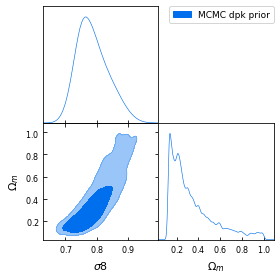

In [85]:
g = plots.get_subplot_plotter()
g.triangle_plot(chain, ['sigma8', 'Omega_m'],
                filled=True, 
                legend_labels=['MCMC dpk prior'],
                
                )

In [86]:
chain.getInlineLatex('Omega_m', 3)

'\\Omega_{m } = 0.34^{+0.65}_{-0.23}'

In [52]:
print(chain.getTable().tableTex())

\begin{tabular} { l  c}

 Parameter &  95\% limits\\
\hline
{\boldmath$\sigma8        $} & $0.787^{+0.11}_{-0.090}    $\\

{\boldmath$\Omega_{c }    $} & $0.29^{+0.46}_{-0.23}      $\\

{\boldmath$\Omega_{m }    $} & $0.34^{+0.46}_{-0.23}      $\\

{\boldmath$S_{8 }         $} & $0.82^{+0.72}_{-0.39}      $\\
\hline
\end{tabular}


## Talk plots

### $N(z)$

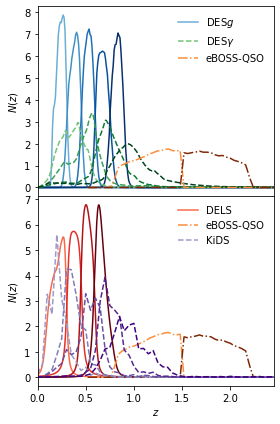

In [92]:
cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 5)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 4)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

# Create a 2x 2 panel figure with A) kernels and B) N(z) for both N&S data sets
f, ax = plt.subplots(2, 1, figsize=(4, 6), gridspec_kw={'hspace':0, 'wspace': 0},
                    sharex=True, sharey='row')

#############################
####### South data set ######
#############################

# Create CCL Tracers
ccl_tracers = {}
for n, t in sG.tracers.items():
    t = sG.tracers[n]
    if 'DESgc' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = f'DES$g$'
    elif 'eBOSS' in n:
        factor = 2
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
    elif 'DESwl' in n:
        factor = 2
        cmap = cmap_wl
        ls = '--'
        label = r'DES$\gamma$'
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'

    color = next(cmap)
    if 'CMB' in label:
        pass
#         ax[0].plot([0], [0], c=color, ls=ls, label=label if ('0' in n) or ('cv' in n) else '')
    else:
        ### N(z)
        c = np.sum(t.nz[:-1] * np.diff(t.z))
        nz = t.nz / c

        ax[0].plot(t.z, nz, c=color, ls=ls, label=label if ('0' in n) or ('cv' in n) else '')

    
#############################
####### North data set ######
#############################

cmap_gc = iter(plt.cm.get_cmap('Reds')(np.linspace(0.5, 1, 4)))
cmap_wl = iter(plt.cm.get_cmap('Purples')(np.linspace(0.5, 1, 5)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))
    
ccl_tracers = {}
for n, t in sK.tracers.items():    
    t = sK.tracers[n]
    if 'DECALS' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = 'DELS'
    elif 'eBOSS' in n:
        factor = 1.5
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
    elif 'KiDS' in n:
        factor = 1.5
        cmap = cmap_wl
        ls = '--'
        label = 'KiDS'
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'

    color = next(cmap)
    if 'CMB' in label:
        pass
        # ax[1].plot([0], [0], c=color, ls=ls, label=label if ('_0' in n) or ('cv' in n) else '')
    else:
        ### N(z)
        c = np.sum(t.nz[:-1] * np.diff(t.z))
        nz = t.nz / c

        ax[1].plot(t.z, nz, c=color, ls=ls, label=label if ('_0' in n) or ('cv' in n) else '')

#### Finish plot ####    

ax[0].legend(frameon=False)
ax[1].legend(frameon=False)

ax[1].set_xlim([0, 2.45])

ax[1].set_xlabel('$z$')

ax[0].set_ylabel('$N(z)$')
ax[1].set_ylabel('$N(z)$')
plt.tight_layout()
plt.savefig('./S8z_figures/Nz_talk.pdf')
plt.show()
plt.close()

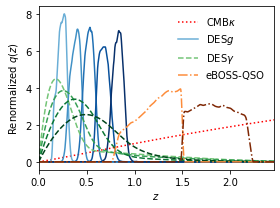

In [83]:
import pyccl as ccl

cosmo = ccl.CosmologyVanillaLCDM()
z = np.linspace(0, 2.5, 1000)
chi = ccl.comoving_radial_distance(cosmo, 1/(1+z))

cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 5)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 4)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

# Create a 2x 2 panel figure with A) kernels and B) N(z) for both N&S data sets
f, ax = plt.subplots(1, 1, figsize=(4, 3), gridspec_kw={'hspace':0, 'wspace': 0},
                    sharex=True, sharey='row')

#############################
####### South data set ######
#############################

# Create CCL Tracers
ccl_tracers = {}
for n, t in sG.tracers.items():
    t = sG.tracers[n]
    if 'DESgc' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = f'DES$g$'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)
    elif 'eBOSS' in n:
        factor = 2
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)        
    elif 'DESwl' in n:
        factor = 2
        cmap = cmap_wl
        ls = '--'
        label = r'DES$\gamma$'
        ccl_tracers[n] = ccl.WeakLensingTracer(cosmo, (t.z, t.nz))
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'
        ccl_tracers[n] = ccl.CMBLensingTracer(cosmo, z_source=1100)
        
    color = next(cmap)
    # Kernel
    kernel = ccl_tracers[n].get_kernel(chi)
    ax.plot(z, factor * kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls,
           label=label if ('_0' in n) or ('cv' in n) else '')
    
#### Finish plot ####    

ax.legend(frameon=False)

ax.set_xlim([0, 2.45])

ax.set_xlabel('$z$')

ax.set_ylabel('Renormalized $q(z)$')
plt.tight_layout()
plt.savefig('./S8z_figures/qz_talk.pdf')
plt.show()
plt.close()

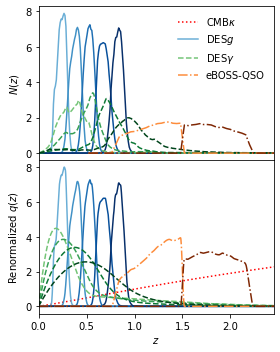

In [84]:
import pyccl as ccl

cosmo = ccl.CosmologyVanillaLCDM()
z = np.linspace(0, 2.5, 1000)
chi = ccl.comoving_radial_distance(cosmo, 1/(1+z))

cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 5)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 4)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

# Create a 2x 2 panel figure with A) kernels and B) N(z) for both N&S data sets
f, ax = plt.subplots(2, 1, figsize=(4, 5), gridspec_kw={'hspace':0, 'wspace': 0},
                    sharex=True, sharey='row')

#############################
####### South data set ######
#############################

# Create CCL Tracers
ccl_tracers = {}
for n, t in sG.tracers.items():
    t = sG.tracers[n]
    if 'DESgc' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = f'DES$g$'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)
    elif 'eBOSS' in n:
        factor = 2
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)        
    elif 'DESwl' in n:
        factor = 2
        cmap = cmap_wl
        ls = '--'
        label = r'DES$\gamma$'
        ccl_tracers[n] = ccl.WeakLensingTracer(cosmo, (t.z, t.nz))
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'
        ccl_tracers[n] = ccl.CMBLensingTracer(cosmo, z_source=1100)
        
    color = next(cmap)
    if 'CMB' in label:
        ax[0].plot([0], [0], c=color, ls=ls, label=label if ('0' in n) or ('cv' in n) else '')
    else:
        ### N(z)
        c = np.sum(t.nz[:-1] * np.diff(t.z))
        nz = t.nz / c

        ax[0].plot(t.z, nz, c=color, ls=ls, label=label if ('0' in n) or ('cv' in n) else '')

    # Kernel
    kernel = ccl_tracers[n].get_kernel(chi)
    ax[1].plot(z, factor * kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls,
           label=label if ('_0' in n) or ('cv' in n) else '')
    
#### Finish plot ####    

ax[0].legend(frameon=False)

ax[1].set_xlim([0, 2.45])

ax[1].set_xlabel('$z$')

ax[0].set_ylabel('$N(z)$')
ax[1].set_ylabel('Renormalized $q(z)$')

plt.tight_layout()
plt.savefig('./S8z_figures/Nz_qz_talk.pdf')
plt.show()
plt.close()

dec_bin_s2l_nm 0.058899618908996865
dec_bin_s2_nm 0.028808011667972477


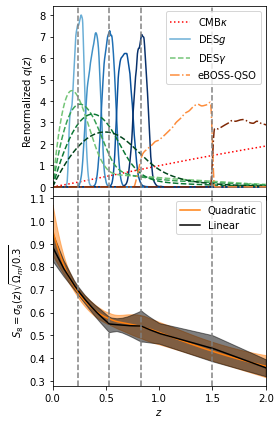

In [14]:
#########################
##### Plot for talk #####
#########################

import pyccl as ccl

cosmo = ccl.CosmologyVanillaLCDM()
z = np.linspace(0, 2.5, 1000)
chi = ccl.comoving_radial_distance(cosmo, 1/(1+z))


### Load the chains used in the v1 on arXiv (no Mag) ###

dec_bin_s2l_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2_linear/2021-04-07_1000000_',
                            settings={'ignore_rows':0.5})

print('dec_bin_s2l_nm', dec_bin_s2l_nm.getGelmanRubin(30))
add_S8z_at_nodes(dec_bin_s2l_nm)

# 

dec_bin_s2_nm = getdist.loadMCSamples('./cl_cross_corr_v3_DES_eBOSS_CMB_binning_softer_2/2021-03-29_1000000_',
                            settings={'ignore_rows':0.5})
# add_S8tz(dec_bin_s2)
print('dec_bin_s2_nm', dec_bin_s2_nm.getGelmanRubin(30))
add_S8z_at_nodes(dec_bin_s2_nm)

###

cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 5)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 4)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

# Create a 2x 2 panel figure with A) kernels and B) N(z) for both N&S data sets
f, ax = plt.subplots(2, 1, figsize=(4, 6), gridspec_kw={'hspace':0, 'wspace': 0},
                    sharex=True, sharey='row')

#############################
####### South data set ######
#############################

# Create CCL Tracers
ccl_tracers = {}
for n, t in sG.tracers.items():
    t = sG.tracers[n]
    if 'DESgc' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = f'DES$g$'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)
    elif 'eBOSS' in n:
        factor = 2
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)        
    elif 'DESwl' in n:
        factor = 2
        cmap = cmap_wl
        ls = '--'
        label = r'DES$\gamma$'
        ccl_tracers[n] = ccl.WeakLensingTracer(cosmo, (t.z, t.nz))
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'
        ccl_tracers[n] = ccl.CMBLensingTracer(cosmo, z_source=1100)

    color = next(cmap)
    # Kernel
    kernel = ccl_tracers[n].get_kernel(chi)
    ax[0].plot(z, factor * kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls,
           label=label if ('_0' in n) or ('cv' in n) else '')
    
    
#### Add second panel with binning ####
for cl, label, chain in zip(['dec_bin_s2', 'comp'],
                            ['Quadratic', 'Linear'],
                            [dec_bin_s2_nm, dec_bin_s2l_nm]):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(ax[1], sigma8z, label, pcolor[cl], kind=label.lower())
      
#### Finish plot ####    
for zi in [0.24, 0.53, 0.83, 1.5]: 
    ax[0].axvline(zi, ls='--', color='gray')  
    ax[1].axvline(zi, ls='--', color='gray')  
    
ax[0].set_ylabel('Renormalized $q(z)$')
ax[1].set_xlabel('$z$')
ax[1].set_ylabel('$S_8 = \sigma_8(z) \sqrt{\Omega_m / 0.3}$')
ax[1].set_xlim([0, 2])
# ax[0].set_ylim([0, None])
ax[0].legend(frameon=True)
ax[1].legend(frameon=True)
plt.tight_layout()
plt.savefig('./S8z_figures/qz_bin_talk_v1.pdf')
plt.show()
plt.close()

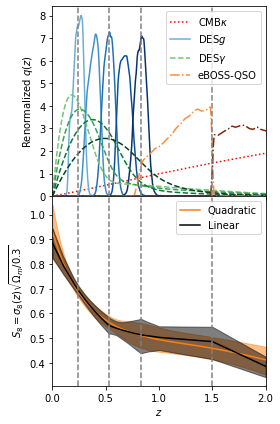

In [90]:
#########################
##### Plot for talk #####
#########################

import pyccl as ccl

cosmo = ccl.CosmologyVanillaLCDM()
z = np.linspace(0, 2.5, 1000)
chi = ccl.comoving_radial_distance(cosmo, 1/(1+z))

###

cmap_gc = iter(plt.cm.get_cmap('Blues')(np.linspace(0.5, 1, 5)))
cmap_wl = iter(plt.cm.get_cmap('Greens')(np.linspace(0.5, 1, 4)))
cmap_eB = iter(plt.cm.get_cmap('Oranges')(np.linspace(0.5, 1, 2)))

# Create a 2x 2 panel figure with A) kernels and B) N(z) for both N&S data sets
f, ax = plt.subplots(2, 1, figsize=(4, 6), gridspec_kw={'hspace':0, 'wspace': 0},
                    sharex=True, sharey='row')

#############################
####### South data set ######
#############################

# Create CCL Tracers
ccl_tracers = {}
for n, t in sG.tracers.items():
    t = sG.tracers[n]
    if 'DESgc' in n:
        factor = 1
        cmap = cmap_gc
        ls = '-'
        label = f'DES$g$'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)
    elif 'eBOSS' in n:
        factor = 2
        cmap = cmap_eB
        ls = '-.'
        label = 'eBOSS-QSO'
        ccl_tracers[n] = ccl.NumberCountsTracer(cosmo, dndz=(t.z, t.nz), bias=(t.z, t.z/t.z), has_rsd=False)        
    elif 'DESwl' in n:
        factor = 2
        cmap = cmap_wl
        ls = '--'
        label = r'DES$\gamma$'
        ccl_tracers[n] = ccl.WeakLensingTracer(cosmo, (t.z, t.nz))
    else:
        factor = 3
        cmap = iter(['red'])
        ls = ':'
        label = r'CMB$\kappa$'
        ccl_tracers[n] = ccl.CMBLensingTracer(cosmo, z_source=1100)

    color = next(cmap)
    # Kernel
    kernel = ccl_tracers[n].get_kernel(chi)
    ax[0].plot(z, factor * kernel[0]/ np.sum((z[1]-z[0])*kernel[0]), c=color, ls=ls,
           label=label if ('_0' in n) or ('cv' in n) else '')
    
    
#### Add second panel with binning ####
for cl, label, chain in zip(['dec_bin_s2', 'comp'],
                            ['Quadratic', 'Linear'],
                            [dec_bin_s2, dec_bin_s2l]):
    sigma8z = []
    pnames = chain.paramNames.list()
    pnames.sort()
    for p in pnames:
        if 'S8z' in p:
            z = float(p.split('_')[-1])
            if z > 2:
                continue
            InlineLatex = chain.getInlineLatex(p, limit=1)
#             print(InlineLatex)
            sigma8z.append(extract_info(InlineLatex))
    sigma8z = np.array(sigma8z).T
    plot_interp1d_S8z(ax[1], sigma8z, label, pcolor[cl], kind=label.lower())
      
#### Finish plot ####    
for zi in [0.24, 0.53, 0.83, 1.5]: 
    ax[0].axvline(zi, ls='--', color='gray')  
    ax[1].axvline(zi, ls='--', color='gray')  
    
ax[0].set_ylabel('Renormalized $q(z)$')
ax[1].set_xlabel('$z$')
ax[1].set_ylabel('$S_8 = \sigma_8(z) \sqrt{\Omega_m / 0.3}$')
ax[1].set_xlim([0, 2])
ax[0].set_ylim([0, None])
ax[0].legend(frameon=True)
ax[1].legend(frameon=True)
plt.tight_layout()
plt.savefig('./S8z_figures/qz_bin_talk.pdf')
plt.show()
plt.close()

### $S_8$ - $\Omega_m$

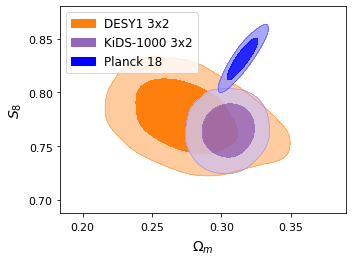

In [98]:
#  DESwl + CMBk
#  DESgc + eBOSS + CMBk
#  DES + eBOSS + CMBk
#  DES

chains = [d_oficial, k3x2_oficial, p18]
ckeys = ['dec', 'Dkec', 'p18']
lkeys = ['d3x2', 'k3x2', 'p18']
contour_colors = [pcolor[c] for c in ckeys]
legend_labels = [plabels[c] for c in lkeys]

######
g = plots.get_single_plotter(width_inch=5)
g.plot_2d(chains, ['Omega_m', 'S_8'],
                filled=True, 
                colors=contour_colors)
g.add_legend(legend_labels, legend_loc='upper left')
g.finish_plot()
plt.savefig('./S8z_figures/DES_KiDS_P18_S8_talk.pdf')
plt.show()
plt.close()